In [22]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

from matplotlib.dates import date2num
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from datetime import datetime
import xarray as xr
import netCDF4 as nc
import glob
import math
import subprocess
from matplotlib import colormaps
import plotly.graph_objs as go

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import seaborn as sns
import csv
import pandas as pd
from scipy.optimize import curve_fit
from math import prod

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT
from metpy.units import units
from metpy.calc import dewpoint_from_relative_humidity
#from metpy.io import get_test_data

import sys, os
import requests
import pyart
import h5py

import warnings
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

#%matplotlib notebook

plt.style.use('default')


#import dask
#from dask.distributed import Client, progress, wait
#dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
#client = Client()
#client

#dask.config.set(scheduler='threads', num_workers=2)

from dask.distributed import Client
import dask

# Dashboard config for JupyterHub (optional)
dask.config.config.get('distributed').get('dashboard').update({
    'link': '{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'
})

# Start Dask client with controlled resources
client = Client(n_workers=4, threads_per_worker=2, memory_limit='20GB') # This will use 4*2=8 CPU threads
#client


2025-11-19 13:32:33,145 - distributed.scheduler - WARNING - Removing worker 'tcp://127.0.0.1:40125' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {'getattr-ba7c6627-319b-4336-97d1-ce76a347f57d', 'getattr-a63237d2-2288-485e-8408-2c12155bcbc6', 'getattr-e0dad49e-baf3-4637-ba2f-80c6a318bd95', 'open_dataset-0308d390-fe71-44df-8882-706f41279d21', 'open_dataset-679c70bd-5c64-4743-979e-16c2c8758768', 'open_dataset-55e7124d-4dc9-43df-a4fe-1908cb44a47f', 'open_dataset-c64bbfd6-ffc1-4726-8eb8-af5737ed3a54', 'open_dataset-392449b0-0429-4d0d-8802-75fa14f484a3', 'getattr-a9e71d91-25e6-41f5-8669-e47bdf1b5fe9', 'open_dataset-769cddd2-bdec-4cc4-92c7-024af9778533', 'getattr-a325b5e9-a8c3-4a4f-b073-36e4ec7fbe81', 'open_dataset-95f5432b-9a21-43e5-a521-fc101316e035', 'open_dataset-25a301e2-3d92-4416-9e70-4e29daf924dc', 'open_dataset-ce593d7c-6b70-4151-b8bb-4803f3c40fdd', 'open_dataset-df980afd-15a8-421a-9b2a-11782a9de8a5', 'getattr-fc6e37bd-d4c3-4510-b54d-7bd118c

In [2]:
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_1427 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_1427[lwp_1427 < 0.] = np.nan


SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']
SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


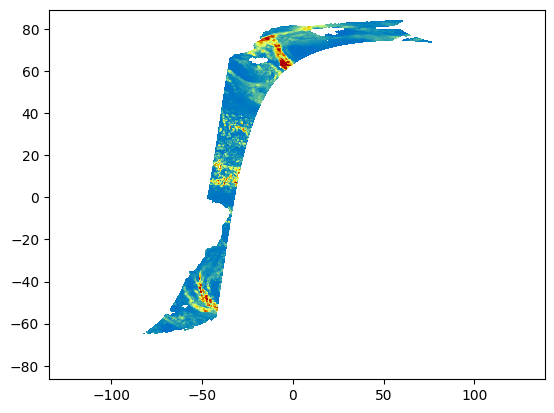

In [3]:

lev=np.linspace(0,1,200)
plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='HomeyerRainbow')

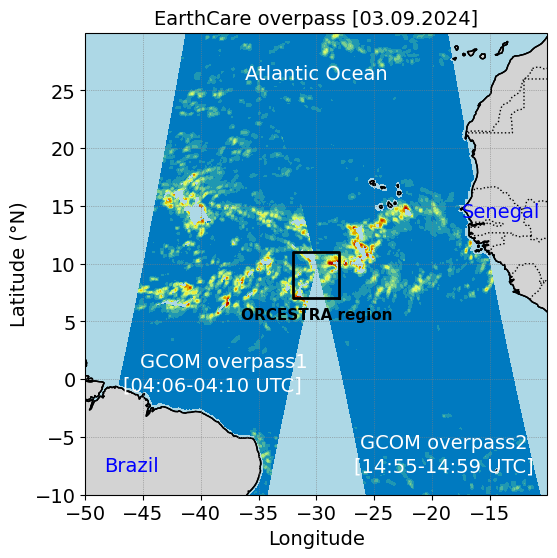

In [4]:
## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


#ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
#        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
#        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
#        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

#ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 5.2, "ORCESTRA region", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k', fontweight='bold')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))
ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('EarthCare overpass [03.09.2024]', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='white')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

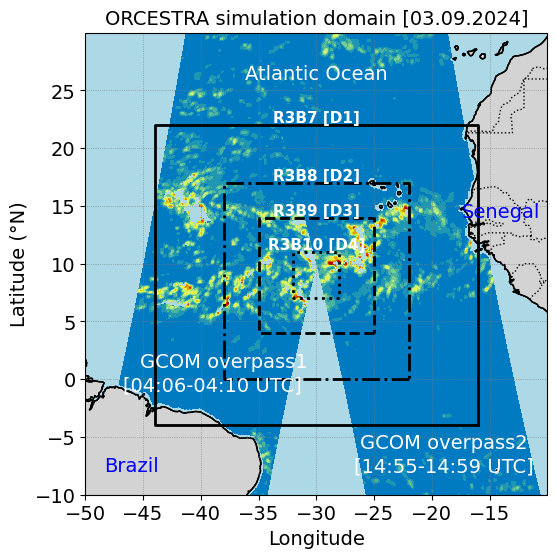

In [5]:
## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain [03.09.2024]', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='white')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

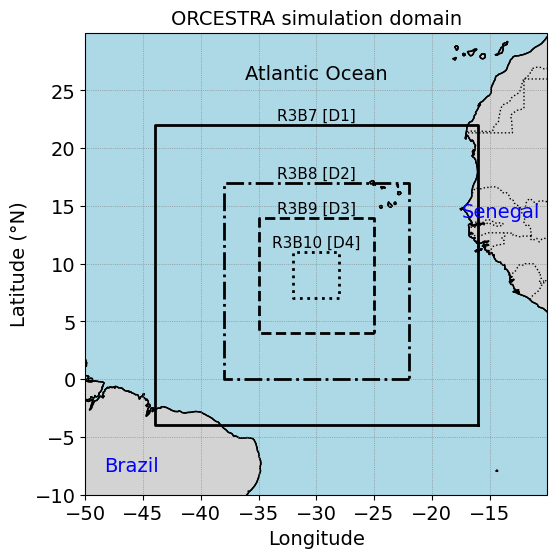

In [5]:
## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

#plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
#plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

ax.text(-30., 22.4, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 17.4, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 14.4, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 11.4, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 26., "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-14, 14., "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


#ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
##plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

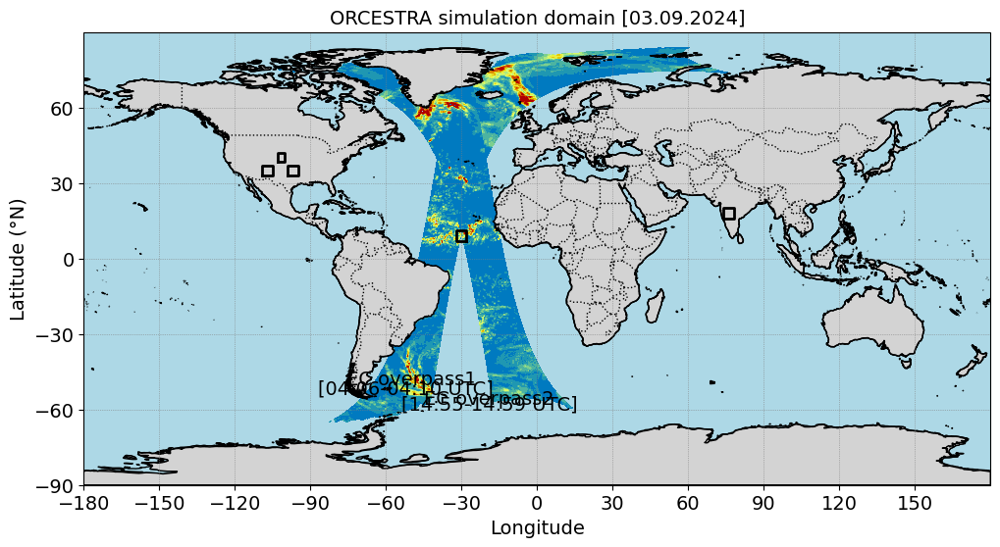

In [6]:
## ORCESTRA 3 Sept 2024 domain

lon1_orcestra = [-16., -44.];
lat1_orcestra = [-4., 22.];

lon2_orcestra = [-22., -38.];
lat2_orcestra = [-0., 17.];

lon3_orcestra = [-25., -35.];
lat3_orcestra = [4, 14.];

lon4_orcestra = [-28., -32.];
lat4_orcestra = [7., 11.];

lon1_mc3e = [np.rad2deg(-1.907365), np.rad2deg(-1.478035)];
lat1_mc3e = [np.rad2deg(0.3955399), np.rad2deg(0.8262644)];

lon2_mc3e = [np.rad2deg(-1.835135), np.rad2deg(-1.550694)];
lat2_mc3e = [np.rad2deg(0.4688762), np.rad2deg(0.7529294)];

lon3_mc3e = [np.rad2deg(-1.781484), np.rad2deg(-1.604435)];
lat3_mc3e = [np.rad2deg(0.522396), np.rad2deg(0.6993479)];

lon4_mc3e = [np.rad2deg(-1.728496), np.rad2deg(-1.657436)];
lat4_mc3e = [np.rad2deg(0.5753464), np.rad2deg(0.6463881)];

lon1_caipeex = [np.rad2deg(1.111786), np.rad2deg(1.540838)];
lat1_caipeex = [np.rad2deg(0.1000659), np.rad2deg(0.5284007)];

lon2_caipeex = [np.rad2deg(1.184192), np.rad2deg(1.468616)];
lat2_caipeex = [np.rad2deg(0.172241), np.rad2deg(0.4561395)];

lon3_caipeex = [np.rad2deg(1.255452), np.rad2deg(1.397565)];
lat3_caipeex = [np.rad2deg(0.2432072), np.rad2deg(0.3851319)];

lon4_caipeex = [np.rad2deg(1.290886), np.rad2deg(1.362008)];
lat4_caipeex = [np.rad2deg(0.2786696), np.rad2deg(0.3496378)];

lon1_dcmex = [np.rad2deg(-2.082353), np.rad2deg(-1.652943)];
lat1_dcmex = [np.rad2deg(0.3967664), np.rad2deg(0.824777)];

lon2_dcmex = [np.rad2deg(-2.0096), np.rad2deg(-1.725414)];
lat2_dcmex = [np.rad2deg(0.4688776), np.rad2deg(0.752984)];

lon3_dcmex = [np.rad2deg(-1.955971), np.rad2deg(-1.779007)];
lat3_dcmex = [np.rad2deg(0.52241), np.rad2deg(0.6993262)];

lon4_dcmex = [np.rad2deg(-1.902997), np.rad2deg(-1.831995)];
lat4_dcmex = [np.rad2deg(0.5753667), np.rad2deg(0.6463902)];

lon1_steps = [np.rad2deg(-2.029706), np.rad2deg(-1.53023)];
lat1_steps = [np.rad2deg(0.45), np.rad2deg(0.95)];

lon2_steps = [np.rad2deg(-1.95), np.rad2deg(-1.60)];
lat2_steps = [np.rad2deg(0.52), np.rad2deg(0.88)];

lon3_steps = [np.rad2deg(-1.87), np.rad2deg(-1.67)];
lat3_steps = [np.rad2deg(0.6), np.rad2deg(0.80)];

lon4_steps = [np.rad2deg(-1.8), np.rad2deg(-1.75)];
lat4_steps = [np.rad2deg(0.67), np.rad2deg(0.73)];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')

## ORCESTRA
#ax.plot([lon1_orcestra[0], lon1_orcestra[1], lon1_orcestra[1], lon1_orcestra[0], lon1_orcestra[0]], 
#        [lat1_orcestra[0], lat1_orcestra[0], lat1_orcestra[1], lat1_orcestra[1], lat1_orcestra[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2_orcestra[0], lon2_orcestra[1], lon2_orcestra[1], lon2[0], lon2_orcestra[0]], 
#        [lat2_orcestra[0], lat2_orcestra[0], lat2_orcestra[1], lat2_orcestra[1], lat2_orcestra[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3_orcestra[0], lon3_orcestra[1], lon3_orcestra[1], lon3_orcestra[0], lon3_orcestra[0]], 
#        [lat3_orcestra[0], lat3_orcestra[0], lat3_orcestra[1], lat3_orcestra[1], lat3_orcestra[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4_orcestra[0], lon4_orcestra[1], lon4_orcestra[1], lon4_orcestra[0], lon4_orcestra[0]], 
        [lat4_orcestra[0], lat4_orcestra[0], lat4_orcestra[1], lat4_orcestra[1], lat4_orcestra[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

## STEPS
#ax.plot([lon1_steps[0], lon1_steps[1], lon1_steps[1], lon1_steps[0], lon1_steps[0]], 
#        [lat1_steps[0], lat1_steps[0], lat1_steps[1], lat1_steps[1], lat1_steps[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2_steps[0], lon2_steps[1], lon2_steps[1], lon2[0], lon2_steps[0]], 
#        [lat2_steps[0], lat2_steps[0], lat2_steps[1], lat2_steps[1], lat2_steps[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3_steps[0], lon3_steps[1], lon3_steps[1], lon3_steps[0], lon3_steps[0]], 
#        [lat3_steps[0], lat3_steps[0], lat3_steps[1], lat3_steps[1], lat3_steps[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4_steps[0], lon4_steps[1], lon4_steps[1], lon4_steps[0], lon4_steps[0]], 
        [lat4_steps[0], lat4_steps[0], lat4_steps[1], lat4_steps[1], lat4_steps[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

## DCMEX
#ax.plot([lon1_dcmex[0], lon1_dcmex[1], lon1_dcmex[1], lon1_dcmex[0], lon1_dcmex[0]], 
#        [lat1_dcmex[0], lat1_dcmex[0], lat1_dcmex[1], lat1_dcmex[1], lat1_dcmex[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2_dcmex[0], lon2_dcmex[1], lon2_dcmex[1], lon2[0], lon2_dcmex[0]], 
#        [lat2_dcmex[0], lat2_dcmex[0], lat2_dcmex[1], lat2_dcmex[1], lat2_dcmex[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3_dcmex[0], lon3_dcmex[1], lon3_dcmex[1], lon3_dcmex[0], lon3_dcmex[0]], 
#        [lat3_dcmex[0], lat3_dcmex[0], lat3_dcmex[1], lat3_dcmex[1], lat3_dcmex[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4_dcmex[0], lon4_dcmex[1], lon4_dcmex[1], lon4_dcmex[0], lon4_dcmex[0]], 
        [lat4_dcmex[0], lat4_dcmex[0], lat4_dcmex[1], lat4_dcmex[1], lat4_dcmex[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

## MC3E
#ax.plot([lon1_mc3e[0], lon1_mc3e[1], lon1_mc3e[1], lon1_mc3e[0], lon1_mc3e[0]], 
#        [lat1_mc3e[0], lat1_mc3e[0], lat1_mc3e[1], lat1_mc3e[1], lat1_mc3e[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2_mc3e[0], lon2_mc3e[1], lon2_mc3e[1], lon2[0], lon2_mc3e[0]], 
#        [lat2_mc3e[0], lat2_mc3e[0], lat2_mc3e[1], lat2_mc3e[1], lat2_mc3e[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3_mc3e[0], lon3_mc3e[1], lon3_mc3e[1], lon3_mc3e[0], lon3_mc3e[0]], 
#        [lat3_mc3e[0], lat3_mc3e[0], lat3_mc3e[1], lat3_mc3e[1], lat3_mc3e[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4_mc3e[0], lon4_mc3e[1], lon4_mc3e[1], lon4_mc3e[0], lon4_mc3e[0]], 
        [lat4_mc3e[0], lat4_mc3e[0], lat4_mc3e[1], lat4_mc3e[1], lat4_mc3e[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

## CAIPEEX
#ax.plot([lon1_caipeex[0], lon1_caipeex[1], lon1_caipeex[1], lon1_caipeex[0], lon1_caipeex[0]],
#        [lat1_caipeex[0], lat1_caipeex[0], lat1_caipeex[1], lat1_caipeex[1], lat1_caipeex[0]],
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

#ax.plot([lon2_caipeex[0], lon2_caipeex[1], lon2_caipeex[1], lon2[0], lon2_caipeex[0]],
#        [lat2_caipeex[0], lat2_caipeex[0], lat2_caipeex[1], lat2_caipeex[1], lat2_caipeex[0]],
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

#ax.plot([lon3_caipeex[0], lon3_caipeex[1], lon3_caipeex[1], lon3_caipeex[0], lon3_caipeex[0]],
#        [lat3_caipeex[0], lat3_caipeex[0], lat3_caipeex[1], lat3_caipeex[1], lat3_caipeex[0]],
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4_caipeex[0], lon4_caipeex[1], lon4_caipeex[1], lon4_caipeex[0], lon4_caipeex[0]],
        [lat4_caipeex[0], lat4_caipeex[0], lat4_caipeex[1], lat4_caipeex[1], lat4_caipeex[0]],
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())


plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

#ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

#ax.set_xlim(-50., -10.)
#ax.set_ylim(-10., 30.)
#ax.set_xticks(range(-50, -10, 5))  
#ax.set_yticks(range(-10, 30, 5))

ax.set_xlim(-180., 180.)
ax.set_ylim(-90., 90.)
ax.set_xticks(range(-180, 180, 30))  
ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain [03.09.2024]', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
#ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='white')
#ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
#ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


ax.text(-50, -50, "EC overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-52, -54, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-19, -58, "EC overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-19, -60, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

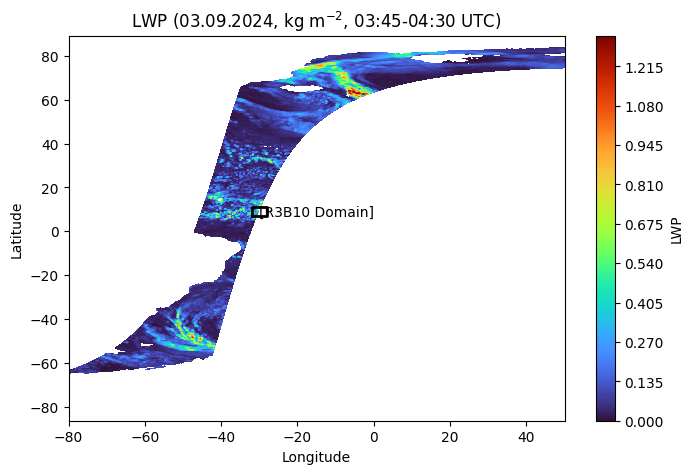

In [7]:

lon_dom = [-28., -32.];
lat_dom = [7., 11.];
  

# longitudes should be ordered correctly for a rectangle:
lon_min, lon_max = sorted(lon_dom)
lat_min, lat_max = sorted(lat_dom)

# Corners of the rectangle
lon_box = [lon_min, lon_max, lon_max, lon_min, lon_min]
lat_box = [lat_min, lat_min, lat_max, lat_max, lat_min]

plt.figure(figsize=(8,5))
plt.contourf(lon_0345, lat_0345, lwp_0345, levels=300, shading='auto', cmap='turbo')
plt.plot(lon_box, lat_box, 'k-', linewidth=2)
plt.text(-15., 7, "[R3B10 Domain]", fontsize=10, ha='center', color='k')
plt.xlim(-80,50)
#plt.ylim(7,11)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('LWP (03.09.2024, kg m$^{-2}$, 03:45-04:30 UTC)')
plt.colorbar(label='LWP')
plt.show()


In [23]:


file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/sull_ds';
#ds_4sip_2Sept15utc = xr.open_mfdataset(f'{file_path}/4sip/start_2Sept15utc/orcestra_2mom/NWP_LAM_icongrid_DOM04*.nc', 
#                                       chunks={'time': 4, 'height': 10}, parallel=True);

#ds_4sip_2Sept18utc = xr.open_mfdataset(f'{file_path}/4sip/start_2Sept18utc/orcestra_2mom/NWP_LAM_icongrid_DOM04*.nc', 
#                                       chunks={'time': 4, 'height': 10}, parallel=True);

#ds_4sip_2Sept00utc = xr.open_mfdataset(f'{file_path}/4sip/start_2Sept00utc/orcestra_2mom1/NWP_LAM_icongrid_DOM04*.nc', 
#                                       chunks={'time': 4, 'height': 10}, parallel=True);

ds_4sip = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/NWP_LAM_icongrid_DOM04_*.nc', 
                            chunks={'time': 4, 'height': 10}, parallel=True);

ds_4sip_hfreq = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/NWP_LAM_highfreq_DOM04_*.nc', 
                                  chunks={'time': 4, 'height': 10}, parallel=True);
#ds_4sip_6km = xr.open_mfdataset(f'{file_path}/control/orcestra_2mom_sip/NWP_LAM_precip_DOM02_*.nc');


/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and

In [3]:

ds_4sip['w_vel'] = -1.*ds_4sip.omega/(9.8*ds_4sip.rho)
ds_4sip['tempc'] = ds_4sip.temp-273.16;
ds_4sip['lwc_gperm3']  = ds_4sip.qc*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tqi'] = ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['tq']  = ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['ciwc_gperm3'] = ds_4sip.qi*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tiwc_gperm3'] = (ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['cdnc_percm3'] = ds_4sip.qnc*ds_4sip.rho*1.e-6  # perkg to percm3
ds_4sip['inc_perl'] = (ds_4sip.qni+ds_4sip.qns+ds_4sip.qng+ds_4sip.qnh)*ds_4sip.rho*1.e-3 # perkg to perl
ds_4sip['inp_perl'] = (ds_4sip.d_qni_het)*ds_4sip.rho*1.e-3 # perkg to perl


ds_4sip_hfreq['w_vel'] = -1.*ds_4sip_hfreq.omega/(9.8*ds_4sip_hfreq.rho)
ds_4sip_hfreq['tempc'] = ds_4sip_hfreq.temp-273.16;
ds_4sip_hfreq['lwc_gperm3']  = ds_4sip_hfreq.qc*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['tqi'] = ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh
ds_4sip_hfreq['tq']  = ds_4sip_hfreq.qc+ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh
ds_4sip_hfreq['ciwc_gperm3'] = ds_4sip_hfreq.qi*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['tiwc_gperm3'] = (ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh)*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['cdnc_percm3'] = ds_4sip_hfreq.qnc*ds_4sip_hfreq.rho*1.e-6  # perkg to percm3
ds_4sip_hfreq['inc_perl'] = (ds_4sip_hfreq.qni+ds_4sip_hfreq.qns+ds_4sip_hfreq.qng+ds_4sip_hfreq.qnh)*ds_4sip_hfreq.rho*1.e-3 # perkg to perl
#ds_4sip_hfreq['inp_perl'] = (ds_4sip_hfreq.d_qni_het)*ds_4sip_hfreq.rho*1.e-3 # perkg to perl


In [5]:

ds_4sip_2Sept15utc['w_vel'] = -1.*ds_4sip_2Sept15utc.omega/(9.8*ds_4sip_2Sept15utc.rho)
ds_4sip_2Sept15utc['tempc'] = ds_4sip_2Sept15utc.temp-273.16;
ds_4sip_2Sept15utc['lwc_gperm3']  = ds_4sip_2Sept15utc.qc*ds_4sip_2Sept15utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept15utc['tqi'] = ds_4sip_2Sept15utc.qi+ds_4sip_2Sept15utc.qs+ds_4sip_2Sept15utc.qg+ds_4sip_2Sept15utc.qh
ds_4sip_2Sept15utc['tq'] = ds_4sip_2Sept15utc.qc+ds_4sip_2Sept15utc.qi+ds_4sip_2Sept15utc.qs+ds_4sip_2Sept15utc.qg+ds_4sip_2Sept15utc.qh
ds_4sip_2Sept15utc['ciwc_gperm3'] = ds_4sip_2Sept15utc.qi*ds_4sip_2Sept15utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept15utc['tiwc_gperm3'] = (ds_4sip_2Sept15utc.qi+ds_4sip_2Sept15utc.qs+ds_4sip_2Sept15utc.qg+ds_4sip_2Sept15utc.qh)*ds_4sip_2Sept15utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept15utc['twc_gperm3'] = (ds_4sip_2Sept15utc.qc+ds_4sip_2Sept15utc.qi+ds_4sip_2Sept15utc.qs+ds_4sip_2Sept15utc.qg+ds_4sip_2Sept15utc.qh)*ds_4sip_2Sept15utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept15utc['cdnc_percm3'] = ds_4sip_2Sept15utc.qnc*ds_4sip_2Sept15utc.rho*1.e-6  # perkg to percm3
ds_4sip_2Sept15utc['inc_perl'] = (ds_4sip_2Sept15utc.qni+ds_4sip_2Sept15utc.qns+ds_4sip_2Sept15utc.qng+ds_4sip_2Sept15utc.qnh)*ds_4sip_2Sept15utc.rho*1.e-3 # perkg to perl
ds_4sip_2Sept15utc['inp_perl'] = (ds_4sip_2Sept15utc.d_qni_het)*ds_4sip_2Sept15utc.rho*1.e-3 # perkg to perl

ds_4sip_2Sept18utc['w_vel'] = -1.*ds_4sip_2Sept18utc.omega/(9.8*ds_4sip_2Sept18utc.rho)
ds_4sip_2Sept18utc['tempc'] = ds_4sip_2Sept18utc.temp-273.16;
ds_4sip_2Sept18utc['lwc_gperm3']  = ds_4sip_2Sept18utc.qc*ds_4sip_2Sept18utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept18utc['tqi'] = ds_4sip_2Sept18utc.qi+ds_4sip_2Sept18utc.qs+ds_4sip_2Sept18utc.qg+ds_4sip_2Sept18utc.qh
ds_4sip_2Sept18utc['tq'] = ds_4sip_2Sept18utc.qc+ds_4sip_2Sept18utc.qi+ds_4sip_2Sept18utc.qs+ds_4sip_2Sept18utc.qg+ds_4sip_2Sept18utc.qh
ds_4sip_2Sept18utc['ciwc_gperm3'] = ds_4sip_2Sept18utc.qi*ds_4sip_2Sept18utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept18utc['tiwc_gperm3'] = (ds_4sip_2Sept18utc.qi+ds_4sip_2Sept18utc.qs+ds_4sip_2Sept18utc.qg+ds_4sip_2Sept18utc.qh)*ds_4sip_2Sept18utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept18utc['twc_gperm3'] = (ds_4sip_2Sept18utc.qc+ds_4sip_2Sept18utc.qi+ds_4sip_2Sept18utc.qs+ds_4sip_2Sept18utc.qg+ds_4sip_2Sept18utc.qh)*ds_4sip_2Sept18utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept18utc['cdnc_percm3'] = ds_4sip_2Sept18utc.qnc*ds_4sip_2Sept18utc.rho*1.e-6  # perkg to percm3
ds_4sip_2Sept18utc['inc_perl'] = (ds_4sip_2Sept18utc.qni+ds_4sip_2Sept18utc.qns+ds_4sip_2Sept18utc.qng+ds_4sip_2Sept18utc.qnh)*ds_4sip_2Sept18utc.rho*1.e-3 # perkg to perl
ds_4sip_2Sept18utc['inp_perl'] = (ds_4sip_2Sept18utc.d_qni_het)*ds_4sip_2Sept18utc.rho*1.e-3 # perkg to perl

ds_4sip_2Sept00utc['w_vel'] = -1.*ds_4sip_2Sept00utc.omega/(9.8*ds_4sip_2Sept00utc.rho)
ds_4sip_2Sept00utc['tempc'] = ds_4sip_2Sept00utc.temp-273.16;
ds_4sip_2Sept00utc['lwc_gperm3']  = ds_4sip_2Sept00utc.qc*ds_4sip_2Sept00utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept00utc['tqi'] = ds_4sip_2Sept00utc.qi+ds_4sip_2Sept00utc.qs+ds_4sip_2Sept00utc.qg+ds_4sip_2Sept00utc.qh
ds_4sip_2Sept00utc['tq'] = ds_4sip_2Sept00utc.qc+ds_4sip_2Sept00utc.qi+ds_4sip_2Sept00utc.qs+ds_4sip_2Sept00utc.qg+ds_4sip_2Sept00utc.qh
ds_4sip_2Sept00utc['ciwc_gperm3'] = ds_4sip_2Sept00utc.qi*ds_4sip_2Sept00utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept00utc['tiwc_gperm3'] = (ds_4sip_2Sept00utc.qi+ds_4sip_2Sept00utc.qs+ds_4sip_2Sept00utc.qg+ds_4sip_2Sept00utc.qh)*ds_4sip_2Sept00utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept00utc['twc_gperm3'] = (ds_4sip_2Sept00utc.qc+ds_4sip_2Sept00utc.qi+ds_4sip_2Sept00utc.qs+ds_4sip_2Sept00utc.qg+ds_4sip_2Sept00utc.qh)*ds_4sip_2Sept00utc.rho*1.e3 # kgperm3 to gperm3
ds_4sip_2Sept00utc['cdnc_percm3'] = ds_4sip_2Sept00utc.qnc*ds_4sip_2Sept00utc.rho*1.e-6  # perkg to percm3
ds_4sip_2Sept00utc['inc_perl'] = (ds_4sip_2Sept00utc.qni+ds_4sip_2Sept00utc.qns+ds_4sip_2Sept00utc.qng+ds_4sip_2Sept00utc.qnh)*ds_4sip_2Sept00utc.rho*1.e-3 # perkg to perl
ds_4sip_2Sept00utc['inp_perl'] = (ds_4sip_2Sept00utc.d_qni_het)*ds_4sip_2Sept00utc.rho*1.e-3 # perkg to perl


In [4]:

ds_nosip['w_vel'] = -1.*ds_nosip.omega/(9.8*ds_nosip.rho)
ds_nosip['tempc'] = ds_nosip.temp-273.16;
ds_nosip['lwc_gperm3']  = ds_nosip.qc*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tqi'] = ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['tq'] = ds_nosip.qc+ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['ciwc_gperm3'] = ds_nosip.qi*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tiwc_gperm3'] = (ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh)*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['cdnc_percm3'] = ds_nosip.qnc*ds_nosip.rho*1.e-6  # perkg to percm3
ds_nosip['inc_perl'] = (ds_nosip.qni+ds_nosip.qns+ds_nosip.qng+ds_nosip.qnh)*ds_nosip.rho*1.e-3 # perkg to perl

ds_4sip['w_vel'] = -1.*ds_4sip.omega/(9.8*ds_4sip.rho)
ds_4sip['tempc'] = ds_4sip.temp-273.16;
ds_4sip['lwc_gperm3']  = ds_4sip.qc*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tqi'] = ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['tq'] = ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['ciwc_gperm3'] = ds_4sip.qi*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tiwc_gperm3'] = (ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['cdnc_percm3'] = ds_4sip.qnc*ds_4sip.rho*1.e-6  # perkg to percm3
ds_4sip['inc_perl'] = (ds_4sip.qni+ds_4sip.qns+ds_4sip.qng+ds_4sip.qnh)*ds_4sip.rho*1.e-3 # perkg to perl

ds_norf['w_vel'] = -1.*ds_norf.omega/(9.8*ds_norf.rho)
ds_norf['tempc'] = ds_norf.temp-273.16;
ds_norf['lwc_gperm3']  = ds_norf.qc*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['tqi'] = ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh
ds_norf['tq'] = ds_norf.qc+ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh
ds_norf['ciwc_gperm3'] = ds_norf.qi*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['tiwc_gperm3'] = (ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh)*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['cdnc_percm3'] = ds_norf.qnc*ds_norf.rho*1.e-6  # perkg to percm3
ds_norf['inc_perl'] = (ds_norf.qni+ds_norf.qns+ds_norf.qng+ds_norf.qnh)*ds_norf.rho*1.e-3 # perkg to perl

ds_nohm['w_vel'] = -1.*ds_nohm.omega/(9.8*ds_nohm.rho)
ds_nohm['tempc'] = ds_nohm.temp-273.16;
ds_nohm['lwc_gperm3']  = ds_nohm.qc*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['tqi'] = ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh
ds_nohm['tq'] = ds_nohm.qc+ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh
ds_nohm['ciwc_gperm3'] = ds_nohm.qi*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['tiwc_gperm3'] = (ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh)*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['cdnc_percm3'] = ds_nohm.qnc*ds_nohm.rho*1.e-6  # perkg to percm3
ds_nohm['inc_perl'] = (ds_nohm.qni+ds_nohm.qns+ds_nohm.qng+ds_nohm.qnh)*ds_nohm.rho*1.e-3 # perkg to perl

ds_nobr['w_vel'] = -1.*ds_nobr.omega/(9.8*ds_nobr.rho)
ds_nobr['tempc'] = ds_nobr.temp-273.16;
ds_nobr['lwc_gperm3']  = ds_nobr.qc*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['tqi'] = ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh
ds_nobr['tq'] = ds_nobr.qc+ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh
ds_nobr['ciwc_gperm3'] = ds_nobr.qi*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['tiwc_gperm3'] = (ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh)*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['cdnc_percm3'] = ds_nobr.qnc*ds_nobr.rho*1.e-6  # perkg to percm3
ds_nobr['inc_perl'] = (ds_nobr.qni+ds_nobr.qns+ds_nobr.qng+ds_nobr.qnh)*ds_nobr.rho*1.e-3 # perkg to perl

ds_nosb['w_vel'] = -1.*ds_nosb.omega/(9.8*ds_nosb.rho)
ds_nosb['tempc'] = ds_nosb.temp-273.16;
ds_nosb['lwc_gperm3']  = ds_nosb.qc*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['tqi'] = ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh
ds_nosb['tq'] = ds_nosb.qc+ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh
ds_nosb['ciwc_gperm3'] = ds_nosb.qi*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['tiwc_gperm3'] = (ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh)*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['cdnc_percm3'] = ds_nosb.qnc*ds_nosb.rho*1.e-6  # perkg to percm3
ds_nosb['inc_perl'] = (ds_nosb.qni+ds_nosb.qns+ds_nosb.qng+ds_nosb.qnh)*ds_nosb.rho*1.e-3 # perkg to perl

NameError: name 'ds_nosip' is not defined

In [4]:

grid_orc = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/domain4_DOM04.nc');


clon_deg = np.degrees(grid_orc.clon)
clat_deg = np.degrees(grid_orc.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-30., 9.])
#print(okla_x), print(okla_y)
dx_deg = 2.; dy_deg = 2.0
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)

-32.03759442634206
-27.96236307373933
6.967468001138239
11.031985309167817
-32.0
-28.0
11.0
7.0


(None, None)

In [5]:



grid_orc = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/domain4_DOM04.nc');

clon_deg = np.degrees(grid_orc.clon)
clat_deg = np.degrees(grid_orc.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-30., 9.])
#print(okla_x), print(okla_y)
dx_deg = 2.; dy_deg = 2.0
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)


window_cell = (
    (grid_orc.clat >= np.deg2rad(bottom_bound))
    & (grid_orc.clat <= np.deg2rad(top_bound))
    & (grid_orc.clon >= np.deg2rad(left_bound))
    & (grid_orc.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)


# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_orc.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_orc.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)

vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}


def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid


new_grid_orc = reindex_grid(grid_orc, selected_indices, vars_to_renumber)
mask_ncells_orc=np.isin(ds_4sip['ncells'], selected_indices.cell)


-32.03759442634206
-27.96236307373933
6.967468001138239
11.031985309167817
-32.0
-28.0
11.0
7.0
window_vertex_indices :: [    4     7    15 ... 37370 37371 37372]
window_edge_indices :: [    63     64     65 ... 111329 111330 111331]


In [6]:

new_grid_orc = reindex_grid(grid_orc, selected_indices, vars_to_renumber)
mask=np.isin(ds_4sip['ncells'], selected_indices.cell)

#ds_nosip_new = ds_nosip.sel(ncells=mask)
ds_4sip_new = ds_4sip.sel(ncells=mask_ncells_orc)
#ds_norf_new = ds_norf.sel(ncells=mask)
#ds_nohm_new = ds_nohm.sel(ncells=mask)
#ds_nobr_new = ds_nobr.sel(ncells=mask)
#ds_nosb_new = ds_nosb.sel(ncells=mask)


ds_4sip_hfreq_new = ds_4sip_hfreq.sel(ncells=mask_ncells_orc)
#ds_4sip_6km_new = ds_4sip_6km.sel(ncells=mask)

-22.627157426809063
22.621104536163664


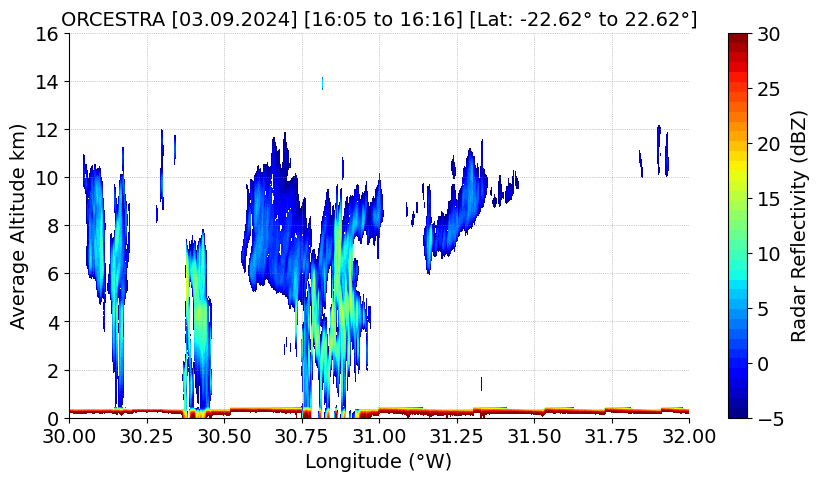

In [7]:

from matplotlib.colors import ListedColormap

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'
with h5py.File(file, 'r') as f:
    # List the groups/datasets inside the 'ScienceData' group
    science_data_group = f['ScienceData']
    #print("Keys inside 'ScienceData' group:", list(science_data_group.keys()))

    data_group = science_data_group['Data']
    #print("Keys inside 'ScienceData/Data' group:", list(data_group.keys()))
    refl_ec = data_group['radarReflectivityFactor']
    dum_ec = data_group['rangeBinValidNumber']
    refl_fact_ec = refl_ec[:]
    #refl_fact_ec[(refl_fact_ec < -10)] = np.nan
    #refl_fact_ec[(refl_fact_ec < -10) | (refl_fact_ec > 40)] = np.nan
    #print()
    geo_group = science_data_group['Geo']
    time_ec = geo_group['timeFlag']
    alt_ec = geo_group['binHeight']
    lon_ec = geo_group['longitude']
    lat_ec = geo_group['latitude']
    ht_ec = alt_ec[:]
    lon_ec = lon_ec[:]
    lat_ec = lat_ec[:]
    #print(lon_ec)
    #print(alt_ec)
    #print("Keys inside 'ScienceData/Data' group:", list(geo_group.keys()))

mean_ht_ec = 1.e-3*np.mean(ht_ec,axis=0)
#print(refl_fact_ec)

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

lat_range_mask = (lat_ec > 0) & (lat_ec < 10)

print(np.min(lat_ec))
print(np.max(lat_ec))
refl_fact_ec[refl_fact_ec == 9.9692100e+36] = np.nan
refl_fact_ec = 10.*np.log10(refl_fact_ec)                       # reflectivity is in mm6/m3, converted to dBZ
#refl_fact_ec[refl_fact_ec > 40.] = 0.;#np.zeros
refl_fact_ec[refl_fact_ec < -10.] = 0.;
#refl_fact_ec[refl_fact_ec < 1.e-2] = np.nan
refl_fact_ec[(refl_fact_ec < 1.e-3) & (refl_fact_ec > -0.5)] = np.nan
#refl_fact_ec[mean_ht_ec > 12] = np.nan

lev_refl = np.linspace(-5., 30, 40)
fontsize=14
linewidth=2

plt.figure(figsize=(10, 5))
plt.style.use('default')
contour=plt.contourf(-1.*lon_ec, mean_ht_ec, refl_fact_ec.T, vmin=-5, vmax=30, levels=lev_refl, cmap='jet')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30, 32)
plt.ylim(0,16)
#plt.xticks([-32, -31.5, -31, -30.5, -30], fontsize=14)
#plt.xticks([-32, -31.75, -31.5, -31.25, -31, -30.75, -30.5, -30.25, -30], fontsize=12, rotation=25)
plt.xticks([32, 31.75, 31.5, 31.25, 31, 30.75, 30.5, 30.25, 30], fontsize=fontsize, rotation=0)
#plt.xticks([30, 30.25, 30.5, 30.75, 31, 31.25, 31.5, 31.75, 32], fontsize=fontsize, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=fontsize)
plt.ylabel("Average Altitude km)", fontsize=fontsize)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: -22.62° to 22.62°]", fontsize=fontsize)
cbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30], label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Radar Reflectivity (dBZ)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

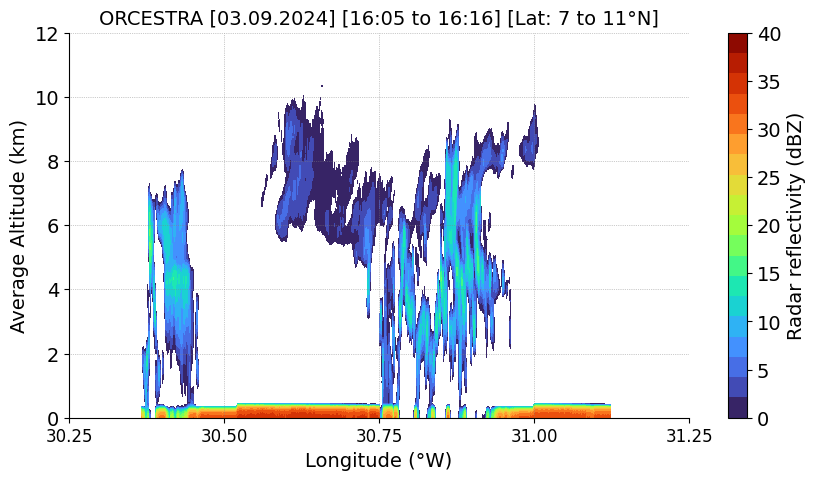

In [13]:
from matplotlib.colors import ListedColormap

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'
with h5py.File(file, 'r') as f:
    # List the groups/datasets inside the 'ScienceData' group
    science_data_group = f['ScienceData']
    #print("Keys inside 'ScienceData' group:", list(science_data_group.keys()))

    data_group = science_data_group['Data']
    #print("Keys inside 'ScienceData/Data' group:", list(data_group.keys()))
    refl_ec = data_group['radarReflectivityFactor']
    dum_ec = data_group['rangeBinValidNumber']
    refl_fact_ec = refl_ec[:]
    geo_group = science_data_group['Geo']
    time_ec = geo_group['timeFlag']
    alt_ec = geo_group['binHeight']
    lon_ec = geo_group['longitude']
    lat_ec = geo_group['latitude']
    ht_ec = alt_ec[:]
    lon_ec = lon_ec[:]
    lat_ec = lat_ec[:]



mean_ht_ec = 1.e-3*np.mean(ht_ec,axis=0)

lat_range_mask = (lat_ec > 7.) & (lat_ec < 11.) # Ref: https://ec-pdgs-dissemination1.eo.esa.int/oads/meta/EarthCAREL1Validated/browse/ 
                                                # ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.ZIP_BID.jpeg
                                                # & the simulation domain (R3B10) below


refl_fact_ec[refl_fact_ec == 9.9692100e+36] = np.nan
refl_fact_ec = 10.*np.log10(refl_fact_ec)                       # reflectivity is in mm6/m3, converted to dBZ

lat_ec_filt = lat_ec[lat_range_mask]
lon_ec_filt = lon_ec[lat_range_mask]
refl_fact_ec_filt = refl_fact_ec[lat_range_mask, :]
mean_ht_ec_filt = mean_ht_ec[:]

#refl_fact_ec_filt[refl_fact_ec_filt > 40.] = 0.
refl_fact_ec_filt[refl_fact_ec_filt < -10.] = np.nan
#refl_fact_ec_filt[refl_fact_ec_filt < 1.e-2] = np.nan
#refl_fact_ec_filt[(refl_fact_ec_filt < 1.e-3) & (refl_fact_ec_filt > -1.e-2)] = np.nan

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

lev_refl = np.linspace(0., 40, 20)

plt.figure(figsize=(10, 5))
plt.style.use('default')
contour = plt.contourf(-1.*lon_ec_filt, mean_ht_ec_filt, refl_fact_ec_filt.T, vmin=0, vmax=40, levels=lev_refl, cmap='turbo')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30.25, 31.25)
plt.ylim(0, 12)
plt.xticks([31.25, 31.0, 30.75, 30.5, 30.25], fontsize=12, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12], fontsize=14)
plt.xlabel("Longitude (°W)", fontsize=14)
plt.ylabel("Average Altitude (km)", fontsize=14)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: 7 to 11°N]", fontsize=14)

cbar = plt.colorbar(contour, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar Reflectivity (dBZ)', orientation='vertical')
#cbar = plt.colorbar(contour, label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Radar reflectivity (dBZ)', fontsize=14)
cbar.ax.tick_params(labelsize=14)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

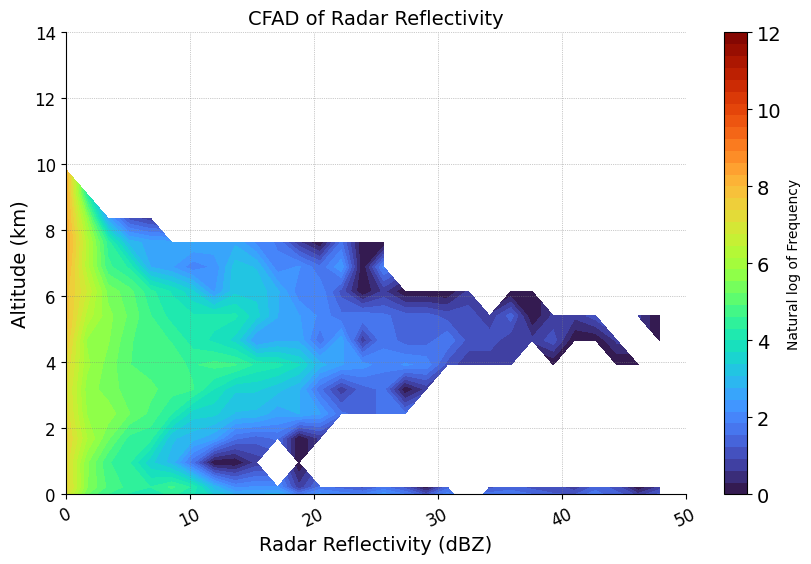

In [14]:
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'
with h5py.File(file, 'r') as f:
    # List the groups/datasets inside the 'ScienceData' group
    science_data_group = f['ScienceData']
    #print("Keys inside 'ScienceData' group:", list(science_data_group.keys()))

    data_group = science_data_group['Data']
    #print("Keys inside 'ScienceData/Data' group:", list(data_group.keys()))
    refl_ec = data_group['radarReflectivityFactor']
    dum_ec = data_group['rangeBinValidNumber']
    refl_fact_ec = refl_ec[:]
    geo_group = science_data_group['Geo']
    time_ec = geo_group['timeFlag']
    alt_ec = geo_group['binHeight']
    lon_ec = geo_group['longitude']
    lat_ec = geo_group['latitude']
    ht_ec = alt_ec[:]
    lon_ec = lon_ec[:]
    lat_ec = lat_ec[:]



mean_ht_ec = 1.e-3*np.mean(ht_ec,axis=0)

lat_mask = (lat_ec > 6.) & (lat_ec < 12.) # Ref: https://ec-pdgs-dissemination1.eo.esa.int/oads/meta/EarthCAREL1Validated/browse/ 
                                                # ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.ZIP_BID.jpeg
                                                # & the simulation domain (R3B10) below

lat_mask = (lat_ec > 7.) & (lat_ec < 11.)  
lon_mask = (lon_ec > -32) & (lon_ec < -28.) 

lat_ec_filt = lat_ec[lat_mask]
lon_ec_filt = lon_ec[lon_mask]
refl_fact_ec_filt = refl_fact_ec[lat_mask, :]
mean_ht_ec_filt = mean_ht_ec[:]

refl_fact_ec_filt[refl_fact_ec_filt > 50.] = 0.
refl_fact_ec_filt[refl_fact_ec_filt < 0.] = 0.
refl_fact_ec_filt[(refl_fact_ec_filt < 1.e-3) & (refl_fact_ec_filt > -1.e-2)] = np.nan



refl_fact_ec_filt[np.isinf(refl_fact_ec_filt)] = np.nan
mean_ht_ec_filt[np.isinf(mean_ht_ec_filt)] = np.nan

# Reflectivity values and height
refl_ec = refl_fact_ec_filt
mean_ht_ec = mean_ht_ec_filt

nbin = 30
refl_ec_bins = np.linspace(np.nanmin(refl_ec), np.nanmax(refl_ec), nbin)
height_bins = np.linspace(np.nanmin(mean_ht_ec), np.nanmax(mean_ht_ec), nbin)

cfad_refl_ec = np.zeros((len(refl_ec_bins) - 1, len(height_bins) - 1))

for i in range(len(refl_ec)):
    for j in range(len(mean_ht_ec)):
        if not np.isnan(refl_ec[i, j]):  
            refl_bin_idx = np.digitize(refl_ec[i, j], refl_ec_bins) - 1
            if refl_bin_idx == len(refl_ec_bins) - 1:  
                refl_bin_idx -= 1
            
            height_bin_idx = np.digitize(mean_ht_ec[j], height_bins) - 1
            if height_bin_idx == len(height_bins) - 1:  
                height_bin_idx -= 1
            
            cfad_refl_ec[refl_bin_idx, height_bin_idx] += 1

colors = ['grey', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod',
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)



#lev_refl = np.linspace(0., 20000, 400)
lev_refl = np.linspace(0., 12, 40)
plt.figure(figsize=(10, 6))
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], np.log(cfad_refl_ec.T), levels=lev_refl, cmap='turbo')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=14)
plt.ylabel("Altitude (km)", fontsize=14)
plt.title("CFAD of Radar Reflectivity", fontsize=14)

plt.xlim(0, 50)
plt.ylim(0, 14)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20], label='Natural log of Frequency', orientation='vertical')
#cbar = plt.colorbar(contour, ticks=[0, 2000, 4000, 6000, 8000, 10000, 12000, 14000, 16000, 18000, 20000], label='Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=14)

# Customize tick labels and rotation
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xticks(rotation=25)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# Show the plot
plt.show()

In [ ]:

file1=xr.open_dataset(f'{file_path}/orcestra_2mom/NWP_LAM_icongrid_DOM04_20240903T160000Z.nc')
file2=xr.open_dataset(f'{file_path}/orcestra_2mom/NWP_LAM_icongrid_DOM04_20240903T163000Z.nc')

ds_sip = xr.concat([file1, file2], dim="time")
grid_orc = xr.open_dataset(f'{file_path}/orcestra_2mom/domain4_DOM04.nc')

ds_sip['tempc'] = ds_sip.temp-273.16;


#################################################
clat = grid_orc["clat"].values * 180. / np.pi  
clon = grid_orc["clon"].values * 180. / np.pi  

lat_mask = (clat > 7.) & (clat < 11.)  
lon_mask = (clon > -32) & (clon < -28.)  

selected_cells = np.where(lat_mask & lon_mask)[0]  

ds_sip_filt = ds_sip.sel(ncells=selected_cells)
#################################################

ht_avg = 1.e-3*ds_sip_filt.z_mc.mean(dim=('time','ncells'))
tempc_avg = ds_sip_filt.tempc.mean(dim=('time','ncells'))

refl_sip = ds_sip_filt['dbz'];
refl_sip_filt = xr.where((ds_sip_filt.dbz > 0.) & (ds_sip_filt.dbz < 50.), ds_sip_filt.dbz, np.nan);

nbin=30

refl_sip_bins = np.linspace(refl_sip_filt.min().values, refl_sip_filt.max().values, nbin);
cfad_refl_sip = np.zeros((len(refl_sip_bins) - 1, len(ht_avg)));
refl_sip_values = refl_sip_filt.values;

for i in range(len(refl_sip_bins) - 1):
    mask = (refl_sip_values >= refl_sip_bins[i]) & (refl_sip_values < refl_sip_bins[i + 1])    
    cfad_refl_sip[i, :] = np.sum(mask, axis=(0,2)) / len(ds_sip_filt.time)
    

-22.627157426809063
22.621104536163664


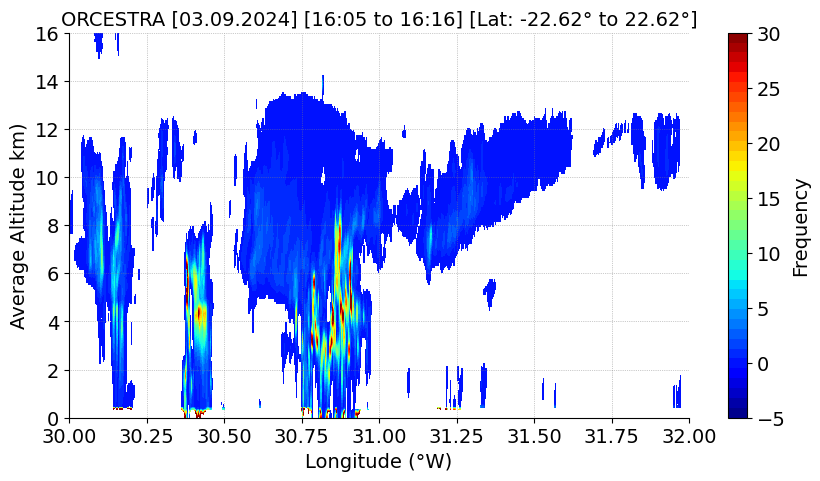

In [12]:
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/ECA_J_CPR_NOM_1BS_20240903T1605_20240903T1616_01520E_vCa.h5'
with h5py.File(file, 'r') as f:
    # List the groups/datasets inside the 'ScienceData' group
    science_data_group = f['ScienceData']
    #print("Keys inside 'ScienceData' group:", list(science_data_group.keys()))

    data_group = science_data_group['Data']
    #print("Keys inside 'ScienceData/Data' group:", list(data_group.keys()))
    refl_ec = data_group['radarReflectivityFactor']
    dum_ec = data_group['rangeBinValidNumber']
    refl_fact_ec = refl_ec[:]
    #refl_fact_ec[(refl_fact_ec < -10)] = np.nan
    #refl_fact_ec[(refl_fact_ec < -10) | (refl_fact_ec > 40)] = np.nan
    #print()
    geo_group = science_data_group['Geo']
    time_ec = geo_group['timeFlag']
    alt_ec = geo_group['binHeight']
    lon_ec = geo_group['longitude']
    lat_ec = geo_group['latitude']
    ht_ec = alt_ec[:]
    lon_ec = lon_ec[:]
    lat_ec = lat_ec[:]

mean_ht_ec = 1.e-3*np.mean(ht_ec,axis=0)
#print(refl_fact_ec)

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

lat_range_mask = (lat_ec > 0) & (lat_ec < 10)

print(np.min(lat_ec))
print(np.max(lat_ec))
#refl_fact_ec[refl_fact_ec == 9.9692100e+36] = np.nan
refl_fact_ec[refl_fact_ec > 40.] = 0.;#np.zeros
refl_fact_ec[refl_fact_ec < -10.] = 0.;
#refl_fact_ec[refl_fact_ec < 1.e-2] = np.nan
refl_fact_ec[(refl_fact_ec < 1.e-3) & (refl_fact_ec > -0.5)] = np.nan
#refl_fact_ec[mean_ht_ec > 12] = np.nan

lev_refl = np.linspace(-5., 30, 40)
fontsize=14
linewidth=2

plt.figure(figsize=(10, 5))
contour=plt.contourf(-1.*lon_ec, mean_ht_ec, refl_fact_ec.T, vmin=-5, vmax=30, levels=lev_refl, cmap='jet')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30, 32)
plt.ylim(0,16)
#plt.xticks([-32, -31.5, -31, -30.5, -30], fontsize=14)
#plt.xticks([-32, -31.75, -31.5, -31.25, -31, -30.75, -30.5, -30.25, -30], fontsize=12, rotation=25)
plt.xticks([32, 31.75, 31.5, 31.25, 31, 30.75, 30.5, 30.25, 30], fontsize=fontsize, rotation=0)
#plt.xticks([30, 30.25, 30.5, 30.75, 31, 31.25, 31.5, 31.75, 32], fontsize=fontsize, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=fontsize)
plt.ylabel("Average Altitude km)", fontsize=fontsize)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: -22.62° to 22.62°]", fontsize=fontsize)
cbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30], label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Frequency', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

In [13]:

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/ECA_J_CPR_NOM_1BS_20240903T1605_20240903T1616_01520E_vCa.h5'
with h5py.File(file, 'r') as file:
    
    # List all groups and datasets in 'HeaderData' group
    #header_data = list(file['HeaderData'].keys())
    #print("HeaderData Group:")
    #print(header_data)
    
    data_group = list(file['ScienceData/Data'].keys())
    print("ScienceData/Data Group:")
    print(data_group)
    
    # List all groups and datasets in 'ScienceData/Geo' group
    geo_group = list(file['ScienceData/Geo'].keys())
    print("\nScienceData/Geo Group:")
    print(geo_group)

ScienceData/Data Group:
['binStatusFlag', 'covarianceCoeff', 'dopplerStatusFlag', 'dopplerVelocity', 'dopplerVelocityAtSurfaceBin', 'integrationNumberDoppler', 'integrationNumberEcho', 'noiseFloorPower', 'operationalMode', 'pulseShapeWarnFlag', 'pulseWidth', 'radarCoefficient', 'radarReflectivityFactor', 'rangeBinValidNumber', 'rayHeaderCalVers', 'rayHeaderLambda', 'rayQualityFlag', 'rayStatusFlag', 'rayStatusPrf', 'receivedEchoPower', 'satelliteVelocityContaminationInLOS', 'sigmaZero', 'spectrumWidth', 'subOperationalMode', 'surfaceBinFraction', 'surfaceBinNumber', 'surfaceEstimationFlag', 'transmitPower', 'transmitPowerAvg', 'txRxStatusFlag']

ScienceData/Geo Group:
['binHeight', 'latitude', 'longitude', 'navigationLandWaterFlg', 'pitchAngle', 'processingFrameNo', 'profileTime', 'rangeBinMaxNumber', 'rangeToFirstBin', 'rangeToIntercept', 'rayHeaderRangeBinSize', 'rayHeaderSpatAvg', 'rayNumber', 'rollAngle', 'satelliteVelocityX', 'satelliteVelocityY', 'satelliteVelocityZ', 'solarAzimu

In [14]:


file='/work/bk1415/b382718/output/orcestra/observations/earthcare/ECA_E_ATL_NOM_1BS_20240903T1605_20240903T1616_01520E_vAd.h5'
with h5py.File(file, 'r') as file:
    variables = list(file.keys())
    ht_data = file['ScienceData/sample_altitude'][:]


ht_data[ht_data < 0.] = np.nan
print(1.e-3*np.nanmin(ht_data), 1.e-3*np.nanmax(ht_data))

9.489926e-07 40.331417



### Some details about the EarthCare CPR data
##### In file 'ECA_J_CPR_NOM_1BS_20240903T1605*.h5', the sample_altitude gives the height, which is a 2-D variable (9782, 218),
##### whereas, sample_longitude and sample_latitude has dimensions (9872)

-36.80194334467802 -28.06536957330144
0.0047007278 20.22951
-0.0007215439 79.99499
[-28.06536957 -28.06627682 -28.06718377 ... -36.80010698 -36.80102506
 -36.80194334]


(0.0, 20.0)

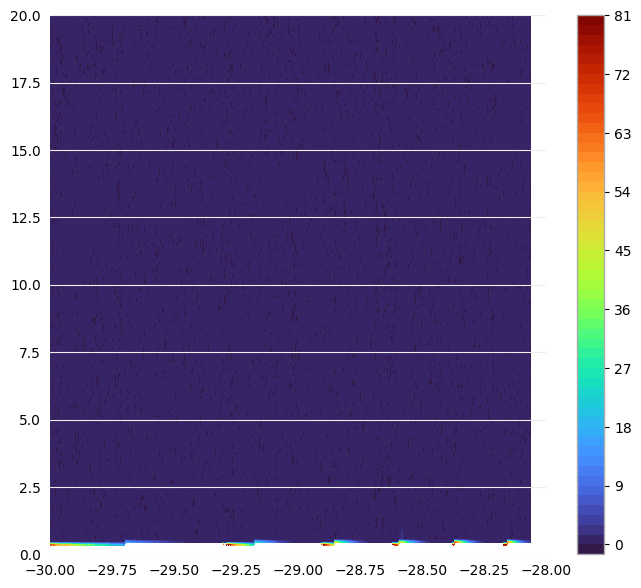

In [17]:


file='/work/bk1415/b382718/output/orcestra/observations/earthcare/ECA_J_CPR_NOM_1BS_20240903T1605_20240903T1616_01520E_vCa.h5'
with h5py.File(file,'r') as file:
    variables = list(file.keys())
    time_ec = file['ScienceData/Geo/longitude'][:]
    ht_ec_m = file['ScienceData/Geo/binHeight'][:]
    refl_fact = file['ScienceData/Data/radarReflectivityFactor'][:]


ht_ec_m[ht_ec_m < 0.] = np.nan
ht_ec_m[ht_ec_m == 9.9692100e+36] = np.nan
refl_fact[refl_fact > 80.] = np.nan
refl_fact[refl_fact == 9.9692100e+36] = np.nan

ht_km_ec = 1.e-3*np.nanmean(ht_ec_m, axis=0)
print(np.nanmin(time_ec), np.nanmax(time_ec))
print(np.nanmin(ht_km_ec), np.nanmax(ht_km_ec))
print(np.nanmin(refl_fact), np.nanmax(refl_fact))
print(time_ec)


refl_fact_flat = refl_fact.flatten()

# Plotting the histogram
#plt.figure(figsize=(10, 6))
#plt.hist(refl_fact_flat, bins=30, color='blue', alpha=0.7)
#plt.yscale('log')
#plt.title('Histogram of Reflectivity Factor')
#plt.xlabel('Reflectivity Factor Values')
#plt.ylabel('Frequency')
#plt.grid(True)
#plt.show()

plt.contourf(time_ec, ht_km_ec, refl_fact.T, levels=60, cmap='turbo')
plt.colorbar()
plt.xlim(-30, -28)
plt.ylim(0, 20)

In [24]:


del_prec_4sip = ds_4sip.tot_prec.diff('time')

precip_rate_4sip = del_prec_4sip/0.5


['Grid']
2024.0 2024.0
9.0 9.0
3.0 3.0
15.066666666666666 16.0
2.0 44.35


(0.0, 20.0)

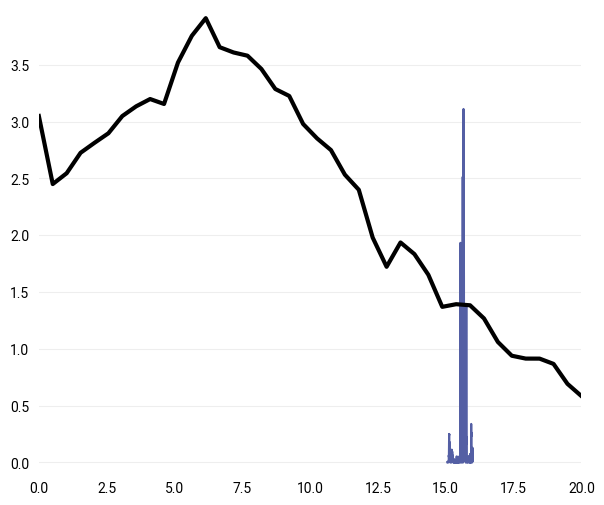

In [17]:

file='/work/bk1415/b382718/output/orcestra/observations/earthcare/GPMCOR_CMB_2409031527_1700_059721_L3S_CSG_07C.h5'
with h5py.File(file,'r') as file:
    variables = list(file.keys())
    day_ec = file['Grid/GridTime/DayOfMonth'][:]
    #year_ec = file['Grid/GridTime/DayOfYear'][:]
    hr_ec = file['Grid/GridTime/Hour'][:]
    min_ec = file['Grid/GridTime/Minute'][:]
    sec_ec = file['Grid/GridTime/Second'][:]
    month_ec = file['Grid/GridTime/Month'][:]
    year_ec = file['Grid/GridTime/Year'][:]
    lh_ec = file['Grid/surfacePrecipRate'][:]
    #ht_ec_m = file['Grid/binHeight'][:]
    #refl_fact = file['Grid/radarReflectivityFactor'][:]

print(variables)
day_ec = day_ec.astype(float)
year_ec = year_ec.astype(float)
month_ec = month_ec.astype(float)
hr_ec = hr_ec.astype(float)
min_ec = min_ec.astype(float)
sec_ec = sec_ec.astype(float)

lh_ec[lh_ec == -9999.9] = np.nan

year_ec[year_ec < 0.] = np.nan
month_ec[month_ec < 0] = np.nan
day_ec[day_ec < 0.] = np.nan
hr_ec[hr_ec < 0] = np.nan
min_ec[min_ec < 0] = np.nan
sec_ec[sec_ec < 0] = np.nan

mean_year_ec = np.nanmean(year_ec, axis=0)
mean_month_ec = np.nanmean(month_ec, axis=0)
mean_day_ec = np.nanmean(day_ec, axis=0)
mean_hr_ec = np.nanmean(hr_ec, axis=0)
mean_min_ec = np.nanmean(min_ec, axis=0)

mean_lh_ec = np.nanmean(lh_ec, axis=0)
#print(np.nanmin(mean_lh_ec), np.nanmax(mean_lh_ec))
#print(year_ec[~np.isnan(year_ec)])
#print(month_ec[~np.isnan(month_ec)])
#print(day_ec[~np.isnan(day_ec)])
#print(hr_ec[~np.isnan(hr_ec)])
#print(min_ec[~np.isnan(min_ec)])

print(np.nanmin(mean_year_ec), np.nanmax(mean_year_ec))
print(np.nanmin(mean_month_ec), np.nanmax(mean_month_ec))
print(np.nanmin(mean_day_ec), np.nanmax(mean_day_ec))
print(np.nanmin(mean_hr_ec), np.nanmax(mean_hr_ec))
print(np.nanmin(mean_min_ec), np.nanmax(mean_min_ec))

hr_obs = np.linspace(15.06,16,536)
hr_icon = np.linspace(0,20,40)
#print(mean_hr_ec.shape)
#print(mean_hr_ec[1:536])

lnwdth=3

plt.plot(hr_obs,mean_lh_ec)
plt.plot(hr_icon, precip_rate_4sip.mean('ncells'), 'k-', linewidth=lnwdth, label='4-SIP')
plt.xlim(0,20)

In [16]:


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'
with h5py.File(file, 'r') as file:
    variables = list(file.keys())

print(variables)
    #img_data = list(file['Geophysical_Data'].keys())
    #print("Image_data Group:")
    #print(img_data)

    #cler_w_data = file['Image_data/CLTYPE'][:]
    #print("CLER_W Data:")
    #print(cler_w_data)
    
    #img_data_group = f['Image_data']
    #print("Keys inside 'ScienceData' group:", list(science_data_group.keys()))

    #print(cler_w)    
    # List all groups and datasets in 'ScienceData' group
    #science_data = list(file['ScienceData'].keys())
    #print("ScienceData Group:")
    #print(science_data)

#plt.plot(cler_w_data)
#plt.ylim(0,300)

['Geophysical Data', 'Latitude of Observation Point', 'Longitude of Observation Point', 'Pixel Data Quality', 'Position in Orbit', 'Scan Time']


Shape of 'Geophysical Data': (1980, 243, 1)
Data type of 'Geophysical Data': int16
Shape of 'lat Data': (1980, 243)
Shape of 'lon Data': (1980, 243)
Shape of 'pix Data': (1, 1980, 243)
Shape of 'pos Data': (1980,)
Shape of 'tim Data': (1980,)
<HDF5 dataset "Scan Time": shape (1980,), type "<f8">
(1980, 243)
50.11934


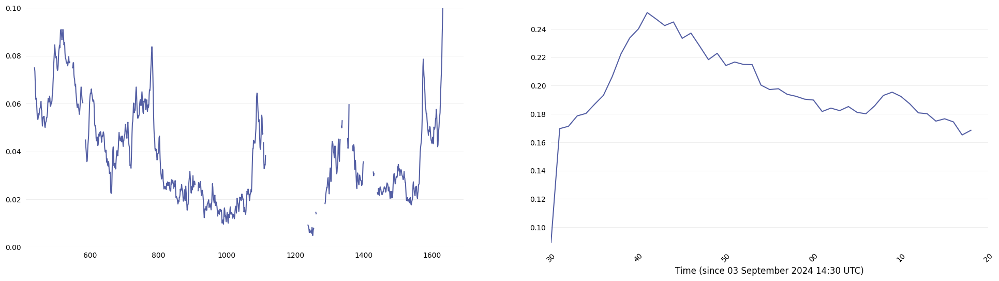

In [32]:
import h5py

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    # Access the 'Geophysical Data' dataset
    geophysical_data = f['Geophysical Data']
    lat = f['Latitude of Observation Point']
    lon = f['Longitude of Observation Point']
    pix = f['Pixel Data Quality']
    pos = f['Position in Orbit']
    tim = f['Scan Time']
    # Print the shape and data type of the dataset
    print(f"Shape of 'Geophysical Data': {geophysical_data.shape}")
    print(f"Data type of 'Geophysical Data': {geophysical_data.dtype}")
    print(f"Shape of 'lat Data': {lat.shape}")
    print(f"Shape of 'lon Data': {lon.shape}")
    print(f"Shape of 'pix Data': {pix.shape}")
    print(f"Shape of 'pos Data': {pos.shape}")
    print(f"Shape of 'tim Data': {tim.shape}")
    print(tim)
    # To view the data itself, you can load it into memory
    data = geophysical_data[:]
    #print(data)

geoph_data = data[:,:,0]

geoph_data = geoph_data.astype(np.float32)
time = tim.astype(np.float32)

geoph_data[geoph_data == -32767] = np.nan
print(geoph_data.shape)
print(np.nanmean(geoph_data))



fontsize=18
linwdth = 3
plt.figure(figsize=(24, 6))
plt.subplot(1,2,1)
plt.plot(1.e-3*np.mean(geoph_data, axis=1))
plt.ylim(0,0.1)

plt.subplot(1,2,2)
avg_lwc = ds_4sip.lwc_gperm3.where(ds_4sip.lwc_gperm3 > 0.).mean(dim=('height','ncells'))


start_date = datetime(2024, 9, 3, 14, 30)
time_steps = [start_date + timedelta(minutes=i) for i in range(len(avg_lwc))]  

plt.plot(time_steps, avg_lwc)  

# Labeling the x-axis and setting the format
plt.xlabel('Time (since 03 September 2024 14:30 UTC)', fontsize=12)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))  # minutes

plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=10))  # Shows every 10 minutes 

plt.xticks(rotation=45)

end_date = datetime(2024, 9, 3, 15, 20)
plt.xlim([start_date, end_date])

plt.show()


-29.458439 -14.984329
7.920896 14.689728
(9,)


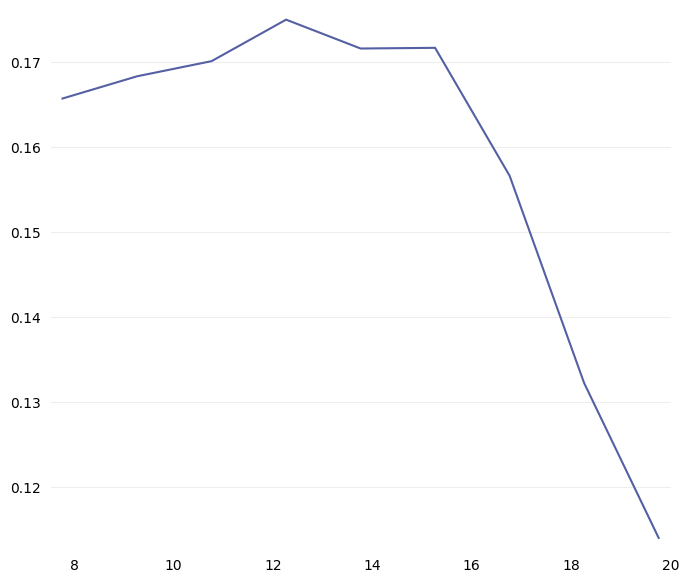

In [21]:

import xarray as xr
import netCDF4

#ds_clw_obs = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/earthcare/ORD2025040849756_4387452.nc');

ds_clw_obs = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/earthcare/ORD2025040949789_4410523.nc', 'r')

time_obs = ds_clw_obs.variables['Scan Time'][:]
lon_obs  = ds_clw_obs.variables['Longitude of Observation Point'][:]
lat_obs  = ds_clw_obs.variables['Latitude of Observation Point'][:]
lwp_raw_obs  = ds_clw_obs.variables['Geophysical Data'][:,:,0]
lwp_obs  = ds_clw_obs.variables['Geophysical Data'][:,:,0]

avg_lon_obs = np.nanmean(lon_obs, axis=0)
avg_lat_obs = np.nanmean(lat_obs, axis=0)

#print(lwp_raw_obs)
#print(avg_lon_obs)
#print()
#print(avg_lat_obs)

lwp_raw_obs[lwp_raw_obs < 0.] = np.nan
lwp_obs[lwp_obs < 0.] = np.nan
avg_lwp_obs = np.nanmean(lwp_obs, axis = 1)

print(np.min(avg_lon_obs), np.max(avg_lon_obs))
print(np.min(avg_lat_obs), np.max(avg_lat_obs))

#ds_clw_obs = ds_clw_obs.sel()
#print(lon_obs.shape, lat_obs.shape)
print(time_obs.shape)
#print(np.max(avg_lwp_obs), np.min(avg_lwp_obs))
plt.plot(time_obs-9.9952900e8, avg_lwp_obs)

(122.0, 0.0)

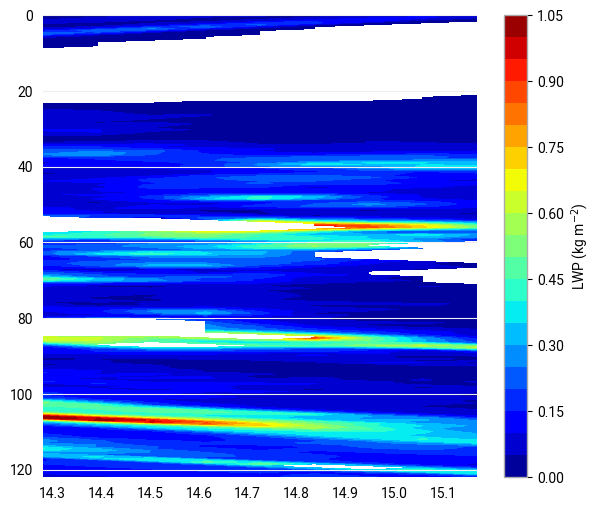

In [21]:

ht_ec = np.linspace(0, 122, 243)
time_ec = np.linspace(14.28,15.17,9)
plt.contourf(time_ec, ht_ec, lwp_raw_obs.T, levels=20, cmap='jet') 
plt.colorbar(label='LWP (kg m$^{-2}$)')
plt.ylim(122,0)

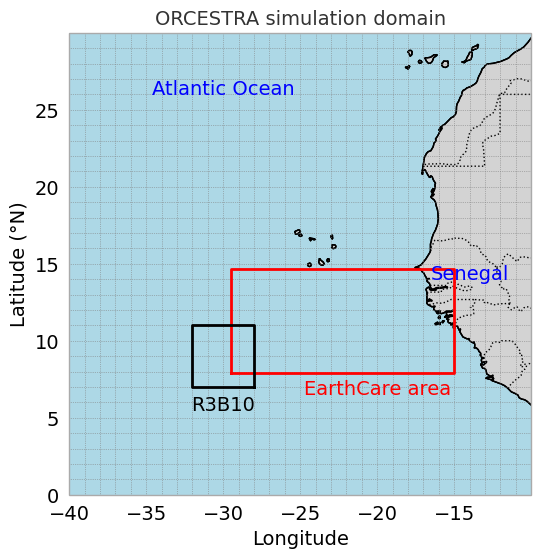

In [22]:
## ORCESTRA 3 Sept 2024 domain

fontsize=14

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_obs = [np.min(avg_lon_obs), np.max(avg_lon_obs)];
lat_obs = [np.min(avg_lat_obs), np.max(avg_lat_obs)];

fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon_obs[0], lon_obs[1], lon_obs[1], lon_obs[0], lon_obs[0]], 
        [lat_obs[0], lat_obs[0], lat_obs[1], lat_obs[1], lat_obs[0]], 
        color='red', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())


ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.text(-30., 5.5, "R3B10", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='k')#, fontweight='bold')
ax.text(-20., 6.5, "EarthCare area", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='r')#, fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [Domain 3]", transform=ccrs.PlateCarree(), fontsize=13, ha='center', color='k', fontweight='bold')
#ax.text(-30., 11.2, "R3B10 [Domain 4]", transform=ccrs.PlateCarree(), fontsize=13, ha='center', color='k', fontweight='bold')

ax.set_xlim(-40., -10.)
ax.set_ylim(0., 30.)
ax.set_xticks(range(-40, -10, 5))  
ax.set_yticks(range(0, 30, 5))
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
ax.set_xlabel("Longitude", fontsize=fontsize)
ax.set_ylabel("Latitude (°N)", fontsize=fontsize)
ax.grid(True, which='both', linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain', fontsize=fontsize)
ax.minorticks_on()
# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')
#ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')

plt.show()

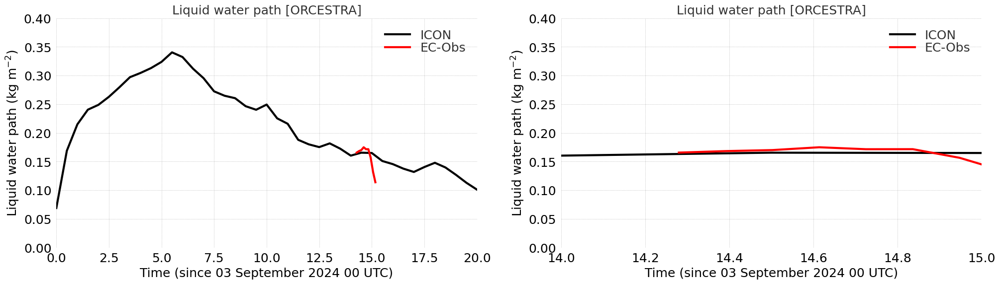

In [23]:

ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['lwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_lwp_kgperm2 = ds_4sip.lwp_kgperm2.mean('ncells')

time_hr_icon = np.linspace(0,20,41)
time_hr_obs = np.linspace(14.28,15.17,9)

plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18
plt.subplot(1,2,1)
plt.plot(time_hr_icon, avg_lwp_kgperm2, 'k-', linewidth=lnwdth, label='ICON')
plt.plot(time_hr_obs, avg_lwp_obs, 'r-', linewidth=lnwdth, label='EC-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

plt.xlim(0,20)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
#start_date = datetime(2024, 9, 3, 0, 0) 
#end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Liquid water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Liquid water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt.plot(time_hr_icon, avg_lwp_kgperm2, 'k-', linewidth=lnwdth, label='ICON')
plt.plot(time_hr_obs, avg_lwp_obs, 'r-', linewidth=lnwdth, label='EC-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

plt.xlim(14,15)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
#start_date = datetime(2024, 9, 3, 0, 0) 
#end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Liquid water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Liquid water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

In [24]:

del_prec_4sip = ds_4sip.tot_prec.diff('time')

precip_rate_4sip = del_prec_4sip/0.5


[[-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]
 [-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]
 [-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]
 ...
 [-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]
 [-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]
 [-9999.9 -9999.9 -9999.9 ... -9999.9 -9999.9 -9999.9]]


NameError: name 'time_hr_icon' is not defined

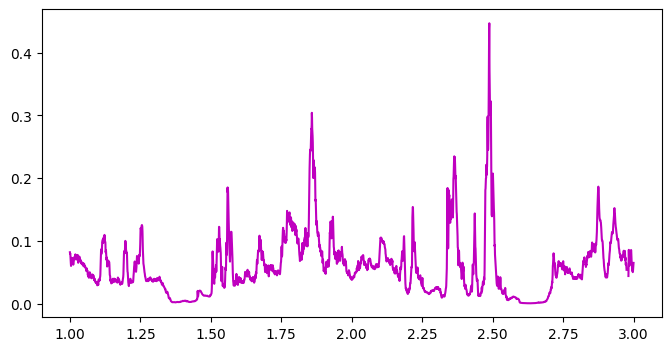

In [15]:


file='/work/bk1415/b382718/output/orcestra/observations/earthcare/GPMCOR_GMI_2409030127_0301_059712_L2S_GL2_07C.h5'
with h5py.File(file,'r') as file:
    variables = list(file.keys())
    lon_ec = file['S1/Longitude'][:]
    lat_ec = file['S1/Latitude'][:]
    precip_ec = file['S1/surfacePrecipitation'][:]
    clwp_ec = file['S1/cloudWaterPath'][:]
    iwp_ec = file['S1/iceWaterPath'][:]
    rwp_ec = file['S1/rainWaterPath'][:]
    day_ec = file['S1/ScanTime/DayOfMonth'][:]
    hr_ec = file['S1/ScanTime/Hour'][:]
    min_ec = file['S1/ScanTime/Minute'][:]
    sec_ec = file['S1/ScanTime/Second'][:]
    month_ec = file['S1/ScanTime/Month'][:]
    year_ec = file['S1/ScanTime/Year'][:]
    #lh_ec = file['Grid/surfacePrecipRate'][:]
    #ht_ec_m = file['Grid/binHeight'][:]
    #refl_fact = file['Grid/radarReflectivityFactor'][:]

lon_min, lon_max = -35, -23
lat_min, lat_max = 5, 15
region_mask = (lon_ec >= lon_min) & (lon_ec <= lon_max) & (lat_ec >= lat_min) & (lat_ec <= lat_max)

true_indices = np.where(region_mask)[0]

# Extract data for the specified region
lon_orc = lon_ec[region_mask]
lat_orc = lat_ec[region_mask]
precip_orc = precip_ec[true_indices, :]
clwp_orc = clwp_ec[true_indices, :]
iwp_orc = iwp_ec[true_indices, :]
rwp_orc = rwp_ec[true_indices, :]


#print(iwp_ec.shape, iwp_orc.shape)
print(clwp_ec)

clwp_ec[clwp_ec < 0] = np.nan
iwp_orc[iwp_orc == -9999.9] = np.nan
rwp_orc[rwp_orc == -9999.9] = np.nan

precip_orc[precip_orc == -9999.9] = np.nan

mean_clwp_kgperm2_ec = np.nanmean(clwp_ec, axis=1)
mean_iwp_kgperm2_ec = np.nanmean(iwp_orc, axis=1)
mean_rwp_kgperm2_ec = np.nanmean(rwp_orc, axis=1)

#print(mean_precip_mmh_ec.shape)

#print(np.min(lon_orc), np.max(lon_orc))
#print(np.min(lat_orc), np.max(lat_orc))

#print(np.min(hr_ec), np.max(hr_ec))
#print(np.min(min_ec), np.max(min_ec))
#print(np.min(day_ec), np.max(day_ec))
#print(np.min(month_ec), np.max(month_ec))
#print(np.min(year_ec), np.max(year_ec))

#print(np.nanmin(mean_precip_mmh_ec), np.nanmax(mean_precip_mmh_ec))



time_hr_obs = np.linspace(1,3,2983)

#plt.plot(time_ec_obs, mean_precip_mmh_ec)

plt.figure(figsize=(8, 4))

lnwdth=3
fontsize=14
#plt.plot(time_hr_icon[:-1], precip_rate_4sip.mean('ncells'), 'k-', linewidth=lnwdth, label='ICON')
#plt.plot(time_hr_obs, mean_precip_mmh_ec, 'r-', linewidth=lnwdth, label='EC-Obs')
plt.plot(time_hr_obs, mean_clwp_kgperm2_ec, 'm-')
plt.plot(time_hr_icon, avg_lwp_kgperm2, 'k-', linewidth=lnwdth, label='ICON')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

plt.xlim(0,20)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
#start_date = datetime(2024, 9, 3, 0, 0) 
#end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(0, 6)
plt.yticks(fontsize=fontsize)
plt.ylabel('Precipitation rate (mm h$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Precipitation rate [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

# GPM Precipitation

In [33]:

file1 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T000000Z.nc'
file2 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T003000Z.nc'
file3 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T010000Z.nc'

ds1 = xr.open_dataset(file1)
ds2 = xr.open_dataset(file2)
ds3 = xr.open_dataset(file3)

ds_sip = xr.concat([ds1, ds2, ds3], dim='time')


In [34]:
#file='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/light_param/SIP/orcestra_2mom_sip/old_output/NWP_LAM_icongrid_DOM04_20240903T160000Z.nc'

file1 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T000000Z.nc'
file2 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T003000Z.nc'
file3 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T010000Z.nc'

ds1 = xr.open_dataset(file1)
ds2 = xr.open_dataset(file2)
ds3 = xr.open_dataset(file3)

ds_sip = xr.concat([ds1, ds2, ds3], dim='time')

ds_sip.tot_prec

<xarray.DataArray 'tot_prec' (time: 3, ncells: 73960)> Size: 888kB
array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [9.4508825e-05, 9.8751880e-05, 1.0194574e-04, ..., 3.7736814e-02,
        3.7386376e-02, 3.7255991e-02],
       [9.4508825e-05, 9.8751880e-05, 1.0194574e-04, ..., 3.8495194e-02,
        3.8310491e-02, 3.8201336e-02]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 24B 2024-09-03 ... 2024-09-03T01:00:00
    clon     (ncells) float64 592kB -0.5587 -0.5587 -0.5589 ... -0.5231 -0.5231
    clat     (ncells) float64 592kB 0.1827 0.1829 0.183 ... 0.1563 0.1565 0.1567
Dimensions without coordinates: ncells
Attributes:
    standard_name:                tot_prec
    long_name:                    total precip
    units:                        kg m-2
    param:                        52.1.0
    CDI_grid_type:                unstructured
    number_of_grid_in_reference:  1

0.0 71.104324


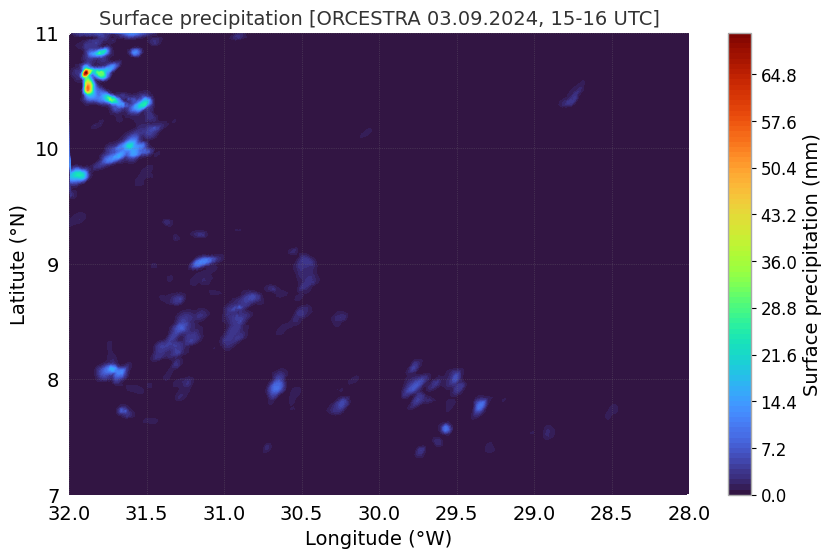

In [35]:


#file='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/light_param/SIP/orcestra_2mom_sip/old_output/NWP_LAM_icongrid_DOM04_20240903T160000Z.nc'

file1 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T150000Z.nc'
file2 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T153000Z.nc'
file3 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T160000Z.nc'

ds1 = xr.open_dataset(file1)
ds2 = xr.open_dataset(file2)
ds3 = xr.open_dataset(file3)

ds_orc = xr.concat([ds1, ds2, ds3], dim='time')

ds_orc['precip_rate'] = 0.5*ds_orc.tot_prec.diff('time') # output is half hourly

ds_orc.tot_prec

#ds_sip = xr.open_mfdataset(file)
mask=np.isin(ds_orc['ncells'], selected_indices.cell)
ds_orc = ds_orc.sel(ncells=mask)

grid_new = grid_orc.sel(cell=mask)

filt_precip = xr.where((ds_orc.precip_rate > 1.e-3), ds_orc.precip_rate, np.nan)

# Calculate the mean: time and height dimensions
avg_precip_4sip = ds_orc.precip_rate.mean(dim=('time')) #filt_precip.mean(dim=('time'))

# Extract longitude and latitude
clon_deg = -1.*np.degrees(grid_new.clon)
clat_deg = np.degrees(grid_new.clat)

print(avg_precip_4sip.min().values, avg_precip_4sip.max().values)
# Set NaN values to a value outside the range of the colormap
avg_precip_4sip = np.where(np.isnan(avg_precip_4sip), 0, avg_precip_4sip)


# Define the colors
colors = ['cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'goldenrod', 
          'darkorange', 'red', 'firebrick', 'maroon', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

# Plot the contour
plt.figure(figsize=(10, 6))

plt.tricontourf(clon_deg, clat_deg, avg_precip_4sip, cmap='turbo', levels=100)
colorbar = plt.colorbar()#contour, ticks=[5, 10, 20, 30, 40, 50, 60, 70], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=14)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=14)
plt.yticks([7, 8, 9, 10, 11], fontsize=14)
plt.xlabel('Longitude (°W)',fontsize=14)
plt.ylabel('Latitute (°N)',fontsize=14)
plt.title('Surface precipitation [ORCESTRA 03.09.2024, 15-16 UTC]',fontsize=14)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

#plt.figure(figsize=(10, 6))
#
#contour = plt.tricontourf(clon_deg, clat_deg, avg_precip_4sip, cmap=cmap, levels=40)#np.linspace(5, 70, 100))
#colorbar = plt.colorbar()#contour, ticks=[5, 10, 20, 30, 40, 50, 60, 70], label='Surface precipitation (mm)')
#colorbar.ax.tick_params(labelsize=12)
#colorbar.set_label(label='Surface precipitation (mm)', size=14)
#plt.xlim([28, 32]); 
#plt.ylim([7, 11]); 
#plt.xticks([28, 28.5, 29, 29.5, 30, 30.5, 31, 31.5, 32], fontsize=14)
#plt.yticks([7, 8, 9, 10, 11], fontsize=14)
#plt.xlabel('Longitude (°W)',fontsize=14)
#plt.ylabel('Latitute (°N)',fontsize=14)
#plt.title('Surface precipitation [ORCESTRA 03.09.2024, 15-16 UTC]',fontsize=14)  

#plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
#plt.show()

-2.5 0.95


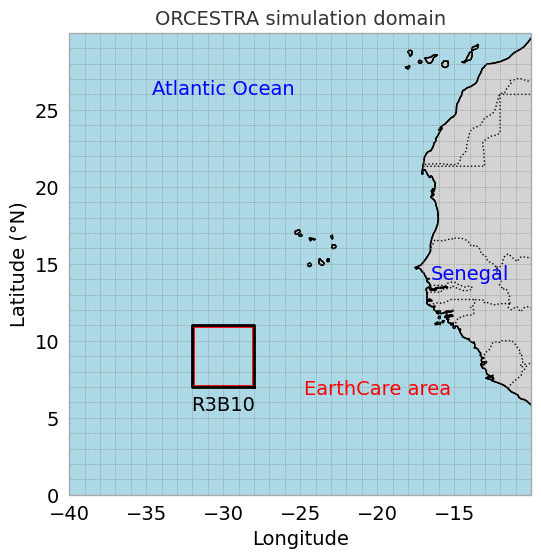

0.0 12.904735


In [36]:

file='/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/precip_amount/GPMMRG_MAP_2409031400_H_L3S_MCH_04J.h5'
with h5py.File(file,'r') as file:
    variables = list(file.keys())
    lon1 = file['Grid/Longitude'][:]
    lat1 = file['Grid/Latitude'][:]
    precrate1 = file['Grid/hourlyPrecipRate'][:]
    precrateGC1 = file['Grid/hourlyPrecipRateGC'][:]
    timeflag1 = file['Grid/observationTimeFlag'][:]
    satinfoflag1 = file['Grid/satelliteInfoFlag'][:]
    snowprob1 = file['Grid/snowProbability'][:]

#print("Longitude range:", lon1.min(), lon1.max())
#print("Latitude range:", lat1.min(), lat1.max())

## GPM data is global preciptiation data over 0.1° x 0.1°
# Hence, select the GPM region corresponding to the simulation  domain

lon_min, lon_max = -32, -28
lat_min, lat_max = 7, 11
region_mask = (lon1 >= lon_min) & (lon1 <= lon_max) & (lat1 >= lat_min) & (lat1 <= lat_max)

rows, cols = np.where(region_mask)

row_min, row_max = rows.min(), rows.max()
col_min, col_max = cols.min(), cols.max()

#print(row_min, row_max, col_min, col_max)

lon_gpm = lon1[row_min:row_max+1, col_min:col_max+1]
lat_gpm = lat1[row_min:row_max+1, col_min:col_max+1]
precrate_gpm = precrate1[row_min:row_max+1, col_min:col_max+1]
timeflag_gpm = timeflag1[row_min:row_max+1, col_min:col_max+1]
satflag_gpm = satinfoflag1[row_min:row_max+1, col_min:col_max+1]
snowprob_gpm = snowprob1[row_min:row_max+1, col_min:col_max+1]

print(np.nanmin(timeflag_gpm), np.nanmax(timeflag_gpm))
#true_ind = np.where(region_mask)[0]
#lon_gpm = lon1[region_mask]
#lat_gpm = lat1[true_ind]
#precrate_gpm = precrate1[true_ind]
#timeflag_gpm = timeflag1[true_ind]
#satflag_gpm = satinfoflag1[true_ind]
#snowprob_gpm = snowprob1[true_ind]




mean_lon1 = np.nanmean(lon1, axis=1)
mean_lat1 = np.nanmean(lat1, axis=0)

#print(mean_lon1.shape, lon1.shape)
#print(mean_lat1.shape, lat1.shape)
#print(np.nanmin(mean_lon1), np.nanmax(mean_lon1))
#print(np.nanmin(mean_lat1), np.nanmax(mean_lat1))

#print(lon_gpm)
#print(true_ind)

#print(precrate_gpm.shape)


## ORCESTRA 3 Sept 2024 domain

fontsize=14

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_obs = [np.nanmin(lon_gpm), np.nanmax(lon_gpm)];
lat_obs = [np.nanmin(lat_gpm), np.nanmax(lat_gpm)];

fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon_obs[0], lon_obs[1], lon_obs[1], lon_obs[0], lon_obs[0]], 
        [lat_obs[0], lat_obs[0], lat_obs[1], lat_obs[1], lat_obs[0]], 
        color='red', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())


ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.text(-30., 5.5, "R3B10", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='k')#, fontweight='bold')
ax.text(-20., 6.5, "EarthCare area", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='r')#, fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [Domain 3]", transform=ccrs.PlateCarree(), fontsize=13, ha='center', color='k', fontweight='bold')
#ax.text(-30., 11.2, "R3B10 [Domain 4]", transform=ccrs.PlateCarree(), fontsize=13, ha='center', color='k', fontweight='bold')

ax.set_xlim(-40., -10.)
ax.set_ylim(0., 30.)
ax.set_xticks(range(-40, -10, 5))  
ax.set_yticks(range(0, 30, 5))
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
ax.set_xlabel("Longitude", fontsize=fontsize)
ax.set_ylabel("Latitude (°N)", fontsize=fontsize)
ax.grid(True, which='both', linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain', fontsize=fontsize)
ax.minorticks_on()
# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')
#ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fontsize, ha='center', color='blue')

plt.show()

print(np.nanmin(precrate_gpm), np.nanmax(precrate_gpm))

In [37]:


file1 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T120000Z.nc'
file2 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T123000Z.nc'
file3 = '/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/NWP_LAM_icongrid_DOM04_20240903T130000Z.nc'

ds1 = xr.open_dataset(file1)
ds2 = xr.open_dataset(file2)
ds3 = xr.open_dataset(file3)

#ds_orc = xr.concat([ds1, ds2, ds3], dim='time')

ds_orc = ds_4sip
ds_orc['precip_rate'] = 0.5*ds_orc.tot_prec.diff('time') # output is half hourly

ds_orc.tot_prec

mask=np.isin(ds_orc['ncells'], selected_indices.cell)
ds_orc = ds_orc.sel(ncells=mask)

grid_new = grid_orc.sel(cell=mask)

filt_precip = xr.where((ds_orc.precip_rate > 1.e-3), ds_orc.precip_rate, np.nan)

avg_precip_4sip = ds_orc.precip_rate.mean(dim=('time')) #filt_precip.mean(dim=('time'))

clon_deg = -1.*np.degrees(grid_new.clon)
clat_deg = np.degrees(grid_new.clat)

print(avg_precip_4sip.min().values, avg_precip_4sip.max().values)
# Set NaN values to a value outside the range of the colormap
avg_precip_4sip = np.where(np.isnan(avg_precip_4sip), 0, avg_precip_4sip)


0.0009193633 6.292845


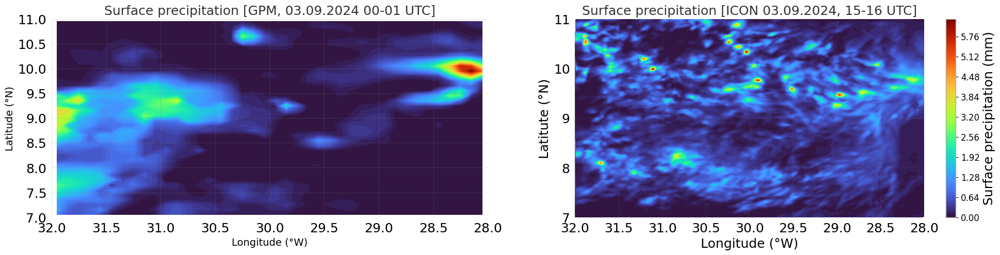

In [38]:

preciprate_gpm = precrate_gpm

#preciprate_gpm[(preciprate_gpm > 0) & (preciprate_gpm < 1.e-1)] = np.nan

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

lev_refl = np.linspace(0., 40, 20)

fontsize=18
plt.figure(figsize=(24, 5))

plt.subplot(1,2,1)
contour = plt.contourf(-1.*lon_gpm, lat_gpm, preciprate_gpm, levels=100, cmap='turbo')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(32, 28)
plt.ylim(7, 11)
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize, rotation=0)

plt.yticks([7, 7.5, 8, 8.5, 9, 9.5, 10, 10.5, 11], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=14)
plt.ylabel("Latitude (°N)", fontsize=14)
plt.title("Surface precipitation [GPM, 03.09.2024 00-01 UTC]", fontsize=fontsize)

#cbar = plt.colorbar(contour, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Surface preciptiation (mm)', orientation='vertical')
#cbar = plt.colorbar(contour, label='Surface preciptiation (mm)', orientation='vertical')
#cbar.set_label('Surface preciptiation (mm)', fontsize=14)
#cbar.ax.tick_params(labelsize=14)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)

plt.tricontourf(clon_deg, clat_deg, avg_precip_4sip, cmap='turbo', levels=100)
colorbar = plt.colorbar()#contour, ticks=[5, 10, 20, 30, 40, 50, 60, 70], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024, 15-16 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

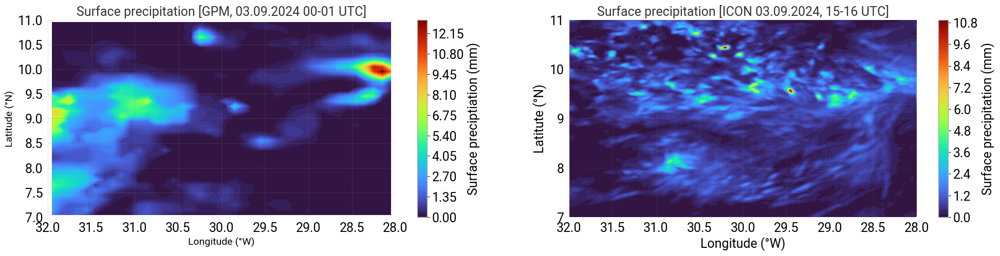

In [32]:

preciprate_gpm = precrate_gpm

#preciprate_gpm[(preciprate_gpm > 0) & (preciprate_gpm < 1.e-1)] = np.nan

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

lev_refl = np.linspace(0., 40, 20)

fontsize=18
plt.figure(figsize=(24, 5))

plt.subplot(1,2,1)
contour = plt.contourf(-1.*lon_gpm, lat_gpm, preciprate_gpm, levels=100, cmap='turbo')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(32, 28)
plt.ylim(7, 11)
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize, rotation=0)

plt.yticks([7, 7.5, 8, 8.5, 9, 9.5, 10, 10.5, 11], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=14)
plt.ylabel("Latitude (°N)", fontsize=14)
plt.title("Surface precipitation [GPM, 03.09.2024 00-01 UTC]", fontsize=fontsize)

cbar = plt.colorbar()#contour, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Surface preciptiation (mm)', orientation='vertical')
#cbar = plt.colorbar(contour, label='Surface preciptiation (mm)', orientation='vertical')
cbar.set_label('Surface preciptiation (mm)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)

plt.tricontourf(clon_deg, clat_deg, avg_precip_4sip, cmap='turbo', levels=100)
colorbar = plt.colorbar()#contour, ticks=[5, 10, 20, 30, 40, 50, 60, 70], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024, 15-16 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()
plt.show()

In [33]:
ds_4sip.time

<xarray.DataArray 'time' (time: 41)>
array(['2024-09-03T00:00:00.000000000', '2024-09-03T00:30:00.000000000',
       '2024-09-03T01:00:00.000000000', '2024-09-03T01:30:00.000000000',
       '2024-09-03T02:00:00.000000000', '2024-09-03T02:30:00.000000000',
       '2024-09-03T03:00:00.000000000', '2024-09-03T03:30:00.000000000',
       '2024-09-03T04:00:00.000000000', '2024-09-03T04:30:00.000000000',
       '2024-09-03T05:00:00.000000000', '2024-09-03T05:30:00.000000000',
       '2024-09-03T06:00:00.000000000', '2024-09-03T06:30:00.000000000',
       '2024-09-03T07:00:00.000000000', '2024-09-03T07:30:00.000000000',
       '2024-09-03T08:00:00.000000000', '2024-09-03T08:30:00.000000000',
       '2024-09-03T09:00:00.000000000', '2024-09-03T09:30:00.000000000',
       '2024-09-03T10:00:00.000000000', '2024-09-03T10:30:00.000000000',
       '2024-09-03T11:00:00.000000000', '2024-09-03T11:30:00.000000000',
       '2024-09-03T12:00:00.000000000', '2024-09-03T12:30:00.000000000',
       '2024-09-03T13:00:00.000000000', '2024-09-03T13:30:00.000000000',
       '2024-09-03T14:00:00.000000000', '2024-09-03T14:30:00.000000000',
       '2024-09-03T15:00:00.000000000', '2024-09-03T15:30:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T16:30:00.000000000',
       '2024-09-03T17:00:00.000000000', '2024-09-03T17:30:00.000000000',
       '2024-09-03T18:00:00.000000000', '2024-09-03T18:30:00.000000000',
       '2024-09-03T19:00:00.000000000', '2024-09-03T19:30:00.000000000',
       '2024-09-03T20:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2024-09-03 ... 2024-09-03T20:00:00

In [16]:

import h5py
import xarray as xr
import numpy as np
import pandas as pd
import glob
import os


# We'll combine hdf files of precipitation rate from GPM and store it in xarray for smooth operation
# We create 'time' as separate array as it is not given in this format in hdf files

times = pd.date_range(start="2024-09-03T00:00:00", end="2024-09-03T23:00:00", freq="1H")

files = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/precip_amount/GPMMRG_MAP_240903*.h5'

file_list = sorted(glob.glob(files))

print(f"Found {len(file_list)} files.")


precip_list = []
time_list = []

for f in file_list:
    with h5py.File(f, 'r') as file:
        lon1 = file['Grid/Longitude'][:]
        lat1 = file['Grid/Latitude'][:]
        precrate1 = file['Grid/hourlyPrecipRate'][:]
        precrateGC1 = file['Grid/hourlyPrecipRateGC'][:]
        timeflag1 = file['Grid/observationTimeFlag'][:]
        satinfoflag1 = file['Grid/satelliteInfoFlag'][:]
        snowprob1 = file['Grid/snowProbability'][:]

    timestamp_str = os.path.basename(f).split('_')[2]
    time = pd.to_datetime(timestamp_str, format='%y%m%d%H%M')

    da = xr.DataArray(precrate1, dims=('lat', 'lon'),
                      coords={'lat': lat1[:, 0], 'lon': lon1[0, :]})  # assumes rectilinear grid
    da = da.expand_dims(time=[time])  # Add time dimension
    
    precip_list.append(da)
    time_list.append(time)
#ds_gpm_obs = 

Found 25 files.


In [17]:


# Here, for ease, we combine all hourly hdf files (precipitation data) to single xarray datafile

## create an array of time with frequency of 1 hour
times = pd.date_range(start="2024-09-03T00:00:00", end="2024-09-03T23:00:00", freq="1H")

### Get list of hdf files ###
files = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/precip_amount/GPMMRG_MAP_240903*.h5'
file_list = sorted(glob.glob(files))

print(f"Found {len(file_list)} files.")
mean_lon1 = np.nanmean(lon1, axis=1)

### Read lat & lon from the first hdf file ###
with h5py.File(file_list[0], 'r') as file:
    lon = file['Grid/Longitude'][:]
    lat = file['Grid/Latitude'][:]
    lon_vals = np.nanmean(lon1, axis=1)  # rectilinear grid
    lat_vals = np.nanmean(lat1, axis=0)

### Loop over expected times and map to files ###
precip_list = []

for time in times:
    # Construct filename using expected time
    timestamp_str = time.strftime('%y%m%d%H%M')  # for example: '2409030000'
    matching_files = [f for f in file_list if timestamp_str in f]

    # if no file is matching from the list, set nan values
    if not matching_files:
        print(f"Missing file for time {time}")
        # append a dummy array (e.g., all NaNs) if needed
        dummy = np.full((lon_vals.size, lat_vals.size), np.nan)
        precip_list.append(dummy)
        continue

    file_path = matching_files[0]

    # read precipitation rate data from all hdf files
    with h5py.File(file_path, 'r') as file:
        prec_rate_mmhr = file['Grid/hourlyPrecipRate'][:]
    
    precip_list.append(prec_rate_mmhr)

### Stack into 3D array (time, lat, lon) ###
#print(precip_list)
precip_3d = np.stack(precip_list, axis=0)

print(precip_3d.shape)

### Now, create an xarray, combining all 24 hours together ###
data_precip = xr.DataArray(
    data=precip_3d,
    dims=('time', 'lon', 'lat'),
    coords={'time': times, 'lon': lon_vals, 'lat': lat_vals},
    name='precip_rate'
)

ds_gpm = xr.Dataset({'precip_rate': data_precip})


Found 25 files.
(24, 3600, 1800)


In [36]:
ds_gpm.lon

<xarray.DataArray 'lon' (lon: 3600)>
array([-179.94997, -179.85   , -179.75   , ...,  179.75   ,  179.85   ,
        179.94997], dtype=float32)
Coordinates:
  * lon      (lon) float32 -179.9 -179.9 -179.8 -179.6 ... 179.8 179.9 179.9

In [18]:
#ds_gpm.precip_rate = xr.where(ds_gpm.precip_rate

### ds_gpm contains global (-180, 180, -90, 90) precipitation rate from 03 Sept. 2024 00 UTC to 03 Sept. 2024 23 UTC
### over 0.1° x 0.1° 

### ICON's innermost simulation domain has coordinates (-32, -28, 7, 11), so make a slice of this global data corresponding 
### to the simualtion domain

ds_gpm.precip_rate
ds_gpm['precip_rate'] = xr.where(ds_gpm.precip_rate < 0., np.nan, ds_gpm.precip_rate)


ds_gpm_orc = ds_gpm.sel(lon=slice(-32, -28), lat=slice(7, 11))


Text(0.5, 1.0, 'Surface preciptation [ORCESTRA, 00-23 UTC]')

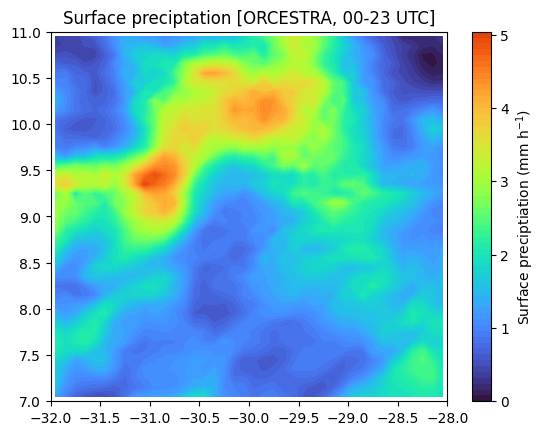

In [18]:

contour=plt.contourf(ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.precip_rate.mean('time').T, cmap='turbo', vmin=0, vmax=6, levels=80)
plt.colorbar(contour, ticks=[0, 1, 2, 3, 4, 5, 6], label='Surface preciptiation (mm h$^{-1}$)', orientation='vertical')
plt.xlim(-32, -28)
plt.ylim(7, 11)
plt.title('Surface preciptation [ORCESTRA, 00-23 UTC]')

In [28]:

del_prec_4sip = ds_4sip.tot_prec.diff('time')

precip_rate_4sip = del_prec_4sip/0.5


# GPM accumulated precipitation
precip_rate_gpm = ds_gpm_orc.precip_rate.mean(dim=('lon', 'lat'))
acc_precip_gpm = precip_rate_gpm.cumsum(dim='time')

#plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'k--', linewidth=lnwdth, label='GPM-Obs')

#plt.plot(acc_precip_gpm)

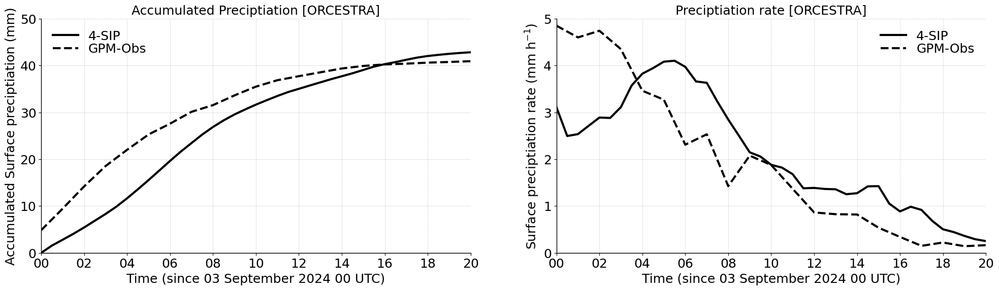

In [20]:
plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_4sip.time, ds_4sip.tot_prec.mean(dim=('ncells')), 'k-', linewidth=lnwdth, label='4-SIP')

plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'k--', linewidth=lnwdth, label='GPM-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0,50)
plt.yticks(fontsize=fontsize)
plt.ylabel('Accumulated Surface preciptiation (mm)', fontsize=fontsize)#, fontweight='bold')
plt.title('Accumulated Preciptiation [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_4sip.time[:-1], precip_rate_4sip.mean(dim=('ncells')), 'k-', linewidth=lnwdth, label='4-SIP')

plt.plot(ds_gpm_orc.time, ds_gpm_orc.precip_rate.mean(dim=('lon','lat')), 'k--', linewidth=lnwdth, label='GPM-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0,5)
plt.yticks(fontsize=fontsize)
plt.ylabel('Surface preciptiation rate (mm h$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Preciptiation rate [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()

In [41]:

print(grid_orc.clon)
print(clat_deg)
ds_4sip.rain_gsp.max().values

<xarray.DataArray 'clon' (cell: 73960)>
array([-0.558684, -0.558691, -0.55889 , ..., -0.522908, -0.523103, -0.523113])
Coordinates:
    clon     (cell) float64 -0.5587 -0.5587 -0.5589 ... -0.5229 -0.5231 -0.5231
    clat     (cell) float64 0.1827 0.1829 0.183 0.1837 ... 0.1563 0.1565 0.1567
Dimensions without coordinates: cell
Attributes:
    units:          radian
    standard_name:  grid_longitude
    bounds:         clon_vertices
<xarray.DataArray 'clat' (cell: 72358)>
array([10.52259672, 10.59617495, 10.60703026, ...,  8.95758007,
        8.96443274,  8.97559418])
Coordinates:
    clon     (cell) float64 -0.5585 -0.5585 -0.5585 ... -0.5229 -0.5231 -0.5231
    clat     (cell) float64 0.1837 0.1849 0.1851 0.1862 ... 0.1563 0.1565 0.1567
Dimensions without coordinates: cell
Attributes:
    units:          radian
    standard_name:  grid_latitude
    bounds:         clat_vertices


array(404.82153, dtype=float32)

In [19]:

ds_gpm_orc['tot_prec'] = ds_gpm_orc.precip_rate.cumsum('time')

ds_4sip['precip_rate'] = 0.5*ds_4sip.tot_prec.diff('time')
ds_gpm_orc['tot_prec'] = ds_gpm_orc.precip_rate.cumsum('time')
#ds_gpm_orc['tot_prec'] = ds_gpm_orc.precip_rate.cumsum('time')
#acc_precip_gpm = precip_rate_gpm.cumsum(dim='time')

precip_masked = np.ma.masked_where(ds_4sip.precip_rate == 10, ds_4sip.precip_rate)

clon_deg = -1*np.degrees(grid_orc.clon)
clat_deg = np.degrees(grid_orc.clat)

precip_masked.shape
print(ds_gpm_orc.tot_prec.mean(dim=()).max().values)
print(ds_4sip.rain_gsp.max().values)

119.1663
423.92322


In [57]:
ds_gpm_orc

<xarray.Dataset>
Dimensions:      (time: 24, lon: 40, lat: 40)
Coordinates:
  * time         (time) datetime64[ns] 2024-09-03 ... 2024-09-03T23:00:00
  * lon          (lon) float32 -31.95 -31.85 -31.75 ... -28.25 -28.15 -28.05
  * lat          (lat) float32 7.05 7.15 7.25 7.35 ... 10.65 10.75 10.85 10.95
Data variables:
    precip_rate  (time, lon, lat) float32 0.7476 1.783 3.764 ... 0.0 0.0 0.0
    tot_prec     (time, lon, lat) float32 0.7476 1.783 3.764 ... 5.65 7.231

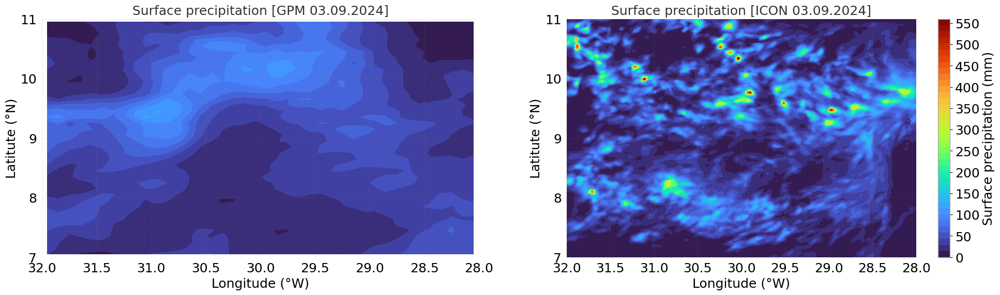

In [46]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0,560,40)

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
#contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.tot_prec.mean('time').T, levels=lev, cmap='turbo')
contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.tot_prec.isel(time=-1).T, levels=lev, cmap='turbo')
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500], label='Surface precipitation (mm)')
#colorbar.ax.tick_params(labelsize=12)
#colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [GPM 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
#contour=plt.tricontourf(clon_deg, clat_deg, ds_4sip.tot_prec.mean('time').T, levels=lev, cmap='turbo')#, levels=lev)
contour=plt.tricontourf(clon_deg, clat_deg, ds_4sip.tot_prec.isel(time=-1).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar(contour, ticks=[0, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()


# ERA-5 precipitation

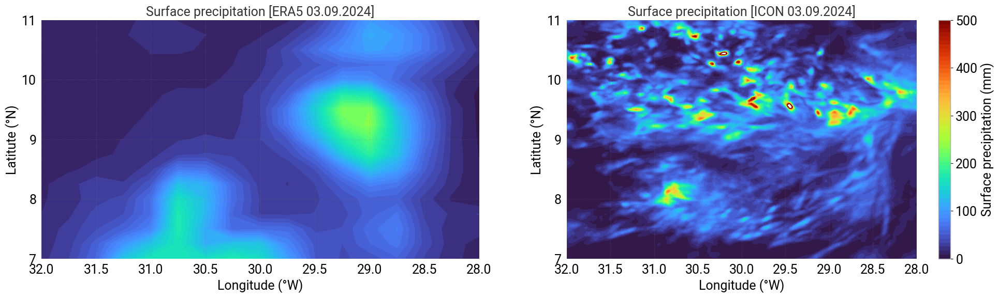

In [67]:

#ds_era5 = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc', 'r')
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_e5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

#plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, ds_e5.tp.mean('valid_time'))

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 500, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 1.e3*ds_e5.tp.sum('valid_time').T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ERA5 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), ds_4sip.tot_prec.isel(time=-1).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 100, 200, 300, 400, 500, 600], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

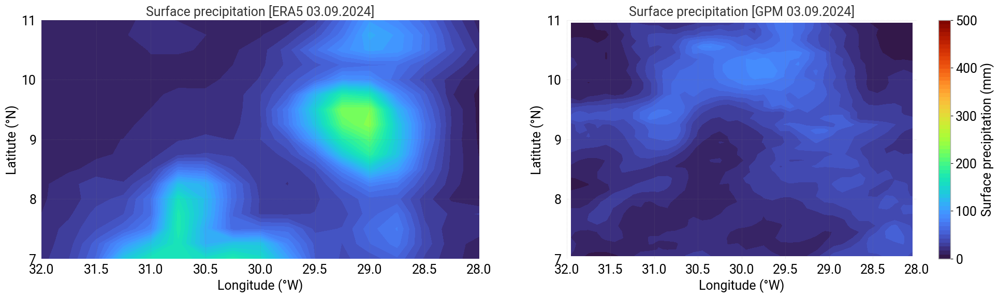

In [68]:

#ds_era5 = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc', 'r')
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_e5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

#plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, ds_e5.tp.mean('valid_time'))

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 500, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 1.e3*ds_e5.tp.sum('valid_time').T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ERA5 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.tot_prec.mean('time').T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 100, 200, 300, 400, 500, 600], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [GPM 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

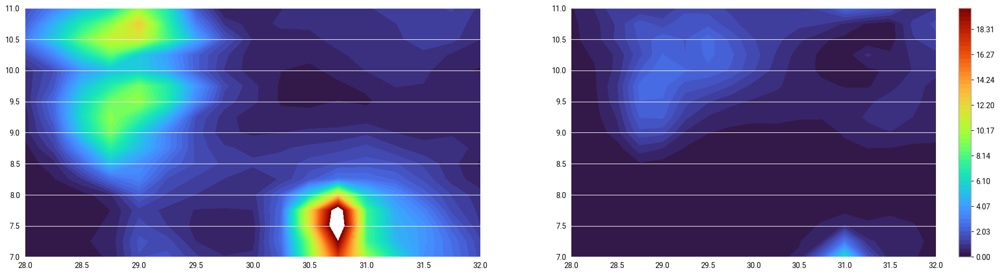

In [69]:

lev = np.linspace(0, 20, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 1.e3*ds_e5.tp.isel(valid_time=14).T, levels=lev, cmap='turbo')
#plt.colorbar()

plt.subplot(1,2,2)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 1.e3*ds_e5.tp.isel(valid_time=19).T, levels=lev, cmap='turbo')
plt.colorbar()

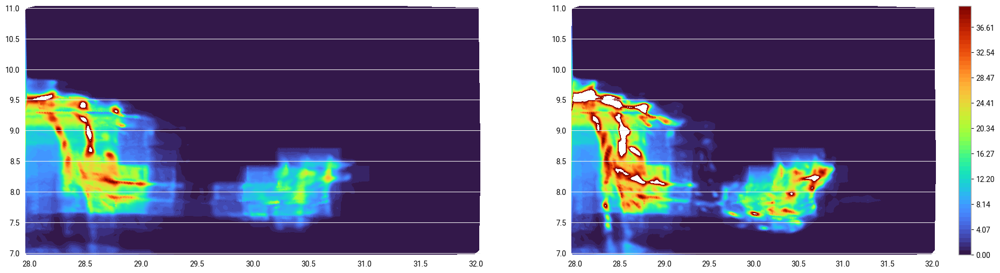

In [70]:
lev = np.linspace(0, 40, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), ds_4sip.tot_prec.isel(time=2).T, levels=lev, cmap='turbo')
#plt.colorbar()

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), ds_4sip.tot_prec.isel(time=3).T, levels=lev, cmap='turbo')
plt.colorbar()

In [71]:
ds_e5

<xarray.Dataset>
Dimensions:     (valid_time: 25, latitude: 17, longitude: 17)
Coordinates:
    number      int64 ...
  * valid_time  (valid_time) datetime64[ns] 2024-09-03 ... 2024-09-04
  * latitude    (latitude) float64 11.0 10.75 10.5 10.25 ... 7.75 7.5 7.25 7.0
  * longitude   (longitude) float64 -32.0 -31.75 -31.5 ... -28.5 -28.25 -28.0
    expver      (valid_time) <U4 dask.array<chunksize=(25,), meta=np.ndarray>
Data variables:
    tp          (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    tisr        (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    tsr         (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    tsrc        (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    ttr         (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    ttrc        (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    cp          (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    lsp         (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
    lspf        (valid_time, latitude, longitude) float32 dask.array<chunksize=(25, 17, 17), meta=np.ndarray>
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-04-11T09:50 GRIB to CDM+CF via cfgrib-0.9.1...

In [72]:
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-instant.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_era5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_era5.valid_time
#plt.plot(ds_era5.valid_time, ds_era5.tclw.mean(dim=('longitude','latitude')))

<xarray.DataArray 'valid_time' (valid_time: 25)>
array(['2024-09-03T00:00:00.000000000', '2024-09-03T01:00:00.000000000',
       '2024-09-03T02:00:00.000000000', '2024-09-03T03:00:00.000000000',
       '2024-09-03T04:00:00.000000000', '2024-09-03T05:00:00.000000000',
       '2024-09-03T06:00:00.000000000', '2024-09-03T07:00:00.000000000',
       '2024-09-03T08:00:00.000000000', '2024-09-03T09:00:00.000000000',
       '2024-09-03T10:00:00.000000000', '2024-09-03T11:00:00.000000000',
       '2024-09-03T12:00:00.000000000', '2024-09-03T13:00:00.000000000',
       '2024-09-03T14:00:00.000000000', '2024-09-03T15:00:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T17:00:00.000000000',
       '2024-09-03T18:00:00.000000000', '2024-09-03T19:00:00.000000000',
       '2024-09-03T20:00:00.000000000', '2024-09-03T21:00:00.000000000',
       '2024-09-03T22:00:00.000000000', '2024-09-03T23:00:00.000000000',
       '2024-09-04T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
    number      int64 ...
  * valid_time  (valid_time) datetime64[ns] 2024-09-03 ... 2024-09-04
    expver      (valid_time) <U4 dask.array<chunksize=(25,), meta=np.ndarray>
Attributes:
    long_name:      time
    standard_name:  time

In [28]:
ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['clwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['ciwp_kgperm2'] = (ds_4sip.qi*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['rwp_kgperm2'] = (ds_4sip.qr*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip = ds_4sip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip = ds_4sip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip = ds_4sip.rwp_kgperm2.mean('ncells')

ds_nosip['dz'] = ds_nosip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_nosip['clwp_kgperm2'] = (ds_nosip.qc*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['ciwp_kgperm2'] = (ds_nosip.qi*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['rwp_kgperm2'] = (ds_nosip.qr*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')

avg_clwp_kgperm2_nosip = ds_nosip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_nosip = ds_nosip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_nosip = ds_nosip.rwp_kgperm2.mean('ncells')

time_hr_icon = np.linspace(0,20,41)
time_hr_obs = np.linspace(14.28,15.17,9)

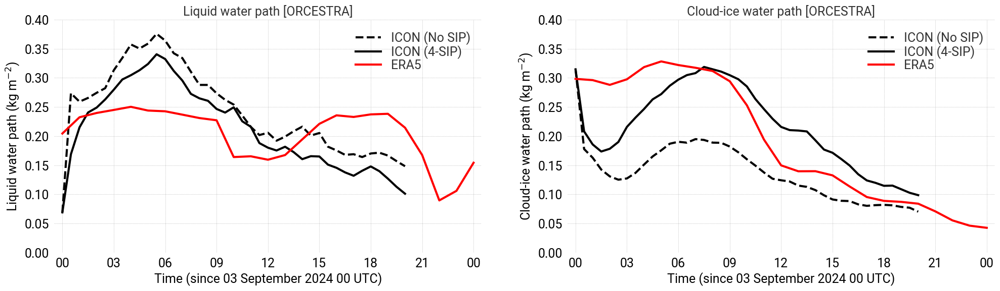

In [73]:
ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['clwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['ciwp_kgperm2'] = (ds_4sip.qi*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['rwp_kgperm2'] = (ds_4sip.qr*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip = ds_4sip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip = ds_4sip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip = ds_4sip.rwp_kgperm2.mean('ncells')

ds_nosip['dz'] = ds_nosip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_nosip['clwp_kgperm2'] = (ds_nosip.qc*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['ciwp_kgperm2'] = (ds_nosip.qi*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['rwp_kgperm2'] = (ds_nosip.qr*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')

avg_clwp_kgperm2_nosip = ds_nosip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_nosip = ds_nosip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_nosip = ds_nosip.rwp_kgperm2.mean('ncells')

time_hr_icon = np.linspace(0,20,41)
time_hr_obs = np.linspace(14.28,15.17,9)

plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.plot(ds_nosip.time, avg_clwp_kgperm2_nosip, 'k--', linewidth=lnwdth, label='ICON (No SIP)')
plt.plot(ds_4sip.time, avg_clwp_kgperm2_4sip, 'k-', linewidth=lnwdth, label='ICON (4-SIP)')
plt.plot(ds_era5.valid_time, ds_era5.tclw.mean(dim=('longitude','latitude')), 'r-', linewidth=lnwdth, label='ERA5')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

#plt.xlim(0,20)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Liquid water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Liquid water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt.plot(ds_nosip.time, avg_ciwp_kgperm2_nosip, 'k--', linewidth=lnwdth, label='ICON (No SIP)')
plt.plot(ds_4sip.time, avg_ciwp_kgperm2_4sip, 'k-', linewidth=lnwdth, label='ICON (4-SIP)')
plt.plot(ds_era5.valid_time, ds_era5.tciw.mean(dim=('longitude','latitude')), 'r-', linewidth=lnwdth, label='ERA5')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

#plt.xlim(0,20)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Cloud-ice water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Cloud-ice water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

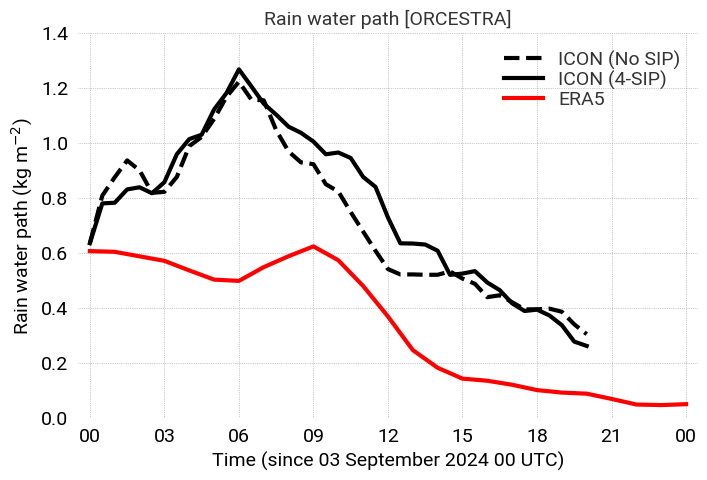

In [75]:


plt.figure(figsize=(8, 5))

lnwdth=3
fontsize=14

plt.plot(ds_nosip.time, avg_rwp_kgperm2_nosip, 'k--', linewidth=lnwdth, label='ICON (No SIP)')
plt.plot(ds_4sip.time, avg_rwp_kgperm2_4sip, 'k-', linewidth=lnwdth, label='ICON (4-SIP)')
plt.plot(ds_era5.valid_time, ds_era5.tcrw.mean(dim=('longitude','latitude')), 'r-', linewidth=lnwdth, label='ERA5')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

#plt.xlim(0,20)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 1.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Rain water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Rain water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

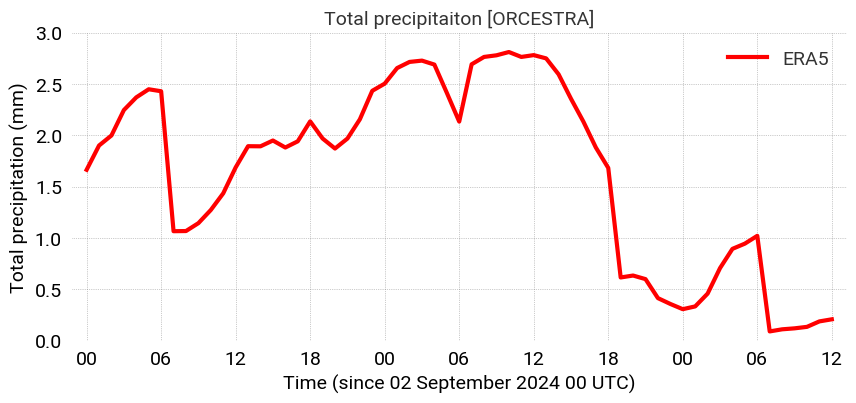

In [76]:
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc')

min_time = '2024-09-02T00:00:00.000000000'
max_time = '2024-09-04T12:00:00.000000000'

ds_e5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_e5['precip_rate'] = 1.e3*ds_e5.tp # m to mm, since data is hourly it also represent amount of rainfall per hour
#print(ds_e5.valid_time)


plt.figure(figsize=(10, 4))

lnwdth=3
fontsize=14

#plt.plot(ds_e5.valid_time, 1.e3*ds_e5.tp.mean(dim=('longitude','latitude')), 'r-', linewidth=lnwdth, label='ERA5')
plt.plot(ds_e5.valid_time, ds_e5.precip_rate.mean(dim=('longitude','latitude')), 'r-', linewidth=lnwdth, label='ERA5')

plt.xlabel('Time (since 02 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

#plt.xlim(0,20)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 2, 0, 0) 
end_date = datetime(2024, 9, 4, 12, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 3)
plt.yticks(fontsize=fontsize)
plt.ylabel('Total precipitation (mm)', fontsize=fontsize)#, fontweight='bold')
plt.title('Total precipitaiton [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

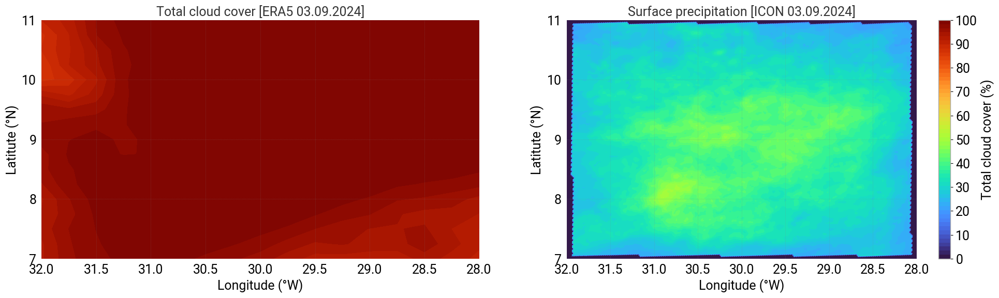

In [77]:

#ds_era5 = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc', 'r')
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-instant.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_era5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_era5.valid_time

#plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, ds_e5.tp.mean('valid_time'))

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 100, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 100*ds_era5.tcc.mean(dim=('valid_time')).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Total cloud cover (%)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Total cloud cover [ERA5 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), ds_4sip.clc.mean(dim=('time','height')).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100], label='Total cloud cover (%)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Total cloud cover (%)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

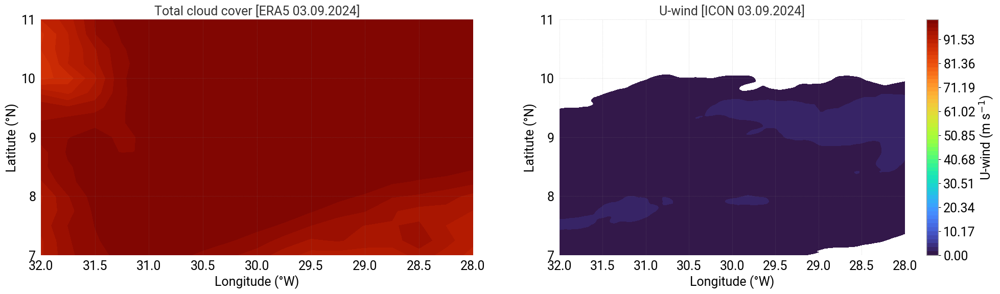

In [78]:

#ds_era5 = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc', 'r')
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-instant.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_era5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_era5.valid_time

#plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, ds_e5.tp.mean('valid_time'))

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 100, 60)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 100*ds_era5.tcc.mean(dim=('valid_time')).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Total cloud cover (%)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Total cloud cover [ERA5 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), ds_4sip.u.mean(dim=('time','height')).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar()#contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100], label='Total cloud cover (%)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='U-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('U-wind [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

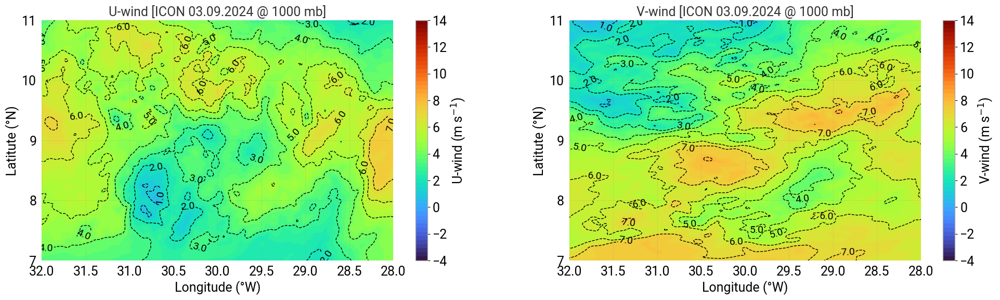

In [79]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(-4, 14, 60)
lev1 = np.arange(-4, 15, 1)
lev2 = np.arange(-4, 15, 1)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.u.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                               ds_4sip.u.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='U-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='U-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('U-wind [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.v.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_4sip.clon), np.ds_4sip_2Sept00utcdegrees(ds_4sip.clat), 
                               ds_4sip.v.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='V-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='V-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('V-wind [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

In [80]:


print(ds_4sip.pres[1,-13,1].values)
print()
print(ds_era5_met.pressure_level)

91808.984



NameError: name 'ds_era5_met' is not defined

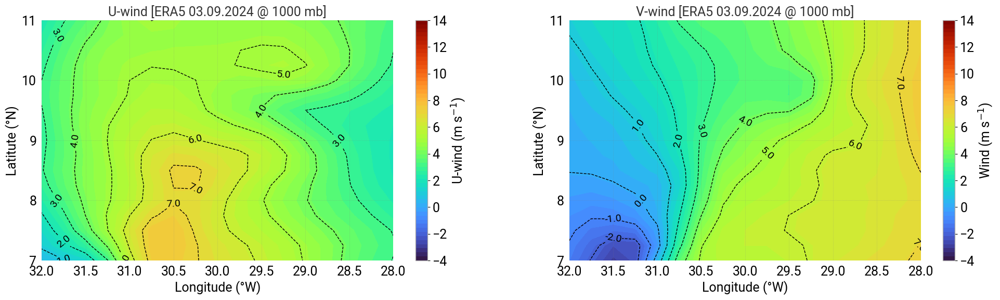

In [81]:

ds_era5_met = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/met/9d260e1833105e1cfeea896b83eec5ed.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_era5_met = ds_era5_met.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_era5_met.valid_time



lnwdth = 3;
fontsize = 18;
lev = np.linspace(-4, 14, 60)
lev1 = np.arange(-4, 15, 1)
lev2 = np.arange(-4, 15, 1)

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.u.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.u.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='U-wind (m s$^{-1}$)')
#colorbar = plt.colorbar(contour, ticks=[-4, -3, -2, -1, 0, 1, 2, 3, 4], label='Total cloud cover (%)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='U-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('U-wind [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.v.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.v.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='V-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('V-wind [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

# ERA5/ICON temperature

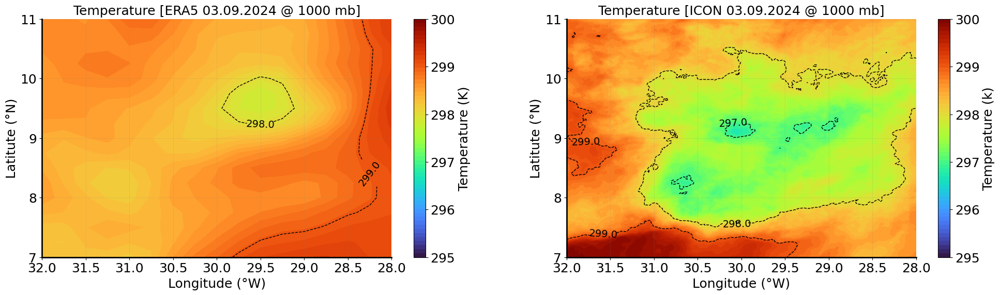

In [92]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(295, 300, 60)
lev1 = np.arange(295, 300, 1)
#lev2 = np.arange(-4, 15, 1)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.t.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.t.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[295, 296, 297, 298, 299, 300], label='Temperature (k)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Temperature (K)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Temperature [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.temp.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                               ds_4sip.temp.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[295, 296, 297, 298, 299, 300], label='Temperature (K)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Temperature (k)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Temperature [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

# QV

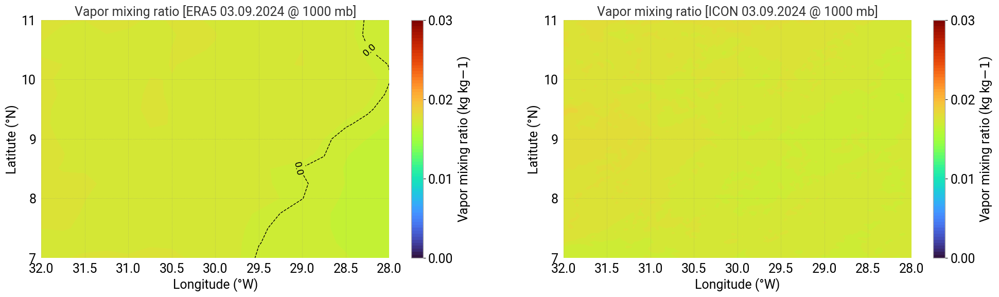

In [82]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 0.03, 80)
lev1 = np.arange(0, 0.03, 0.001)
#lev2 = np.arange(-4, 15, 1)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.q.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.q.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 0.01, 0.02, 0.03], label='Vapor mixing ratio (kg kg${-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Vapor mixing ratio (kg kg${-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Vapor mixing ratio [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.qv.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                               np.log(ds_4sip.qv.isel(height=-3).mean(dim=('time')).T), levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 0.01, 0.02, 0.03], label='Vapor mixing ratio (kg kg${-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Vapor mixing ratio (kg kg${-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Vapor mixing ratio [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()


In [83]:


ds_icon = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/run_48h/orcestra_2mom_sip/NWP*DOM01*.nc');



grid_r3b7 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/domain1_DOM01.nc');


clon_deg = np.degrees(grid_r3b7.clon)
clat_deg = np.degrees(grid_r3b7.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-30., 9.])
#print(okla_x), print(okla_y)
dx_deg = 2.; dy_deg = 2.0
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)


window_cell = (
    (grid_r3b7.clat >= np.deg2rad(bottom_bound))
    & (grid_r3b7.clat <= np.deg2rad(top_bound))
    & (grid_r3b7.clon >= np.deg2rad(left_bound))
    & (grid_r3b7.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)


# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_r3b7.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
#print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_r3b7.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
#print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)

vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}


def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid


new_grid_r3b7 = reindex_grid(grid_r3b7, selected_indices, vars_to_renumber)
mask=np.isin(ds_icon['ncells'], selected_indices.cell)

ds_icon = ds_icon.sel(ncells=mask)


-42.29607367427899
-17.706708534961223
-3.264115184070921
21.255737631777357
-32.0
-28.0
11.0
7.0


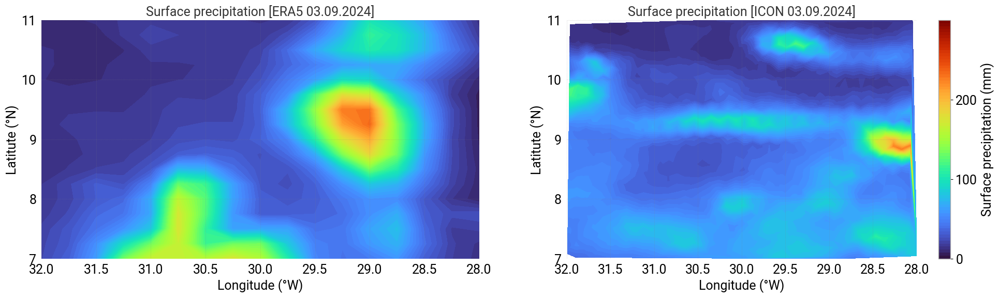

In [84]:

#ds_era5 = netCDF4.Dataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc', 'r')
ds_era5 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/precip/data_stream-oper_stepType-accum.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_e5 = ds_era5.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

#plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, ds_e5.tp.mean('valid_time'))

lnwdth = 3;
fontsize = 18;
lev = np.linspace(0, 300, 80)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1.*ds_e5.longitude, ds_e5.latitude, 1.e3*ds_e5.tp.sum('valid_time').T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Surface precipitation (mm)')
#colorbar.ax.tick_params(labelsize=12)
#colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ERA5 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), ds_icon.tot_prec.isel(time=-1).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[0, 100, 200], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

In [85]:
ds_gpm_orc.time
ds_icon.time

<xarray.DataArray 'time' (time: 97)>
array(['2024-09-02T00:00:00.000000000', '2024-09-02T00:30:00.000000000',
       '2024-09-02T01:00:00.000000000', '2024-09-02T01:30:00.000000000',
       '2024-09-02T02:00:00.000000000', '2024-09-02T02:30:00.000000000',
       '2024-09-02T03:00:00.000000000', '2024-09-02T03:30:00.000000000',
       '2024-09-02T04:00:00.000000000', '2024-09-02T04:30:00.000000000',
       '2024-09-02T05:00:00.000000000', '2024-09-02T05:30:00.000000000',
       '2024-09-02T06:00:00.000000000', '2024-09-02T06:30:00.000000000',
       '2024-09-02T07:00:00.000000000', '2024-09-02T07:30:00.000000000',
       '2024-09-02T08:00:00.000000000', '2024-09-02T08:30:00.000000000',
       '2024-09-02T09:00:00.000000000', '2024-09-02T09:30:00.000000000',
       '2024-09-02T10:00:00.000000000', '2024-09-02T10:30:00.000000000',
       '2024-09-02T11:00:00.000000000', '2024-09-02T11:30:00.000000000',
       '2024-09-02T12:00:00.000000000', '2024-09-02T12:30:00.000000000',
       '2024-09-02T13:00:00.000000000', '2024-09-02T13:30:00.000000000',
       '2024-09-02T14:00:00.000000000', '2024-09-02T14:30:00.000000000',
       '2024-09-02T15:00:00.000000000', '2024-09-02T15:30:00.000000000',
       '2024-09-02T16:00:00.000000000', '2024-09-02T16:30:00.000000000',
       '2024-09-02T17:00:00.000000000', '2024-09-02T17:30:00.000000000',
       '2024-09-02T18:00:00.000000000', '2024-09-02T18:30:00.000000000',
       '2024-09-02T19:00:00.000000000', '2024-09-02T19:30:00.000000000',
       '2024-09-02T20:00:00.000000000', '2024-09-02T20:30:00.000000000',
       '2024-09-02T21:00:00.000000000', '2024-09-02T21:30:00.000000000',
       '2024-09-02T22:00:00.000000000', '2024-09-02T22:30:00.000000000',
       '2024-09-02T23:00:00.000000000', '2024-09-02T23:30:00.000000000',
       '2024-09-03T00:00:00.000000000', '2024-09-03T00:30:00.000000000',
       '2024-09-03T01:00:00.000000000', '2024-09-03T01:30:00.000000000',
       '2024-09-03T02:00:00.000000000', '2024-09-03T02:30:00.000000000',
       '2024-09-03T03:00:00.000000000', '2024-09-03T03:30:00.000000000',
       '2024-09-03T04:00:00.000000000', '2024-09-03T04:30:00.000000000',
       '2024-09-03T05:00:00.000000000', '2024-09-03T05:30:00.000000000',
       '2024-09-03T06:00:00.000000000', '2024-09-03T06:30:00.000000000',
       '2024-09-03T07:00:00.000000000', '2024-09-03T07:30:00.000000000',
       '2024-09-03T08:00:00.000000000', '2024-09-03T08:30:00.000000000',
       '2024-09-03T09:00:00.000000000', '2024-09-03T09:30:00.000000000',
       '2024-09-03T10:00:00.000000000', '2024-09-03T10:30:00.000000000',
       '2024-09-03T11:00:00.000000000', '2024-09-03T11:30:00.000000000',
       '2024-09-03T12:00:00.000000000', '2024-09-03T12:30:00.000000000',
       '2024-09-03T13:00:00.000000000', '2024-09-03T13:30:00.000000000',
       '2024-09-03T14:00:00.000000000', '2024-09-03T14:30:00.000000000',
       '2024-09-03T15:00:00.000000000', '2024-09-03T15:30:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T16:30:00.000000000',
       '2024-09-03T17:00:00.000000000', '2024-09-03T17:30:00.000000000',
       '2024-09-03T18:00:00.000000000', '2024-09-03T18:30:00.000000000',
       '2024-09-03T19:00:00.000000000', '2024-09-03T19:30:00.000000000',
       '2024-09-03T20:00:00.000000000', '2024-09-03T20:30:00.000000000',
       '2024-09-03T21:00:00.000000000', '2024-09-03T21:30:00.000000000',
       '2024-09-03T22:00:00.000000000', '2024-09-03T22:30:00.000000000',
       '2024-09-03T23:00:00.000000000', '2024-09-03T23:30:00.000000000',
       '2024-09-04T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2024-09-02 2024-09-02T00:30:00 ... 2024-09-04
Attributes:
    standard_name:  time
    axis:           T

In [86]:
ds_gpm_orc.time[1]
ds_icon.time[50]

<xarray.DataArray 'time' ()>
array('2024-09-03T01:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2024-09-03T01:00:00
Attributes:
    standard_name:  time
    axis:           T

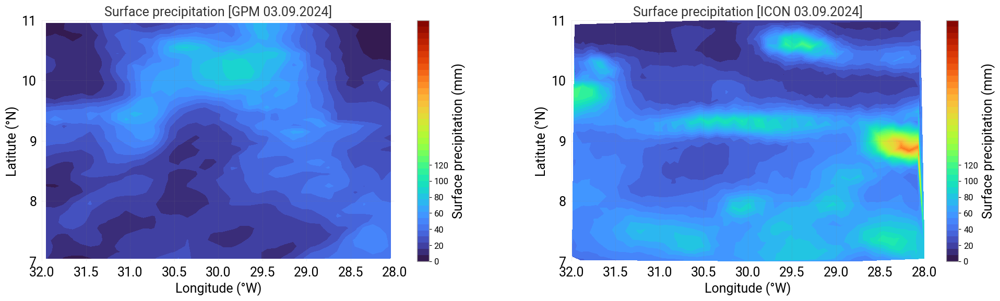

In [87]:

lnwdth = 3;
fontsize = 18;

lev = np.linspace(0,300,40)

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
#contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.tot_prec.isel(time=1).T, levels=lev, cmap='turbo')#, levels=lev)
contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.tot_prec.mean('time').T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar(contour, ticks=[0, 20, 40, 60, 80, 100, 120], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [GPM 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), ds_icon.tot_prec.isel(time=-1).T, levels=lev, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar(contour, ticks=[0, 20, 40, 60, 80, 100, 120], label='Surface precipitation (mm)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()


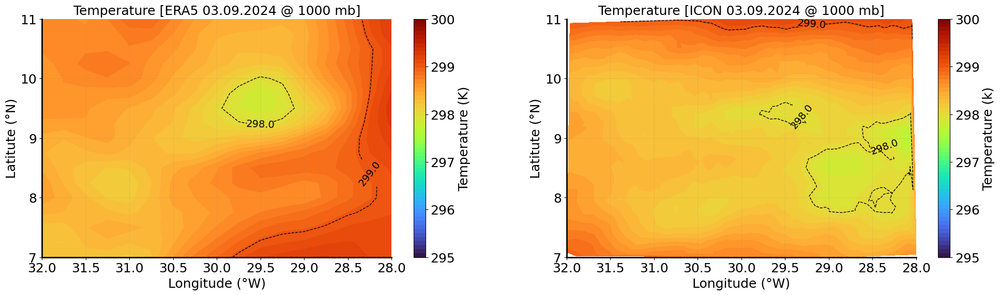

In [55]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(295, 300, 60)
lev1 = np.arange(295, 300, 1)
#lev2 = np.arange(-4, 15, 1)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.t.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.t.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[295, 296, 297, 298, 299, 300], label='Temperature (k)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Temperature (K)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Temperature [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                        ds_icon.temp.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                               ds_icon.temp.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[295, 296, 297, 298, 299, 300], label='Temperature (K)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Temperature (k)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Temperature [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

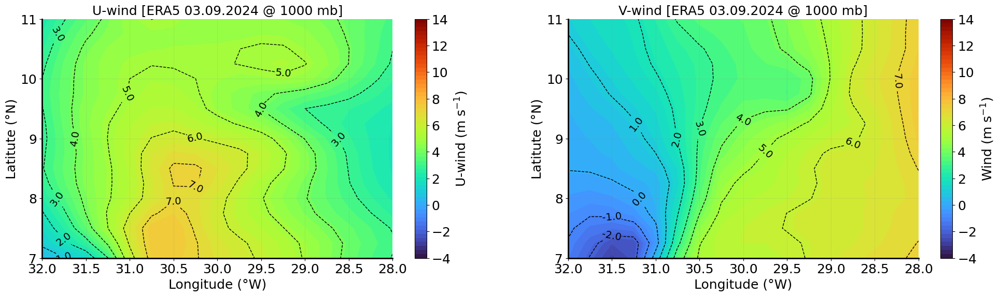

In [56]:

ds_era5_met = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/observations/era5/met/9d260e1833105e1cfeea896b83eec5ed.nc')

min_time = '2024-09-03T00:00:00.000000000'
max_time = '2024-09-04T00:00:00.000000000'

ds_era5_met = ds_era5_met.sel(valid_time=slice(min_time, max_time), longitude=slice(-32, -28), latitude=slice(11, 7))

ds_era5_met.valid_time



lnwdth = 3;
fontsize = 18;
lev = np.linspace(-4, 14, 60)
lev1 = np.arange(-4, 15, 1)
lev2 = np.arange(-4, 15, 1)

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.u.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.u.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='U-wind (m s$^{-1}$)')
#colorbar = plt.colorbar(contour, ticks=[-4, -3, -2, -1, 0, 1, 2, 3, 4], label='Total cloud cover (%)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='U-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('U-wind [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.contourf(-1*ds_era5_met.longitude, ds_era5_met.latitude, 
                     ds_era5_met.v.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                    levels=lev, cmap='turbo')
contours = plt.contour(-1*ds_era5_met.longitude, ds_era5_met.latitude,
                       ds_era5_met.v.isel(pressure_level=0).mean(dim=('valid_time')).T, 
                       levels=lev1, colors='black', linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='V-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('V-wind [ERA5 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

In [62]:
ds_icon.pres.isel(height=-3).values

array([[100399.29 , 100388.6  , 100385.86 , ..., 100485.52 , 100490.73 ,
        100490.57 ],
       [100389.15 , 100375.445, 100366.17 , ..., 100498.92 , 100498.21 ,
        100495.89 ],
       [100432.484, 100419.37 , 100406.625, ..., 100526.91 , 100527.766,
        100521.375],
       ...,
       [100251.766, 100258.05 , 100260.88 , ..., 100349.28 , 100351.164,
        100349.28 ],
       [100277.94 , 100287.23 , 100288.63 , ..., 100379.52 , 100379.87 ,
        100377.76 ],
       [100287.484, 100295.9  , 100297.336, ..., 100396.695, 100396.875,
        100403.38 ]], dtype=float32)

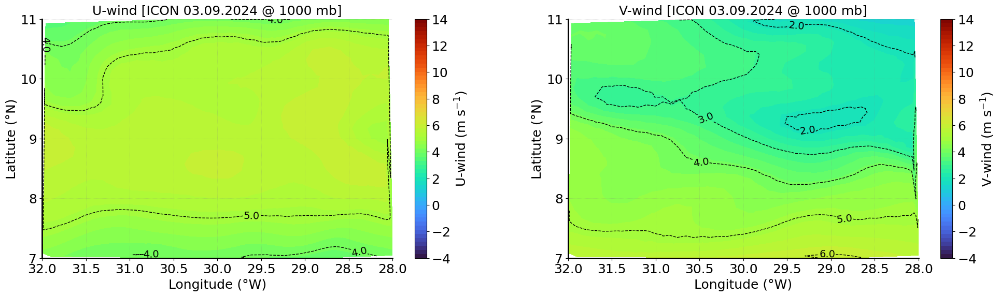

In [60]:

lnwdth = 3;
fontsize = 18;
lev = np.linspace(-4, 14, 60)
lev1 = np.arange(-4, 15, 1)
lev2 = np.arange(-4, 15, 1)
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
contour=plt.tricontourf(-1*np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                        ds_icon.u.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                               ds_icon.u.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='U-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='U-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('U-wind [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(-1*np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                        ds_icon.v.isel(height=-3).mean(dim=('time')).T,  levels=lev, cmap='turbo')
contours = plt.tricontour(-1 * np.degrees(ds_icon.clon), np.degrees(ds_icon.clat), 
                               ds_icon.v.isel(height=-3).mean(dim=('time')).T, levels=lev1, colors='black', 
                               linestyles='--', linewidths=1)

plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.1f')

#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
#colorbar = plt.colorbar()#contour, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18], label='Surface precipitation (mm)')
colorbar = plt.colorbar(contour, ticks=[-4, -2, 0, 2, 4, 6, 8, 10, 12, 14], label='V-wind (m s$^{-1}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='V-wind (m s$^{-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([7, 11]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('V-wind [ICON 03.09.2024 @ 1000 mb]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()

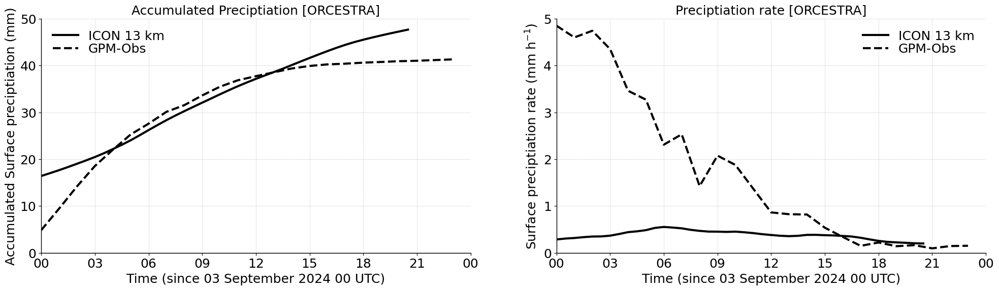

In [52]:



precip_rate_gpm = ds_gpm_orc.precip_rate.mean(dim=('lon', 'lat'))
acc_precip_gpm = precip_rate_gpm.cumsum(dim='time')

ds_icon['precip_rate'] = (1./0.5)*ds_icon.tot_prec.diff('time')

lnwdth=3
fontsize=18

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_icon.time, ds_icon.tot_prec.mean(dim=('ncells')), 'k-', linewidth=lnwdth, label='ICON 13 km')

plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'k--', linewidth=lnwdth, label='GPM-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0,50)
plt.yticks(fontsize=fontsize)
plt.ylabel('Accumulated Surface preciptiation (mm)', fontsize=fontsize)#, fontweight='bold')
plt.title('Accumulated Preciptiation [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_icon.time, ds_icon.precip_rate.mean(dim=('ncells')), 'k-', linewidth=lnwdth, label='ICON 13 km')

plt.plot(ds_gpm_orc.time, ds_gpm_orc.precip_rate.mean(dim=('lon','lat')), 'k--', linewidth=lnwdth, label='GPM-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0,5)
plt.yticks(fontsize=fontsize)
plt.ylabel('Surface preciptiation rate (mm h$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Preciptiation rate [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()

In [145]:
ds_4sip.time

<xarray.DataArray 'time' (time: 41)>
array(['2024-09-03T00:00:00.000000000', '2024-09-03T00:30:00.000000000',
       '2024-09-03T01:00:00.000000000', '2024-09-03T01:30:00.000000000',
       '2024-09-03T02:00:00.000000000', '2024-09-03T02:30:00.000000000',
       '2024-09-03T03:00:00.000000000', '2024-09-03T03:30:00.000000000',
       '2024-09-03T04:00:00.000000000', '2024-09-03T04:30:00.000000000',
       '2024-09-03T05:00:00.000000000', '2024-09-03T05:30:00.000000000',
       '2024-09-03T06:00:00.000000000', '2024-09-03T06:30:00.000000000',
       '2024-09-03T07:00:00.000000000', '2024-09-03T07:30:00.000000000',
       '2024-09-03T08:00:00.000000000', '2024-09-03T08:30:00.000000000',
       '2024-09-03T09:00:00.000000000', '2024-09-03T09:30:00.000000000',
       '2024-09-03T10:00:00.000000000', '2024-09-03T10:30:00.000000000',
       '2024-09-03T11:00:00.000000000', '2024-09-03T11:30:00.000000000',
       '2024-09-03T12:00:00.000000000', '2024-09-03T12:30:00.000000000',
       '2024-09-03T13:00:00.000000000', '2024-09-03T13:30:00.000000000',
       '2024-09-03T14:00:00.000000000', '2024-09-03T14:30:00.000000000',
       '2024-09-03T15:00:00.000000000', '2024-09-03T15:30:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T16:30:00.000000000',
       '2024-09-03T17:00:00.000000000', '2024-09-03T17:30:00.000000000',
       '2024-09-03T18:00:00.000000000', '2024-09-03T18:30:00.000000000',
       '2024-09-03T19:00:00.000000000', '2024-09-03T19:30:00.000000000',
       '2024-09-03T20:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2024-09-03 ... 2024-09-03T20:00:00

# EarthCare Vs ICON

## 1. CLWP

In [25]:

ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['clwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['ciwp_kgperm2'] = (ds_4sip.qi*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['rwp_kgperm2'] = (ds_4sip.qr*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip = ds_4sip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip = ds_4sip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip = ds_4sip.rwp_kgperm2.mean('ncells')

ds_4sip_hfreq['dz'] = ds_4sip_hfreq.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip_hfreq['clwp_kgperm2'] = (ds_4sip_hfreq.qc*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['ciwp_kgperm2'] = (ds_4sip_hfreq.qi*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['rwp_kgperm2'] = (ds_4sip_hfreq.qr*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip_hf = ds_4sip_hfreq.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip_hf = ds_4sip_hfreq.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip_hf = ds_4sip_hfreq.rwp_kgperm2.mean('ncells')


ds_nosip['dz'] = ds_nosip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_nosip['clwp_kgperm2'] = (ds_nosip.qc*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['ciwp_kgperm2'] = (ds_nosip.qi*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['rwp_kgperm2'] = (ds_nosip.qr*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')

avg_clwp_kgperm2_nosip = ds_nosip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_nosip = ds_nosip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_nosip = ds_nosip.rwp_kgperm2.mean('ncells')

time_hr_icon = np.linspace(0,20,41)
time_hr_obs = np.linspace(14.28,15.17,9)

Shape of 'Geophysical Data': (1976, 243, 1)
Data type of 'Geophysical Data': int16
Shape of 'lat Data': (1976, 243)
Shape of 'lon Data': (1976, 243)
Shape of 'pix Data': (1, 1976, 243)
Shape of 'pos Data': (1976,)
Shape of 'tim Data': (1976,)
<HDF5 dataset "Scan Time": shape (1976,), type "<f8">
(1976, 243) (1976, 243)


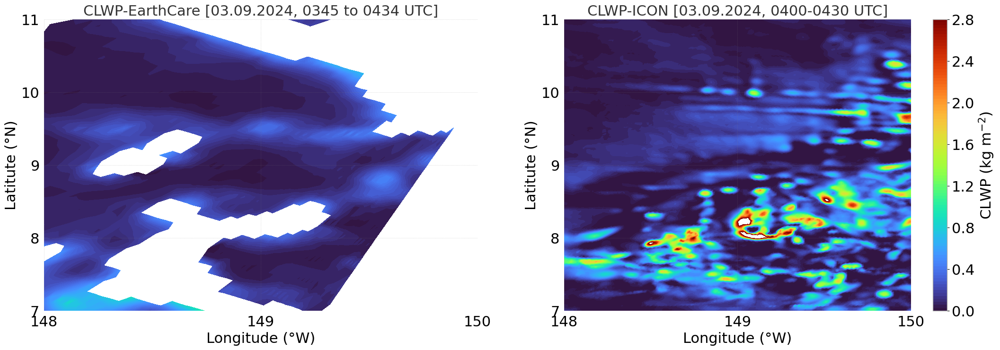

In [26]:


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    # Access the 'Geophysical Data' dataset
    geophysical_data = f['Geophysical Data']
    lat = f['Latitude of Observation Point']
    lon = f['Longitude of Observation Point']
    pix = f['Pixel Data Quality']
    pos = f['Position in Orbit']
    tim = f['Scan Time']
    # Print the shape and data type of the dataset
    print(f"Shape of 'Geophysical Data': {geophysical_data.shape}")
    print(f"Data type of 'Geophysical Data': {geophysical_data.dtype}")
    print(f"Shape of 'lat Data': {lat.shape}")
    print(f"Shape of 'lon Data': {lon.shape}")
    print(f"Shape of 'pix Data': {pix.shape}")
    print(f"Shape of 'pos Data': {pos.shape}")
    print(f"Shape of 'tim Data': {tim.shape}")
    print(tim)
    # To view the data itself, you can load it into memory
    lon_obs = lon[:]
    lat_obs = lat[:]
    lwp_0345 = geophysical_data[:]
    time_obs = tim[:]
    #print(data)


lwp_0345 = lwp_0345[:,:,0]


lwp_0345 = lwp_0345.astype(np.float32)
time_obs = time_obs.astype(np.float32)
lon_obs = lon_obs.astype(np.float32)
lat_obs = lat_obs.astype(np.float32)

lon_min, lon_max = -32, -28
lat_min, lat_max = 7, 11

mask = (
    (lon_obs >= lon_min) & (lon_obs <= lon_max) &
    (lat_obs >= lat_min) & (lat_obs <= lat_max)
)

#lwp_0345 = lwp_0345[mask]

#time_box = time_obs(mask)
rows, cols = np.where(mask)
if rows.size > 0 and cols.size > 0:
    row_min, row_max = rows.min(), rows.max()
    col_min, col_max = cols.min(), cols.max()
    lwp_box = lwp_0345[row_min:row_max+1, col_min:col_max+1]
    lon_box = lon_obs[row_min:row_max+1, col_min:col_max+1]
    lat_box = lat_obs[row_min:row_max+1, col_min:col_max+1]
else:
    print("No data in the specified region.")


lwp_0345[lwp_0345 < 0.] = np.nan
avg_lwp_0345 = np.nanmean(lwp_0345, axis = 1)
print(lon_obs.shape, lat_obs.shape)

time_hr_0345 = np.linspace(3.45, 4.34,1976)
time_hr_icon = np.linspace(0,20,41)

#print(time_hr_0345)
#print(np.nanmin(time_obs), np.nanmax(time_obs))
#print(np.max(avg_lwp_obs), np.min(avg_lwp_obs))
#plt.plot(time_hr_0345, 1.e-3*avg_lwp_0345)
#plt.plot(time_hr_icon, ds_4sip.clwp_kgperm2.mean(dim=('ncells')))


###################################
clwp_4sip = ds_4sip.clwp_kgperm2.isel(time=slice(8, 9)).mean(dim='time')
ln_clwp_4sip = np.log(clwp_4sip + 1e-10).T # a small offset value 1.e-10 (cloud-free region) is added to avoid non-finite overflow
#ln_clwp_4sip = np.log(clwp_4sip).T

#clwp_4sip = ds_4sip.clwp_kgperm2.isel(time=slice(0, 8)).mean(dim='time')
#clwp_4sip = clwp_4sip.where(clwp_4sip > 0)  # Mask non-positive values
#ln_clwp_4sip = np.log(clwp_4sip).T

colors = ['white', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'goldenrod', 
          'darkorange', 'red', 'firebrick', 'maroon', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)

cmap='turbo'
lnwdth = 3;
fontsize = 22;
lev = np.linspace(0, 2.8, 100)
#lev = np.linspace(-5, 1, 200)
plt.figure(figsize=(26, 8))

plt.subplot(1,2,1)
contour=plt.contourf(180.+lon_box, lat_box, 1.e-3*lwp_box, levels=lev, cmap=cmap)
#contours = plt.contour(180.+lon_box, lat_box, 1.e-3*lwp_box, levels=lev, colors='white', linestyles='--', linewidths=1)
#plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.2f')

#colorbar = plt.colorbar(contour, ticks=[0, 0.4, 0.8, 1.2, 1.6, 2.0],label='CLWP (kg m$^{-2}$)')
#colorbar.ax.tick_params(labelsize=fontsize)
#colorbar.set_label(label='CLWP (kg m$^{-2}$)', size=fontsize)

plt.xlim([148, 150]); 
plt.ylim([7, 11]); 
plt.xticks([148, 149, 150], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('CLWP-EarthCare [03.09.2024, 0345 to 0434 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
#contour=plt.tricontourf(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
#                        ds_4sip.clwp_kgperm2.isel(time=slice(7, 9)).mean(dim=('time')).T,  levels=lev, cmap=cmap)
contour=plt.tricontourf(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.clwp_kgperm2.isel(time=6).T,  levels=lev, cmap=cmap)

#contour=plt.tricontourf(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
#                        ln_clwp_4sip,  levels=lev, cmap=cmap)

#contours = plt.tricontour(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
#                               ds_4sip.clwp_kgperm2.mean(dim=('time')).T, levels=lev, colors='white', 
#                               linestyles='--', linewidths=1)
#plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.2f')

#colorbar = plt.colorbar(contour, ticks=[-5, -4, -3, -2, -1, 0, 1],label='CLWP (kg m$^{-2}$)')
colorbar = plt.colorbar(contour, ticks=[0, 0.4, 0.8, 1.2, 1.6, 2, 2.4, 2.8],label='CLWP (kg m$^{-2}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='CLWP (kg m$^{-2}$)', size=fontsize)
plt.xlim([148, 150]); 
plt.ylim([7, 11]); 
plt.xticks([148, 149, 150], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('CLWP-ICON [03.09.2024, 0400-0430 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()
###################################


In [238]:
lat_obs.shape

(1976, 243)

Shape of 'Geophysical Data': (1980, 243, 1)
Data type of 'Geophysical Data': int16
Shape of 'lat Data': (1980, 243)
Shape of 'lon Data': (1980, 243)
Shape of 'pix Data': (1, 1980, 243)
Shape of 'pos Data': (1980,)
Shape of 'tim Data': (1980,)
<HDF5 dataset "Scan Time": shape (1980,), type "<f8">


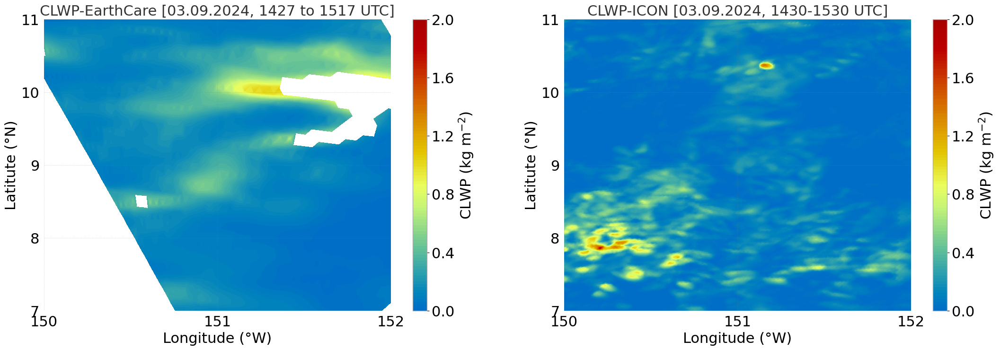

In [49]:


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    # Access the 'Geophysical Data' dataset
    geophysical_data = f['Geophysical Data']
    lat = f['Latitude of Observation Point']
    lon = f['Longitude of Observation Point']
    pix = f['Pixel Data Quality']
    pos = f['Position in Orbit']
    tim = f['Scan Time']
    # Print the shape and data type of the dataset
    print(f"Shape of 'Geophysical Data': {geophysical_data.shape}")
    print(f"Data type of 'Geophysical Data': {geophysical_data.dtype}")
    print(f"Shape of 'lat Data': {lat.shape}")
    print(f"Shape of 'lon Data': {lon.shape}")
    print(f"Shape of 'pix Data': {pix.shape}")
    print(f"Shape of 'pos Data': {pos.shape}")
    print(f"Shape of 'tim Data': {tim.shape}")
    print(tim)
    # To view the data itself, you can load it into memory
    lon_obs = lon[:]
    lat_obs = lat[:]
    lwp_1427 = geophysical_data[:]
    time_obs = tim[:]
    #print(data)


lwp_1427 = lwp_1427[:,:,0]


lwp_1427 = lwp_1427.astype(np.float32)
time_obs = time_obs.astype(np.float32)
lon_obs = lon_obs.astype(np.float32)
lat_obs = lat_obs.astype(np.float32)

time_hr_1427 = np.linspace(14.27,15.17,1980)
time_hr_icon = np.linspace(0,20,41)

lon_min, lon_max = -32, -28
lat_min, lat_max = 7, 11

mask = (
    (lon_obs >= lon_min) & (lon_obs <= lon_max) &
    (lat_obs >= lat_min) & (lat_obs <= lat_max)
)

#lwp_0345 = lwp_0345[mask]

#time_box = time_obs(mask)
rows, cols = np.where(mask)
if rows.size > 0 and cols.size > 0:
    row_min, row_max = rows.min(), rows.max()
    col_min, col_max = cols.min(), cols.max()
    lwp_box = lwp_1427[row_min:row_max+1, col_min:col_max+1]
    lon_box = lon_obs[row_min:row_max+1, col_min:col_max+1]
    lat_box = lat_obs[row_min:row_max+1, col_min:col_max+1]
else:
    print("No data in the specified region.")


lwp_1427[lwp_1427 < 0.] = np.nan

#print(time_hr_0345)
#print(np.nanmin(time_obs), np.nanmax(time_obs))
#print(np.max(avg_lwp_obs), np.min(avg_lwp_obs))
#plt.plot(time_hr_0345, 1.e-3*avg_lwp_0345)
#plt.plot(time_hr_icon, ds_4sip.clwp_kgperm2.mean(dim=('ncells')))


###################################
clwp_4sip = ds_4sip.clwp_kgperm2.isel(time=slice(8, 9)).mean(dim='time')
ln_clwp_4sip = np.log(clwp_4sip + 1e-10).T # a small offset value 1.e-10 (cloud-free region) is added to avoid non-finite overflow
#ln_clwp_4sip = np.log(clwp_4sip).T

#clwp_4sip = ds_4sip.clwp_kgperm2.isel(time=slice(0, 8)).mean(dim='time')
#clwp_4sip = clwp_4sip.where(clwp_4sip > 0)  # Mask non-positive values
#ln_clwp_4sip = np.log(clwp_4sip).T

colors = ['white', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'goldenrod', 
          'darkorange', 'red', 'firebrick', 'maroon', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)

cmap='turbo'
lnwdth = 3;
fontsize = 22;
lev = np.linspace(0, 2, 100)
#lev = np.linspace(-5, 1, 200)
plt.figure(figsize=(26, 8))

plt.subplot(1,2,1)
contour=plt.contourf(180.+lon_box, lat_box, 1.e-3*lwp_box, levels=lev, cmap='HomeyerRainbow')
#contours = plt.contour(180.+lon_box, lat_box, 1.e-3*lwp_box, levels=lev, colors='white', linestyles='--', linewidths=1)
#plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.2f')

colorbar = plt.colorbar(contour, ticks=[0, 0.4, 0.8, 1.2, 1.6, 2.0],label='CLWP (kg m$^{-2}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='CLWP (kg m$^{-2}$)', size=fontsize)

plt.xlim([150, 152]); 
plt.ylim([7, 11]); 
plt.xticks([150, 151, 152], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('CLWP-EarthCare [03.09.2024, 1427 to 1517 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)


plt.subplot(1,2,2)
contour=plt.tricontourf(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
                        ds_4sip.clwp_kgperm2.isel(time=slice(29, 31)).mean(dim=('time')).T,  levels=lev, cmap='HomeyerRainbow')
#contour=plt.tricontourf(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
#                        ln_clwp_4sip,  levels=lev, cmap=cmap)

#contours = plt.tricontour(180.+np.degrees(ds_4sip.clon), np.degrees(ds_4sip.clat), 
#                               ds_4sip.clwp_kgperm2.mean(dim=('time')).T, levels=lev, colors='white', 
#                               linestyles='--', linewidths=1)
#plt.clabel(contours, inline=True, fontsize=fontsize-4, fmt='%1.2f')

#colorbar = plt.colorbar(contour, ticks=[-5, -4, -3, -2, -1, 0, 1],label='CLWP (kg m$^{-2}$)')
colorbar = plt.colorbar(contour, ticks=[0, 0.4, 0.8, 1.2, 1.6, 2], label='CLWP (kg m$^{-2}$)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='CLWP (kg m$^{-2}$)', size=fontsize)
plt.xlim([150, 152]); 
plt.ylim([7, 11]); 
plt.xticks([150, 151, 152], fontsize=fontsize)
plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('CLWP-ICON [03.09.2024, 1430-1530 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()
###################################


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    for key in scan_time.attrs.keys():
        print(f"{key}: {scan_time.attrs[key]}")
    
# Extract LWP data and convert to float32
lwp_0345 = geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243)
lwp_0345[lwp_0345 < 0.] = np.nan

unix_seconds = tim_0345[0]
dt = datetime(1970, 1, 1, tzinfo=timezone.utc) + timedelta(seconds=float(unix_seconds))
print(dt)

time_hr_0345 = np.linspace(3.45, 4.34, 1976)
start_time = datetime(2024, 9, 3, 3, 45, 0)

time_ec0345 = np.array([start_time + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

indices_i, indices_j = np.where(mask_orc)
time_ec_orc = tim_0345[indices_j]

lwp_ec_orc = np.ma.masked_where(~mask_orc, lwp_0345)

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]
    lat_1427 = f['Latitude of Observation Point'][:]
    lon_1427 = f['Longitude of Observation Point'][:]
    tim_1427 = f['Scan Time'][:]

# Extract LWP data and convert to float32
lwp_1427 = geophysical_data[:, :, 0].astype(np.float32)


time_hr_1427 = np.linspace(14.27, 15.17, 1980)

# Define region boundaries
lon_min, lon_max = -32, -28
lat_min, lat_max = 7, 11

# Create a mask for the region of interest
mask = (
    (lon_obs >= lon_min) & (lon_obs <= lon_max) &
    (lat_obs >= lat_min) & (lat_obs <= lat_max)
)

# Apply the mask to identify valid pixels in the region
region_indices = np.where(mask)

lwp_1427[lwp_1427 < 0.] = np.nan
lwp_0345[lwp_0345 < 0.] = np.nan

# Extract LWP values for the region and calculate average over spatial dimensions for each time step
avg_lwp_0345 = []
for t in range(lwp_0345.shape[0]):  # Loop over time steps
    lwp_region = lwp_0345[t][region_indices[1]]  # Get LWP values for the region at time t
    avg_lwp_0345.append(np.nanmean(lwp_region))

avg_lwp_0345 = np.array(avg_lwp_0345)


avg_lwp_1427 = []
for t in range(lwp_1427.shape[0]):  # Loop over time steps
    lwp_region = lwp_1427[t][region_indices[1]]  # Get LWP values for the region at time t
    avg_lwp_1427.append(np.nanmean(lwp_region))  # Calculate average, ignoring NaNs

avg_lwp_1427 = np.array(avg_lwp_1427)

# Plot the results
#plt.figure(figsize=(10, 6))
#plt.plot(time_hr_0345, 1.e-3*avg_lwp_0345, label='LWP [03:45 - 04:34 UTC]')
#plt.plot(time_hr_1427, 1.e-3*avg_lwp_1427, label='LWP [14:27 - 15:17 UTC]')
#plt.xlabel('Time (hours)')
#plt.ylabel('Average LWP (kg m$^{-2}$)')
#plt.title('Average Liquid Water Path Over Region')
#plt.grid(True)
#plt.legend()
#plt.show()


SCALE FACTOR: [1.]
UNIT: [b'sec']
2001-09-03 03:45:17.114000+00:00


In [115]:

print(ds_4sip.clwp_kgperm2.max().values)

13.958891


In [28]:
ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['clwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['ciwp_kgperm2'] = (ds_4sip.qi*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')
ds_4sip['rwp_kgperm2'] = (ds_4sip.qr*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip = ds_4sip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip = ds_4sip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip = ds_4sip.rwp_kgperm2.mean('ncells')


ds_4sip_hfreq['dz'] = ds_4sip_hfreq.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip_hfreq['clwp_kgperm2'] = (ds_4sip_hfreq.qc*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['ciwp_kgperm2'] = (ds_4sip_hfreq.qi*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['rwp_kgperm2'] = (ds_4sip_hfreq.qr*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip_hf = ds_4sip_hfreq.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip_hf = ds_4sip_hfreq.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip_hf = ds_4sip_hfreq.rwp_kgperm2.mean('ncells')

ds_nosip['dz'] = ds_nosip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_nosip['clwp_kgperm2'] = (ds_nosip.qc*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['ciwp_kgperm2'] = (ds_nosip.qi*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')
ds_nosip['rwp_kgperm2'] = (ds_nosip.qr*ds_nosip.rho*(-1.*ds_nosip.dz)).sum(dim='height')

avg_clwp_kgperm2_nosip = ds_nosip.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_nosip = ds_nosip.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_nosip = ds_nosip.rwp_kgperm2.mean('ncells')

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_0345[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec0345 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc0345 = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc0345)
time_ec_orc = tim_0345[indices_j]

# Longitude & Latitude
lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


In [30]:

import numpy as np
import matplotlib.pyplot as plt
import h5py



file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_1427 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_1427[lwp_1427 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_1427 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_1427[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1427 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_1427])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc1427 = (lon_1427 >= lon_min) & (lon_1427 <= lon_max) & (lat_1427 >= lat_min) & (lat_1427 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec1427 is enough for the selected region
indices_i, indices_j = np.where(mask_orc1427)
time_ec_orc = tim_1427[indices_j]

# Longitude & Latitude
lon_ec_orc = np.ma.masked_where(~mask_orc1427, lon_1427)
lat_ec_orc = np.ma.masked_where(~mask_orc1427, lat_1427)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc1427 = np.ma.masked_where(~mask_orc1427, lwp_1427)





SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


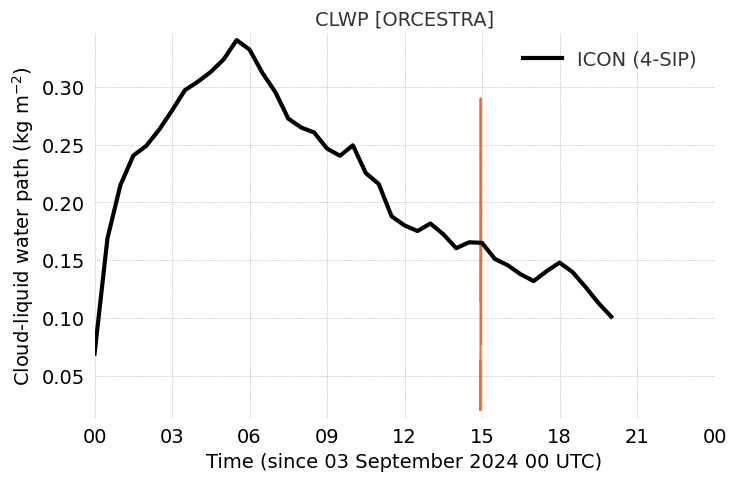

In [22]:
lnwdth=3
fontsize=14

plt.figure(figsize=(8, 5))

plt.plot(time_ec0345, np.nanmean(lwp_ec_orc0345, axis=1))
plt.plot(time_ec1427, np.nanmean(lwp_ec_orc1427, axis=1))
plt.plot(ds_4sip.time, ds_4sip.clwp_kgperm2.mean('ncells'), 'k-', linewidth=lnwdth, label='ICON (4-SIP)')
plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(0,0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Cloud-liquid water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('CLWP [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()

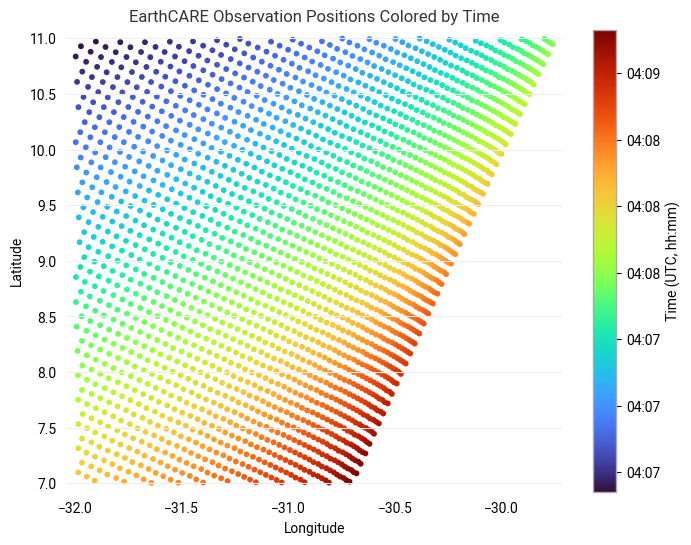

In [22]:
indices_i, indices_j = np.where(mask_orc0345)
lon_points = lon_0345[indices_i, indices_j]
lat_points = lat_0345[indices_i, indices_j]
time_points = time_ec0345[indices_i]  # or use time_region if you have it

c = mdates.date2num(time_points)

fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(lon_points, lat_points, c=c, cmap='turbo', s=10)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax)

# Custom formatter: show hh:mm
def time_formatter(x, pos):
    dt = mdates.num2date(x)
    return dt.strftime('%H:%M')

cbar.ax.yaxis.set_major_formatter(FuncFormatter(time_formatter))
cbar.set_label('Time (UTC, hh:mm)')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('EarthCARE Observation Positions Colored by Time')
plt.show()


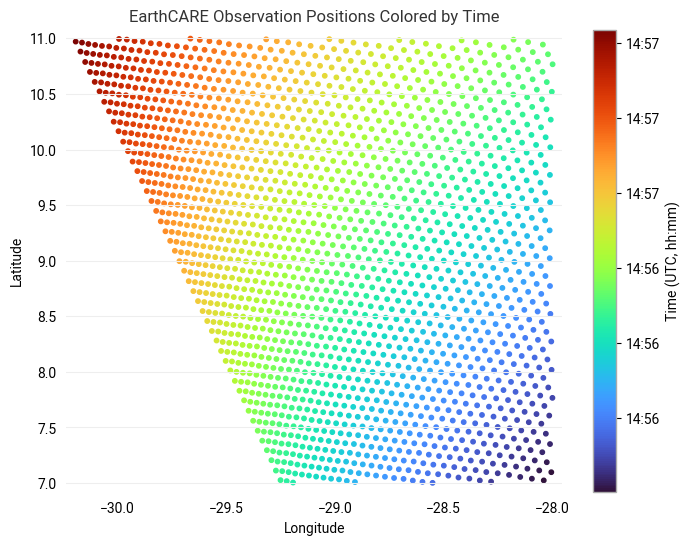

In [23]:
indices_i, indices_j = np.where(mask_orc1427)
lon_points = lon_1427[indices_i, indices_j]
lat_points = lat_1427[indices_i, indices_j]
time_points = time_ec1427[indices_i]  # or use time_region if you have it

c = mdates.date2num(time_points)

fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(lon_points, lat_points, c=c, cmap='turbo', s=10)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax)

# Custom formatter: show hh:mm
def time_formatter(x, pos):
    dt = mdates.num2date(x)
    return dt.strftime('%H:%M')

cbar.ax.yaxis.set_major_formatter(FuncFormatter(time_formatter))
cbar.set_label('Time (UTC, hh:mm)')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('EarthCARE Observation Positions Colored by Time')
plt.show()


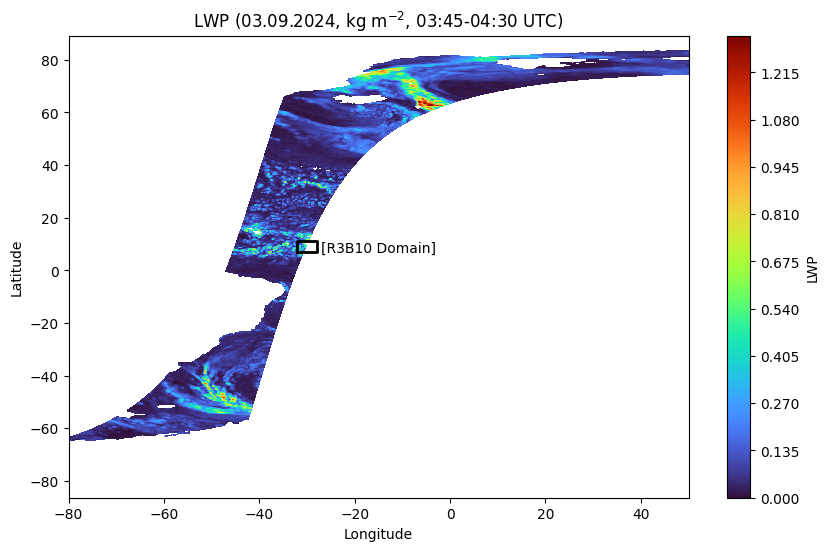

In [136]:

lon_dom = [-28., -32.];
lat_dom = [7., 11.];
  

# longitudes should be ordered correctly for a rectangle:
lon_min, lon_max = sorted(lon_dom)
lat_min, lat_max = sorted(lat_dom)

# Corners of the rectangle
lon_box = [lon_min, lon_max, lon_max, lon_min, lon_min]
lat_box = [lat_min, lat_min, lat_max, lat_max, lat_min]

plt.figure(figsize=(10,6))
plt.contourf(lon_0345, lat_0345, lwp_0345, levels=300, shading='auto', cmap='turbo')
plt.plot(lon_box, lat_box, 'k-', linewidth=2)
plt.text(-15., 7, "[R3B10 Domain]", fontsize=10, ha='center', color='k')
plt.xlim(-80,50)
#plt.ylim(7,11)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('LWP (03.09.2024, kg m$^{-2}$, 03:45-04:30 UTC)')
plt.colorbar(label='LWP')
plt.show()


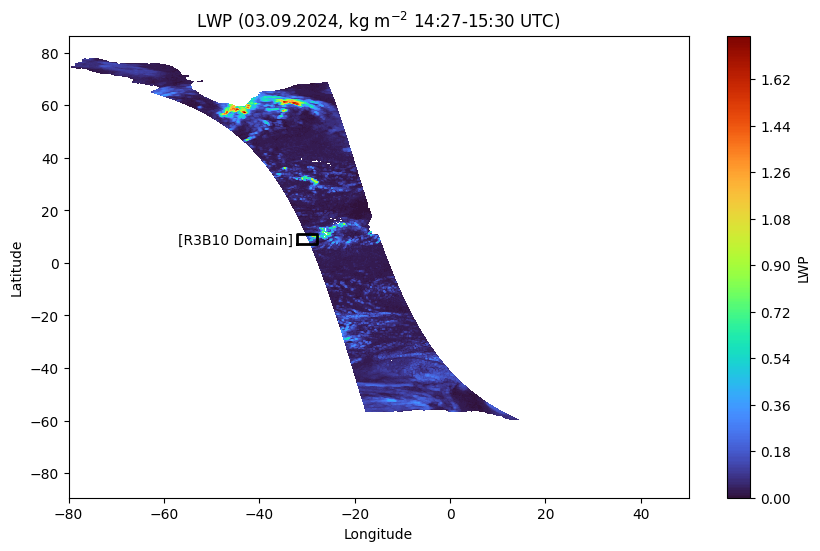

In [137]:

lon_dom = [-28., -32.];
lat_dom = [7., 11.];
  

# longitudes should be ordered correctly for a rectangle:
lon_min, lon_max = sorted(lon_dom)
lat_min, lat_max = sorted(lat_dom)

# Corners of the rectangle
lon_box = [lon_min, lon_max, lon_max, lon_min, lon_min]
lat_box = [lat_min, lat_min, lat_max, lat_max, lat_min]

plt.figure(figsize=(10,6))
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=300, shading='auto', cmap='turbo')
plt.plot(lon_box, lat_box, 'k-', linewidth=2)
plt.text(-45., 7, "[R3B10 Domain]", fontsize=10, ha='center', color='k')
plt.xlim(-80,50)
#plt.ylim(7,11)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('LWP (03.09.2024, kg m$^{-2}$ 14:27-15:30 UTC)')
plt.colorbar(label='LWP')
plt.show()


In [36]:
import matplotlib.pyplot as plt
print(plt.rcParams['axes.grid'])

True


## With 30 min ICON output

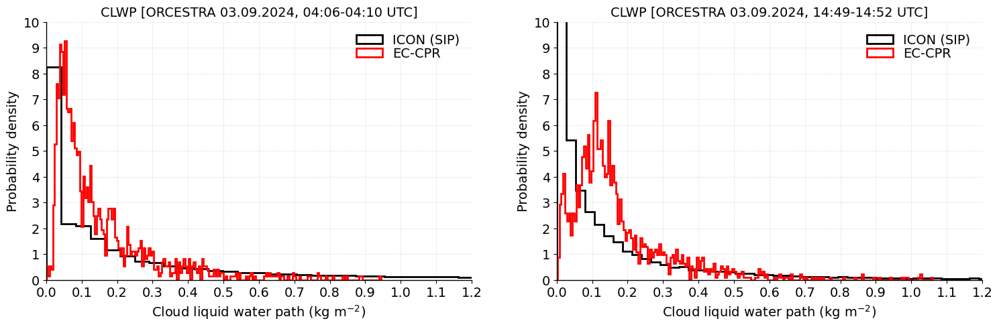

In [31]:

## Select ICON-time corresponding to EarthCare

ds_icon = ds_4sip.sel(time=('2024-09-03T04:00:00.000000000'))

clwp_4sip0400 = ds_4sip.clwp_kgperm2.sel(time='2024-09-03T04:00:00.000000000').values
clwp_nosip0400 = ds_nosip.clwp_kgperm2.sel(time='2024-09-03T04:00:00.000000000').values
clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]

clwp_4sip1500 = ds_4sip.clwp_kgperm2.sel(time='2024-09-03T15:00:00.000000000').values
clwp_nosip1500 = ds_nosip.clwp_kgperm2.sel(time='2024-09-03T15:00:00.000000000').values
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

#clwp_4sip0400[clwp_4sip0400 <= 0.] = np.nan
#clwp_nosip0400[clwp_nosip0400 <= 0.] = np.nan
clwp_4sip1500[clwp_4sip1500 <= 0.] = np.nan
clwp_nosip1500[clwp_nosip1500 <= 0.] = np.nan


fnt = 14;
ln = 2;
plt.figure(figsize=(18,5))
plt.style.use('default')

plt.subplot(1,2,1)
#plt.hist(clwp_4sip0400, bins=40, density=True, alpha=1., label='ICON')
#plt.hist(1.e-3*clwp_ec0400, bins=40, density=True, alpha=1., label='EarthCARE')
plt.hist(clwp_4sip0400, bins=200, density=True, histtype='step', edgecolor='black', linewidth=ln, label='ICON (SIP)')
#plt.hist(clwp_nosip0400, bins=200, density=True, histtype='step', edgecolor='blue', linewidth=ln, label='ICON (No-SIP)')
plt.hist(clwp_ec0400, bins=200, density=True, histtype='step', edgecolor='red', linewidth=ln, label='EC-CPR')

plt.xlim(0, 1.2); 
plt.ylim(0, 10); 
plt.xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Probability density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=ln, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
#plt.show()

plt.subplot(1,2,2)

#plt.hist(clwp_4sip0400, bins=40, density=True, alpha=1., label='ICON')
#plt.hist(1.e-3*clwp_ec0400, bins=40, density=True, alpha=1., label='EarthCARE')
plt.hist(clwp_4sip1500, bins=200, density=True, histtype='step', edgecolor='black', linewidth=ln, label='ICON (SIP)')
#plt.hist(clwp_nosip1500, bins=200, density=True, histtype='step', edgecolor='blue', linewidth=ln, label='ICON (No-SIP)')
plt.hist(clwp_ec1500, bins=200, density=True, histtype='step', edgecolor='red', linewidth=ln, label='EC-CPR')

#plt.yscale('log')
plt.xlim(0, 1.2); 
plt.ylim(0, 10); 
plt.xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Probability density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()



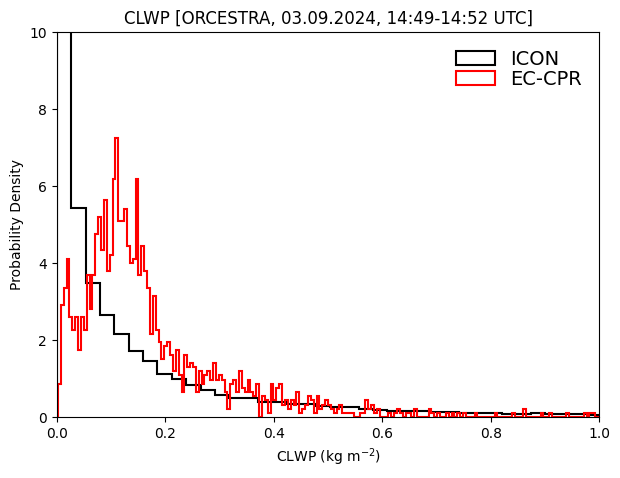

In [32]:

## Select ICON-time corresponding to EarthCare

ds_icon = ds_4sip.sel(time=('2024-09-03T15:00:00.000000000'))

clwp_4sip1500 = ds_icon.clwp_kgperm2.values
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]
#clwp_ec[clwp_ec < 0.] = np.nan

clwp_4sip1500[clwp_4sip1500 <= 0] = np.nan
plt.figure(figsize=(7,5))
#plt.hist(clwp_4sip1500, bins=40, density=True, alpha=1., label='ICON')
#plt.hist(1.e-3*clwp_ec1500, bins=40, density=True, alpha=1., label='EarthCARE')
plt.hist(clwp_4sip1500, bins=200, density=True, histtype='step', edgecolor='black', linewidth=1.5, label='ICON')
plt.hist(clwp_ec1500, bins=200, density=True, histtype='step', edgecolor='red', linewidth=1.5, label='EC-CPR')
plt.xlim(0,1.0)
plt.ylim(0,10)
#plt.yscale('log')
plt.xlabel('CLWP (kg m$^{-2}$)')
plt.ylabel('Probability Density')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.title('CLWP [ORCESTRA, 03.09.2024, 14:49-14:52 UTC]')
plt.show()

## With 2 min ICON output

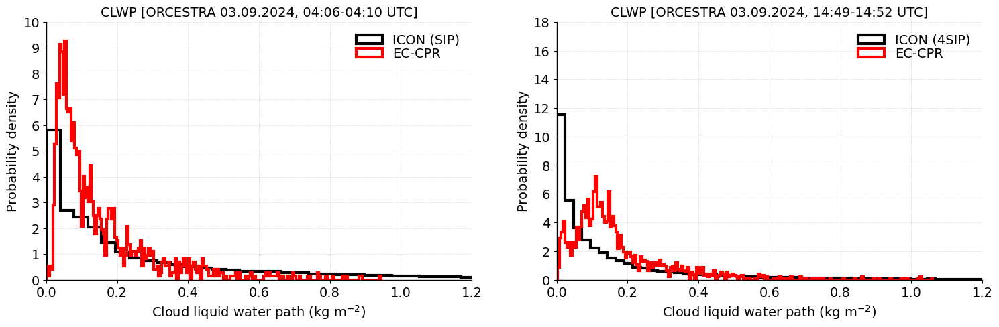

In [33]:

## Select ICON-time corresponding to EarthCare

ds_icon_hfreq = ds_4sip_hfreq.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000'))

clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]



fnt = 14;
ln = 3;
plt.figure(figsize=(18,5))
plt.style.use('default')

plt.subplot(1,2,1)
plt.hist(clwp_4sip0400_hf, bins=200, density=True, histtype='step', edgecolor='k', linewidth=ln, label='ICON (SIP)')
plt.hist(clwp_ec0400, bins=200, density=True, histtype='step', edgecolor='r', linewidth=ln, label='EC-CPR')

plt.xlim(0, 1.2); 
plt.ylim(0, 10); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Probability density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
#plt.show()

plt.subplot(1,2,2)

plt.hist(clwp_4sip1500_hf, bins=200, density=True, histtype='step', edgecolor='k', linewidth=ln, label='ICON (4SIP)')
plt.hist(clwp_ec1500, bins=200, density=True, histtype='step', edgecolor='r', linewidth=ln, label='EC-CPR')

#plt.yscale('log')
plt.xlim(0, 1.); 
plt.ylim(0, 18); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16, 18], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Probability density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()



## Kernel Density Estimate (KDE) plot
##### KDE plots provide a smoothed estimate of the data distribution, making it easier to compare the overall 
##### shapes and modes of the two datasets. Libraries like seaborn or matplotlib can generate interactive KDE plots. 
##### Overlaying KDEs for both datasets can highlight subtle differences or similarities in their distributions

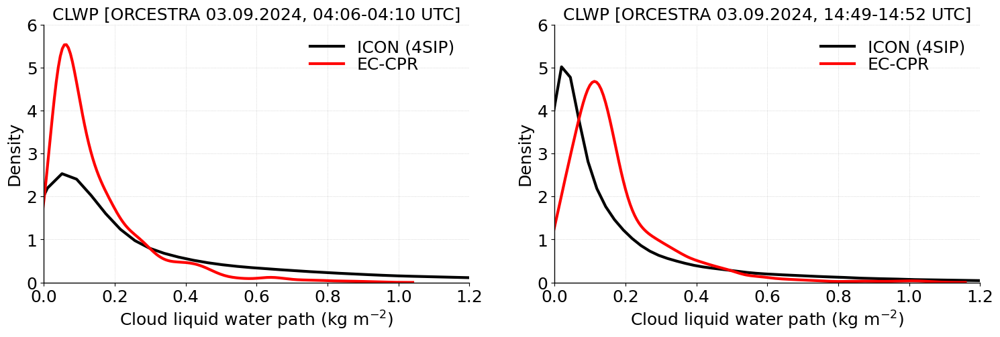

In [43]:
import seaborn as sns

clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

fnt = 18;
ln = 3;
plt.figure(figsize=(18,5))
plt.style.use('default')

plt.subplot(1,2,1)
sns.kdeplot(clwp_4sip0400_hf, color='k', linewidth=ln, label='ICON (4SIP)')
sns.kdeplot(clwp_ec0400, color='r', linewidth=ln, label='EC-CPR')

plt.xlim(0, 1.2); 
plt.ylim(0, 6); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
#plt.show()

plt.subplot(1,2,2)

sns.kdeplot(clwp_4sip1500_hf, color='k', linewidth=ln, label='ICON (4SIP)')
sns.kdeplot(clwp_ec1500, color='r', linewidth=ln, label='EC-CPR')

#plt.yscale('log')
plt.xlim(0, 1.2); 
plt.ylim(0, 6); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()

## Cumulative Distribution Function (CDF) Plots
#### Plotting the empirical CDFs for both datasets allows you to compare their distributions across all quantiles. 
#### This is particularly useful for assessing differences in the tails or median of the distributions.


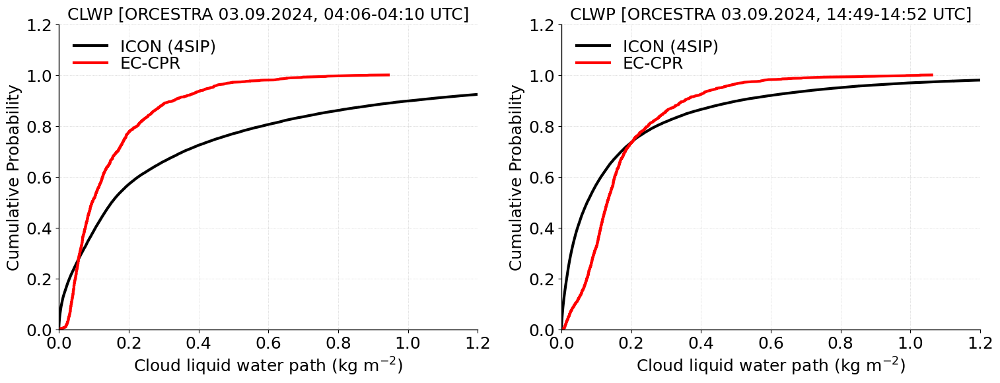

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

fnt = 18;
ln = 3;
# CDF Plot
plt.figure(figsize=(18, 6))
plt.subplot(1,2,1)
for data, label, color in [
    (clwp_4sip0400_hf, 'ICON (4SIP)', 'k'),
    (clwp_ec0400, 'EC-CPR', 'r')
]:
    sorted_data = np.sort(data[~np.isnan(data)])
    cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
    plt.plot(sorted_data, cdf, label=label, color=color, linewidth=ln)

plt.xlim(0, 1.2); 
plt.ylim(0, 1.2); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Cumulative Probability', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)
#plt.title('CDF Comparison of CLWP Distributions')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)


plt.subplot(1,2,2)
for data, label, color in [
    (clwp_4sip1500_hf, 'ICON (4SIP)', 'k'),
    (clwp_ec1500, 'EC-CPR', 'r')
]:
    sorted_data = np.sort(data[~np.isnan(data)])
    cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
    plt.plot(sorted_data, cdf, label=label, color=color, linewidth=ln)

plt.xlim(0, 1.2); 
plt.ylim(0, 1.2); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Cumulative Probability', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)
#plt.title('CDF Comparison of CLWP Distributions')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()


## Box plots
##### Boxplots summarize the median, quartiles, and outliers, making it easy to compare central tendency and spread. 

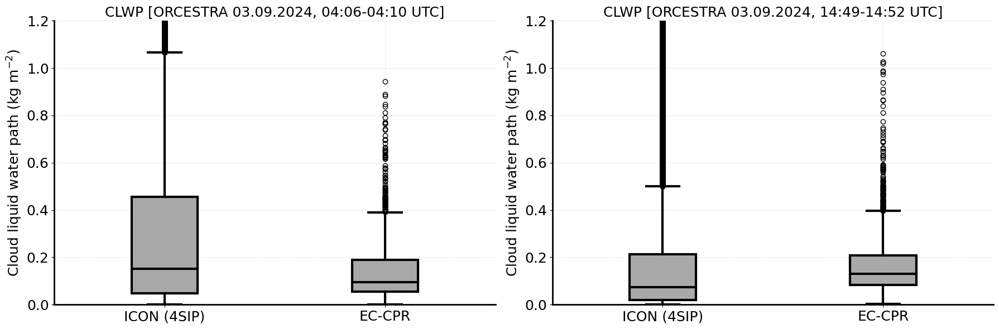

In [36]:

import matplotlib.pyplot as plt


clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

# Prepare data as a list of arrays
data_0400 = [clwp_4sip0400_hf[~np.isnan(clwp_4sip0400_hf)], clwp_ec0400[~np.isnan(clwp_ec0400)]]
data_1500 = [clwp_4sip1500_hf[~np.isnan(clwp_4sip1500_hf)], clwp_ec1500[~np.isnan(clwp_ec1500)]]

labels = ['ICON (4SIP)', 'EC-CPR']


fnt = 18;
ln = 3;
width=0.3;
alpha1=0.4;
alpha1=1.0;
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))

# Boxplot
#axes[0].boxplot(data_0400, vert=True, patch_artist=True, color='k',labels=labels)
axes[0].boxplot(data_0400, vert=True, patch_artist=True, widths=width,
                boxprops=dict(facecolor='darkgrey', edgecolor='black', linewidth=ln, alpha=alpha1),
                medianprops=dict(color='black', linewidth=ln),
                whiskerprops=dict(linewidth=ln, color='black', alpha=alpha1),
                capprops=dict(linewidth=ln, color='black', alpha=alpha1),
                showfliers=True, labels=labels)

axes[0].set_title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)
axes[0].set_ylabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
 
axes[0].set_ylim(0, 1.2); 
axes[0].tick_params(axis='x', labelsize=fnt); 
axes[0].tick_params(axis='y', labelsize=fnt); 

axes[0].grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['bottom'].set_linewidth(2)
axes[0].spines['left'].set_linewidth(2)


axes[1].boxplot(data_1500, vert=True, patch_artist=True, widths=width,
                boxprops=dict(facecolor='darkgrey', edgecolor='black', linewidth=ln, alpha=alpha1),
                medianprops=dict(color='black', linewidth=ln),
                whiskerprops=dict(linewidth=ln, color='black', alpha=alpha1),
                capprops=dict(linewidth=ln, color='black', alpha=alpha1),
                showfliers=True, labels=labels)

axes[1].set_title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)
axes[1].set_ylabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
 
axes[1].set_ylim(0, 1.2); 
axes[1].tick_params(axis='x', labelsize=fnt); 
axes[1].tick_params(axis='y', labelsize=fnt); 

axes[1].grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['bottom'].set_linewidth(2)
axes[1].spines['left'].set_linewidth(2)


plt.tight_layout()
plt.show()


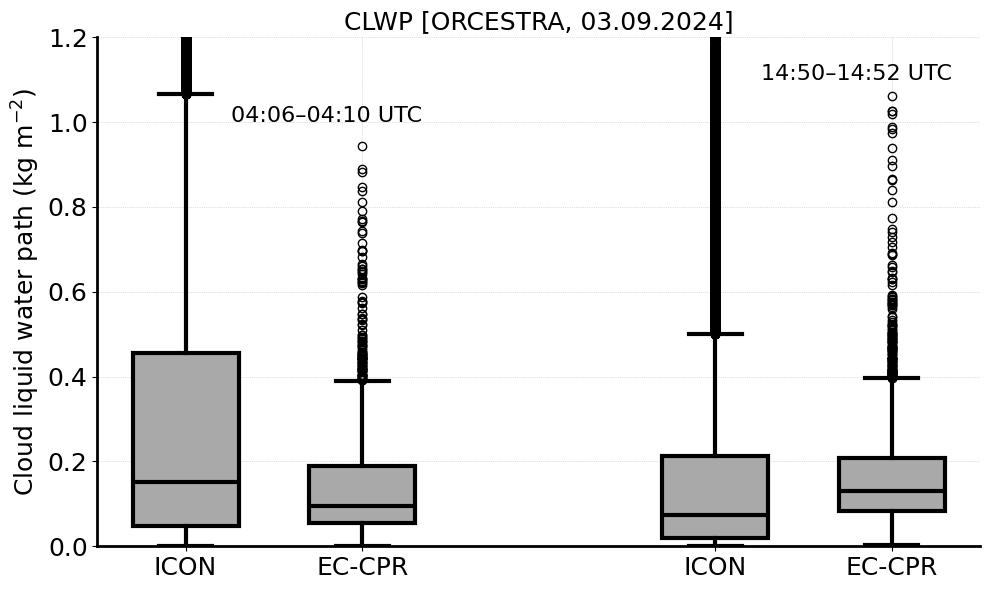

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Filter NaNs
clwp_4sip0400 = clwp_4sip0400_hf[~np.isnan(clwp_4sip0400_hf)]
clwp_ec0400 = clwp_ec0400[~np.isnan(clwp_ec0400)]
clwp_4sip1500 = clwp_4sip1500_hf[~np.isnan(clwp_4sip1500_hf)]
clwp_ec1500 = clwp_ec1500[~np.isnan(clwp_ec1500)]

# Combine all data
all_data = [clwp_4sip0400, clwp_ec0400, clwp_4sip1500, clwp_ec1500]
positions = [1, 2, 4, 5]

labels = ['ICON', 'EC-CPR', 'ICON', 'EC-CPR']

fnt = 18
ln = 3
width = 0.6
alpha1 = 1.0

plt.figure(figsize=(10, 6))
plt.boxplot(all_data, positions=positions, widths=width, patch_artist=True,
            boxprops=dict(facecolor='darkgrey', edgecolor='black', linewidth=ln, alpha=alpha1),
            medianprops=dict(color='black', linewidth=ln),
            whiskerprops=dict(linewidth=ln, color='black', alpha=alpha1),
            capprops=dict(linewidth=ln, color='black', alpha=alpha1),
            showfliers=True)

# Set X-axis labels
plt.xticks(positions, labels, fontsize=fnt)
plt.ylabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylim(0, 1.2)
plt.yticks(fontsize=fnt)

# Add time annotations
plt.text(1.8, 1.0, '04:06–04:10 UTC', ha='center', fontsize=fnt-2)#, weight='bold')
plt.text(4.8, 1.1, '14:50–14:52 UTC', ha='center', fontsize=fnt-2)#, weight='bold')

# Styling
plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.title('CLWP [ORCESTRA, 03.09.2024]', fontsize=fnt)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)

plt.tight_layout()
plt.show()



lwc1_10km_data_Attributes:
  _FillValue: [9.96921e+36]
  longname: b'Cloud Water Content 1(10km)'
  units: b'g/m^3'
  valid_range: [ 0. 10.]

lwc1_1km_data_Attributes:
  _FillValue: [9.96921e+36]
  longname: b'Cloud Water Content 1(1km)'
  units: b'g/m^3'
  valid_range: [ 0. 10.]

lon_ec_data_Attributes:
  _FillValue: [9.96920997e+36]
  long_name: b'Longitude'
  units: b'degree_east'
  valid_range: [-180.  180.]
[7.78694728e+08 7.78694728e+08 7.78694728e+08 ... 7.78695422e+08
 7.78695423e+08 7.78695423e+08]


NameError: name 'timezone' is not defined

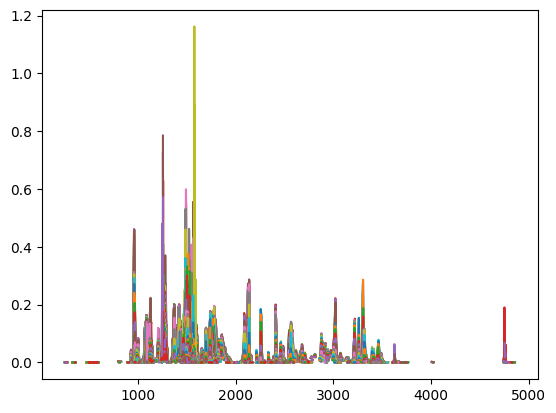

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare_new/ECA_J_CPR_CLP_2AS_20240903T1605_20240903T1616_01520E_vBb.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    time_data = f['/ScienceData/Geo/time'][:]
    lwc1_10km_data = f['/ScienceData/Data/cloud_water_content1_10km']      # 2D (4863/Inf, 206)                        
    lwc1_1km_data = f['/ScienceData/Data/cloud_water_content1_1km']      # 2D (4863/Inf, 206)   
    lwc2_10km_data = f['/ScienceData/Data/cloud_water_content2_10km']      # 2D (4863/Inf, 206)                        
    lwc2_1km_data = f['/ScienceData/Data/cloud_water_content2_1km']      # 2D (4863/Inf, 206) 
    lwc_10km_data = f['/ScienceData/Data/cloud_water_content_10km']      # 2D (4863/Inf, 206)                        
    lwc_1km_data = f['/ScienceData/Data/cloud_water_content_1km']      # 2D (4863/Inf, 206)  
    lwc_10km_uncert_data = f['/ScienceData/Data/cloud_water_content_10km_uncertainty']      # 2D (4863/Inf, 206)                        
    lwc_1km_uncert_data = f['/ScienceData/Data/cloud_water_content_1km_uncertainty']      # 2D (4863/Inf, 206)                    
    
    lon_ec_data = f['/ScienceData/Geo/longitude']        
    lat_ec_data = f['/ScienceData/Geo/latitude']
    
    #slope_time = time_data.attrs['Slope'][0]
    #slope_cld = lwc1_10km_data.attrs['Slope'][0]
    #offset = lwc1_10km_data.attrs['Offset'][0]
    #error_dn = lwc1_10km_data.attrs['Error_DN'][0]
    
    #print("Shape of CLER_W:", cler_wat_data.shape)
    #print("Dim of CLER_W:", cler_wat_data.ndim)
    #print("Dim of CLER_W:", cler_wat_data.dtype)
    
    lwc1_10km = lwc1_10km_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    lon_ec_1605 = f['/ScienceData/Geo/longitude'][:] 
    lat_ec_1605 =  f['/ScienceData/Geo/latitude'][:]
    #ice_effrad_DN = cler_ice_data[:]
    #liq_opt_DN = clot_wat_data[:]
    #ice_opt_DN = clot_ice_data[:]
    #obs_time_DN = time_data[:]
    
    # Attributes
    print("\nlwc1_10km_data_Attributes:")
    for key, val in lwc1_10km_data.attrs.items():
        print(f"  {key}: {val}")
    print("\nlwc1_1km_data_Attributes:")
    for key, val in lwc1_1km_data.attrs.items():
        print(f"  {key}: {val}")
    print("\nlon_ec_data_Attributes:")
    for key, val in lon_ec_data.attrs.items():
        print(f"  {key}: {val}")
    #print("\nCLOT_ICE_Attributes:")
    #for key, val in clot_ice_data.attrs.items():
    #    print(f"  {key}: {val}")
    #print("\nTIME_Attributes:")
    #for key, val in time_data.attrs.items():
    #    print(f"  {key}: {val}")

mask_lwc_10km = (lwc1_10km < 10.)
#lwc1_10km[(lwc1_10km > 10.) & (lwc1_10km < 0.)] = np.nan 
lwc1_10km[(lwc1_10km == 9.96921e+36)] = np.nan 
lwc1_10km[lwc1_10km < 0.] = np.nan 

print(time_data)

plt.style.use('default')
plt.plot(lwc1_10km);

## Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
## Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = time_data[0]
epoch_ec = datetime(2000, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1605 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_data])

print(time_ec1605)
### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc1605 = (lon_ec_1605 >= lon_min) & (lon_ec_1605 <= lon_max) & (lat_ec_1605 >= lat_min) & (lat_ec_1605 <= lat_max)

## Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
##time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc1605)
time_ec_orc = time_ec1605[indices_j]

# Longitude & Latitude
#lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
#lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

##unix_seconds = time_ec_orc[0]
##time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

## Get lwp
#lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




## Cloud top

Shape of CLER_W: (1200, 1200)
Dim of CLER_W: 2
Dim of CLER_W: uint16

EFFRAD_LIQ_Attributes:
  Data_description: [b'Liquid Water Cloud Effective Radius | VAL=DN*Slope+Offset']
  Error_DN: [65535]
  Mask_for_statistics: [512]
  Maximum_valid_DN: [6200]
  Minimum_valid_DN: [0]
  Offset: [0.]
  Slope: [0.01]
  Spatial_resolution: [0.00833333]
  Spatial_resolution_unit: [b'degree']
  Unit: [b'micro meter']
(1200, 1200)
[[      nan       nan       nan ... 11.959001 11.959001 11.959001]
 [      nan       nan       nan ... 11.959001 11.959001 11.959001]
 [      nan       nan       nan ... 11.959001 11.959001 11.959001]
 ...
 [12.011001 12.011001 12.011001 ... 12.004001 12.004001 12.004001]
 [12.011001 12.011001 12.011001 ... 12.004001 12.004001 12.004001]
 [12.011001 12.011001 12.011001 ... 12.005    12.005    12.005   ]]


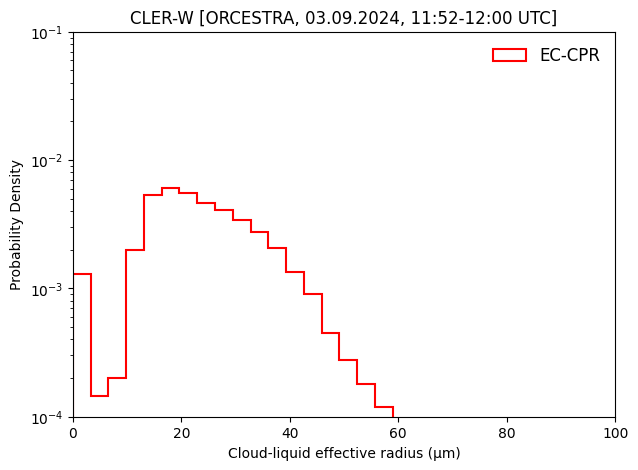

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/eff_rad_ctt/GC1SG1_20240903D01D_T0815_L2SG_CLPRK_3000.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    time_data = f['/Geometry_data/Obs_time']#[:]
    cler_wat_data = f['/Image_data/CLER_W']      # 2D (1200,1200)                        
    
    cler_ice_data = f['/Image_data/CLER_I']        
    clot_wat_data = f['/Image_data/CLOT_W']
    clot_ice_data = f['/Image_data/CLOT_I']
    
    slope_time = time_data.attrs['Slope'][0]
    slope_cld = cler_wat_data.attrs['Slope'][0]
    offset = cler_wat_data.attrs['Offset'][0]
    error_dn = cler_wat_data.attrs['Error_DN'][0]
    
    print("Shape of CLER_W:", cler_wat_data.shape)
    print("Dim of CLER_W:", cler_wat_data.ndim)
    print("Dim of CLER_W:", cler_wat_data.dtype)
    
    liq_effrad_DN = cler_wat_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    ice_effrad_DN = cler_ice_data[:]
    liq_opt_DN = clot_wat_data[:]
    ice_opt_DN = clot_ice_data[:]
    obs_time_DN = time_data[:]
    # Attributes
    print("\nEFFRAD_LIQ_Attributes:")
    for key, val in cler_wat_data.attrs.items():
        print(f"  {key}: {val}")
    #print("\nEFFRAD_ICE_Attributes:")
    #for key, val in cler_ice_data.attrs.items():
    #    print(f"  {key}: {val}")
    #print("\nCLOT_WAT_Attributes:")
    #for key, val in clot_wat_data.attrs.items():
    #    print(f"  {key}: {val}")
    #print("\nCLOT_ICE_Attributes:")
    #for key, val in clot_ice_data.attrs.items():
    #    print(f"  {key}: {val}")
    #print("\nTIME_Attributes:")
    #for key, val in time_data.attrs.items():
    #    print(f"  {key}: {val}")
    


# From the data description, the true effective radius can be obtained as true_cler_liq = DN * slope + Offset
# Here, DN = cler_wat_data, slope = 0.01 and Offset is given as 0.

liq_effrad = liq_effrad_DN * slope_cld + offset
ice_effrad = ice_effrad_DN * slope_cld + offset
liq_opt_thick = liq_opt_DN * slope_cld + offset
ice_opt_thick = ice_opt_DN * slope_cld + offset
obs_time = obs_time_DN * slope_time

obs_time[obs_time < 0.] = np.nan
print(liq_effrad.shape)
print(obs_time)
#plt.plot(liq_effrad);

liq_effrad_ec1200 = liq_effrad.ravel()
liq_effrad_ec1200 = liq_effrad_ec1200[~np.isnan(liq_effrad_ec1200)]

ice_effrad_ec1200 = ice_effrad.ravel()
ice_effrad_ec1200 = ice_effrad_ec1200[~np.isnan(ice_effrad_ec1200)]


liq_effrad_ec1200[liq_effrad_ec1200 <= 0] = np.nan

fnt=12;
plt.figure(figsize=(7,5))
#plt.hist(clwp_4sip1500, bins=40, density=True, alpha=1., label='ICON')
#plt.hist(1.e-3*clwp_ec1500, bins=40, density=True, alpha=1., label='EarthCARE')
#plt.hist(clwp_4sip1500, bins=200, density=True, histtype='step', edgecolor='black', linewidth=1.5, label='ICON')
plt.hist(liq_effrad_ec1200, bins=200, density=True, histtype='step', edgecolor='red', linewidth=1.5, label='EC-CPR')
plt.xlim(0,100.0)
plt.yscale('log')
plt.ylim(1.e-4,1.e-1)
plt.xlabel('Cloud-liquid effective radius (µm)')
plt.ylabel('Probability Density')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.title('CLER-W [ORCESTRA, 03.09.2024, 11:52-12:00 UTC]')
plt.show()

In [49]:
print(reff_qc_4sip1200_hf.shape, np.count_nonzero(~np.isnan(reff_qc_4sip1200_hf)))
print(liq_effrad_ec1200.shape, np.count_nonzero(~np.isnan(liq_effrad_ec1200)))


(65, 73960) 1538894
(1440000,) 1440000


(65, 73960) 1590328
(1000,) 1000
(1000,) 1000


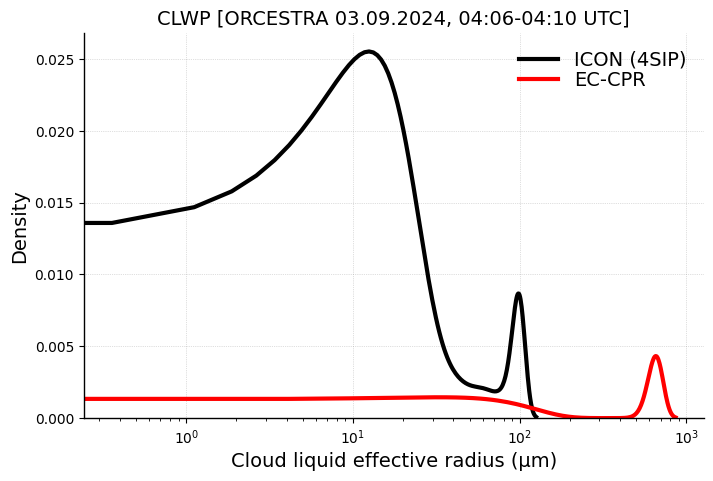

In [69]:


reff_qi_4sip1200_hf = 1.e6*ds_4sip_hfreq.reff_qi.sel(time=slice('2024-09-03T11:52:00.000000000','2024-09-03T12:00:00.000000000')).mean('time').values
reff_qi_4sip1200_hf[reff_qi_4sip1200_hf <= 0.] = np.nan


reff_qi_4sip1200_hf_flat = reff_qi_4sip1200_hf.ravel()
reff_qi_4sip1200_hf_flat = reff_qi_4sip1200_hf_flat[~np.isnan(reff_qi_4sip1200_hf_flat)]

N = 1000  # or fewer if still slow
if reff_qi_4sip1200_hf_flat.size > N:
    reff_qi_4sip1200_hf_flat = np.random.choice(reff_qi_4sip1200_hf_flat, N, replace=False)

N = 10000  # or fewer if still slow
if ice_effrad_ec1200.size > N:
    ice_effrad_ec1200 = np.random.choice(ice_effrad_ec1200, N, replace=False)
    
print(reff_qi_4sip1200_hf.shape, np.count_nonzero(~np.isnan(reff_qi_4sip1200_hf)))
print(reff_qi_4sip1200_hf_flat.shape, np.count_nonzero(~np.isnan(reff_qi_4sip1200_hf_flat)))
print(ice_effrad_ec1200.shape, np.count_nonzero(~np.isnan(ice_effrad_ec1200)))


fnt = 14;
ln = 3;
plt.figure(figsize=(8,5))
plt.style.use('default')
sns.kdeplot(reff_qi_4sip1200_hf_flat, color='k', linewidth=ln, label='ICON (4SIP)')#, bw_adjust=1.5)
sns.kdeplot(ice_effrad_ec1200, color='r', linewidth=ln, label='EC-CPR')
plt.xscale('log')
#plt.xlim(0, 100); 
#plt.ylim(0, 0.01); 
#plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
#plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid effective radius (µm)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

plt.show()

(65, 73960) 1739982
(100000,) 100000
(100000,) 100000


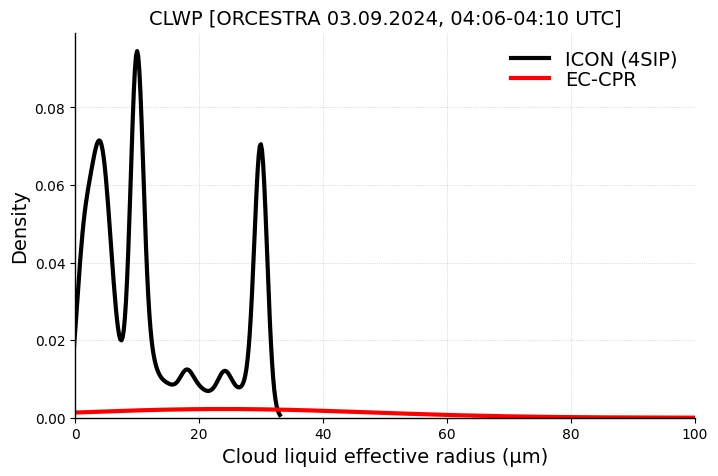

In [61]:


reff_qc_4sip1200_hf = 1.e6*ds_4sip_hfreq.reff_qc.sel(time=slice('2024-09-03T11:52:00.000000000','2024-09-03T12:00:00.000000000')).mean('time').values
reff_qc_4sip1200_hf[reff_qc_4sip1200_hf <= 0.] = np.nan


reff_qc_4sip1200_hf_flat = reff_qc_4sip1200_hf.ravel()
reff_qc_4sip1200_hf_flat = reff_qc_4sip1200_hf_flat[~np.isnan(reff_qc_4sip1200_hf_flat)]

N = 100000  # or fewer if still slow
if reff_qc_4sip1200_hf_flat.size > N:
    reff_qc_4sip1200_hf_flat = np.random.choice(reff_qc_4sip1200_hf_flat, N, replace=False)
if liq_effrad_ec1200.size > N:
    liq_effrad_ec1200 = np.random.choice(liq_effrad_ec1200, N, replace=False)
    
print(reff_qc_4sip1200_hf.shape, np.count_nonzero(~np.isnan(reff_qc_4sip1200_hf)))
print(reff_qc_4sip1200_hf_flat.shape, np.count_nonzero(~np.isnan(reff_qc_4sip1200_hf_flat)))
print(liq_effrad_ec1200.shape, np.count_nonzero(~np.isnan(liq_effrad_ec1200)))


fnt = 14;
ln = 3;
plt.figure(figsize=(8,5))
plt.style.use('default')
sns.kdeplot(reff_qc_4sip1200_hf_flat, color='k', linewidth=ln, label='ICON (4SIP)')#, bw_adjust=1.5)
sns.kdeplot(liq_effrad_ec1200, color='r', linewidth=ln, label='EC-CPR')
plt.xlim(0, 100); 
#plt.ylim(0, 0.01); 
#plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
#plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid effective radius (µm)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

plt.show()

In [ ]:
import seaborn as sns

reff_qc_4sip1200_hf = 1.e6*ds_4sip_hfreq.reff_qc.sel(time=slice('2024-09-03T11:52:00.000000000','2024-09-03T12:00:00.000000000')).mean('time').values
reff_qc_4sip1200_hf[reff_qc_4sip1200_hf <= 0.] = np.nan


reff_qc_4sip1200_hf_flat = reff_qc_4sip1200_hf.ravel()
reff_qc_4sip1200_hf_flat = reff_qc_4sip1200_hf_flat[~np.isnan(reff_qc_4sip1200_hf_flat)]

N = 100000  # or fewer if still slow
if reff_qc_4sip1200_hf_flat.size > N:
    reff_qc_4sip1200_hf_flat = np.random.choice(reff_qc_4sip1200_hf_flat, N, replace=False)
if liq_effrad_ec1200.size > N:
    liq_effrad_ec1200 = np.random.choice(liq_effrad_ec1200, N, replace=False)

if len(reff_qc_4sip0400_hf) > 10000:
    reff_qc_4sip0400_hf = np.random.choice(reff_qc_4sip0400_hf[~np.isnan(reff_qc_4sip0400_hf)], 10000, replace=False)


liq_effrad_ec1200 = liq_effrad.ravel()
liq_effrad_ec1200 = liq_effrad_ec1200[~np.isnan(liq_effrad_ec1200)]

fnt = 14;
ln = 3;
plt.figure(figsize=(8,5))
plt.style.use('default')

sns.kdeplot(reff_qc_4sip1200_hf_flat, color='k', linewidth=ln, label='ICON (4SIP)')#, bw_adjust=1.5)
sns.kdeplot(liq_effrad_ec1200, color='r', linewidth=ln, label='EC-CPR')

plt.xlim(0, 100); 
#plt.ylim(0, 0.01); 
#plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
#plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid effective radius (µm)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

plt.show()



In [61]:

def calc_eff_rad(qc_kgperkg, nc_perm3, rho_air_kgperm3):
    pi = np.pi
    rho_water_kgperm3 = 1000.
    # Calculate r_v only where nc_perm3 > 0
    r_v = ((3.0 * qc_kgperkg * rho_air_kgperm3) /
           (4.0 * pi * rho_water_kgperm3 * nc_perm3)).where(nc_perm3 > 0, 0.0) ** (1.0 / 3.0)    ## From Lohman's book page:367
    r_eff = 1.1 * r_v
    return r_eff

    
ds_4sip['cler_w'] = calc_eff_rad(ds_4sip.qc, 1.e6 * ds_4sip.cdnc_percm3, ds_4sip.rho)

#print(ds_4sip.cler_w.min().values)

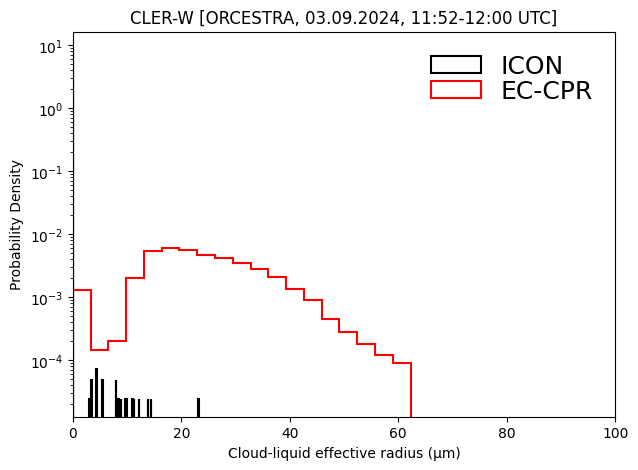

In [62]:

ds_icon = ds_4sip.sel(time=('2024-09-03T12:00:00.000000000'))

cler_w_4sip1200 = ds_icon.cler_w.values

cler_w_4sip1200 = cler_w_4sip1200.ravel()
cler_w_4sip1200 = cler_w_4sip1200[cler_w_4sip1200 > 0]

#cler_w_4sip1200[cler_w_4sip1200 <= 0] = np.nan


plt.figure(figsize=(7,5))
plt.hist(cler_w_4sip1200, bins=200, density=True, histtype='step', edgecolor='black', linewidth=1.5, label='ICON')
plt.hist(liq_effrad_ec1200, bins=200, density=True, histtype='step', edgecolor='red', linewidth=1.5, label='EC-CPR')
plt.xlim(0,100.0)
plt.yscale('log')
#plt.ylim(1.e-5,1.e-1)
plt.xlabel('Cloud-liquid effective radius (µm)')
plt.ylabel('Probability Density')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.title('CLER-W [ORCESTRA, 03.09.2024, 11:52-12:00 UTC]')
plt.show()

In [139]:
ds_4sip.htop_con

<xarray.DataArray 'htop_con' (time: 41, ncells: 73960)> Size: 12MB
dask.array<concatenate, shape=(41, 73960), dtype=float32, chunksize=(1, 73960), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 328B 2024-09-03 ... 2024-09-03T20:00:00
    clon     (ncells) float64 592kB dask.array<chunksize=(73960,), meta=np.ndarray>
    clat     (ncells) float64 592kB dask.array<chunksize=(73960,), meta=np.ndarray>
Dimensions without coordinates: ncells
Attributes:
    standard_name:                htop_con
    long_name:                    height of convective cloud top
    units:                        m
    param:                        27.6.0
    CDI_grid_type:                unstructured
    number_of_grid_in_reference:  1
    level_type:                   cloudtop

Shape of clth_data: (1200, 1200)
Dim of clth_data: 2
Dim of clth_data: uint16


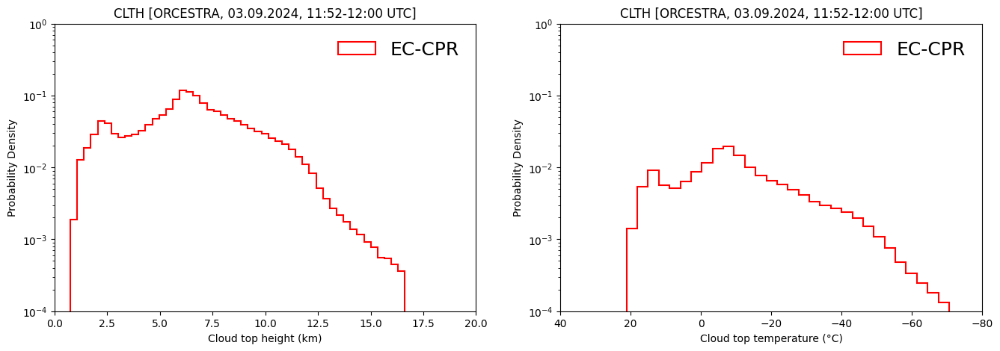

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/eff_rad_ctt/GC1SG1_20240903D01D_T0815_L2SG_CLPRK_3000.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    time_data = f['/Geometry_data/Obs_time']#[:]
    clth_data = f['/Image_data/CLTH']      # 2D (1200,1200)                        
    cltt_data = f['/Image_data/CLTT']
    
    slope_time = time_data.attrs['Slope'][0]
    slope_clth = clth_data.attrs['Slope'][0]
    slope_cltt = cltt_data.attrs['Slope'][0]
    offset_clth = clth_data.attrs['Offset'][0]
    offset_cltt = cltt_data.attrs['Offset'][0]
    error_dn = clth_data.attrs['Error_DN'][0]
    
    print("Shape of clth_data:", clth_data.shape)
    print("Dim of clth_data:", clth_data.ndim)
    print("Dim of clth_data:", clth_data.dtype)

    clth_DN = clth_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    cltt_DN = cltt_data[:]
    obs_time_DN = time_data[:]
    # Attributes
    #print("\nCLTH_Attributes:")
    #for key, val in clth_data.attrs.items():
    #    print(f"  {key}: {val}")
    #for key, val in cltt_data.attrs.items():
    #    print(f"  {key}: {val}")
    


# From the data description, the true effective radius can be obtained as true_cler_liq = DN * slope + Offset
# Here, DN = cler_wat_data, slope = 0.01 and Offset is given as 0.

cltop_ht = clth_DN * slope_clth + offset_clth
cltop_temp = cltt_DN * slope_cltt + offset_cltt
obs_time = obs_time_DN * slope_time

obs_time[obs_time < 0.] = np.nan
#print(liq_effrad.shape)
#print(obs_time)
#plt.plot(liq_effrad);

cltop_ht1200 = cltop_ht.ravel()
cltop_ht1200 = cltop_ht1200[~np.isnan(cltop_ht1200)]

cltop_temp1200 = cltop_temp.ravel()
cltop_temp1200 = cltop_temp1200[~np.isnan(cltop_temp1200)]

cltop_ht1200[cltop_ht1200 <= 0] = np.nan
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
plt.hist(cltop_ht1200, bins=200, density=True, histtype='step', edgecolor='red', linewidth=1.5, label='EC-CPR')
plt.xlim(0,20.0)
plt.yscale('log')
plt.ylim(1.e-4,1.e0)
plt.xlabel('Cloud top height (km)')
plt.ylabel('Probability Density')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.title('CLTH [ORCESTRA, 03.09.2024, 11:52-12:00 UTC]')


plt.subplot(1,2,2)
plt.hist(cltop_temp1200-273.16, bins=200, density=True, histtype='step', edgecolor='red', linewidth=1.5, label='EC-CPR')
plt.xlim(40,-80)
plt.yscale('log')
plt.ylim(1.e-4,1.e0)
plt.xlabel('Cloud top temperature (°C)')
plt.ylabel('Probability Density')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.title('CLTH [ORCESTRA, 03.09.2024, 11:52-12:00 UTC]')
plt.show()

In [24]:

import pyart

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    binht_data = f['/ScienceData/Geo/binHeight']     # 2D (9782, 218), but read as 1D (9782)  
    lon_data = f['/ScienceData/Geo/longitude']       #  1D (9782) [-180., 180]                        
    lat_data = f['/ScienceData/Geo/latitude']        #  1D (9782) [-90., 90]
    radar_fact_data = f['/ScienceData/Data/radarReflectivityFactor']       # 2D (9782, 218)
    
    #slope_time = time_data.attrs['Slope'][0]
    #slope_clth = clth_data.attrs['Slope'][0]
    #slope_cltt = cltt_data.attrs['Slope'][0]
    #offset_clth = clth_data.attrs['Offset'][0]
    #offset_cltt = cltt_data.attrs['Offset'][0]
    #error_dn = clth_data.attrs['Error_DN'][0]
    
    #print("Shape of binht_data:", binht_data.shape)
    #print("Dim of binht_data:", lon_data.ndim)
    #print("Dim of binht_data:", lat_data.dtype)
    #print()CFAD
    #print("Shape of lon_data:", lon_data.shape)
    #print("Dim of lon_data:", lon_data.dtype)
    #print("Dim of lon_data:", lon_data.ndim)
    #print()
    
    print("Shape of radar_fact_data:", radar_fact_data.shape)
    print("Dim of radar_fact_data:", radar_fact_data.dtype)
    print("Dim of radar_fact_data:", radar_fact_data.ndim)

    ht_m_ec = binht_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    lon_ec = lon_data[:]
    lat_ec = lat_data[:]
    radar_refl_ec = radar_fact_data[:]
    
    # Attributes
    print("\nradar_fact_Attributes:")
    for key, val in lon_data.attrs.items():
        print(f"  {key}: {val}")
    #print("\nlon_Attributes:")
    #for key, val in lon_data.attrs.items():
    #    print(f"  {key}: {val}")

print(lon_ec.shape)
fill_val = 9.96921e+36;
lon_ec = np.where(lon_ec == fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec == fill_val, np.nan, lat_ec)

ht_m_ec = np.where(ht_m_ec == fill_val, np.nan, ht_m_ec)
ht_m_ec = np.where(ht_m_ec <= 0, np.nan, ht_m_ec)

radar_refl_ec = np.where(radar_refl_ec == fill_val, np.nan, radar_refl_ec)
radar_refl_ec = np.where(radar_refl_ec <= 0, np.nan, radar_refl_ec)

refl_dbz_ec = 10.*np.log(radar_refl_ec)

mean_ht_ec = 1.e-3 * np.nanmean(ht_m_ec, axis=0)
#mean_lon_ec = np.nanmean(lon_ec, axis=0)

print(lon_ec.shape)
print(mean_ht_ec.shape, np.nanmin(mean_ht_ec), np.nanmax(mean_ht_ec))
print(lon_ec.shape, np.nanmin(lon_ec), np.nanmax(lon_ec))

Shape of radar_fact_data: (9782, 218)
Dim of radar_fact_data: float32
Dim of radar_fact_data: 2

radar_fact_Attributes:
  DimensionNames: b'nray'
  _FillValue: [9.96920997e+36]
  long_name: b'longitude'
  units: b'degree_east'
  valid_range: [-180.  180.]
(9782,)
(9782,)
(218,) 0.0047007278 20.22951
(9782,) -36.80194334467802 -28.06536957330144


Shape of radar_fact_data: (9782, 218)
Dim of radar_fact_data: float32
Dim of radar_fact_data: 2

radar_fact_Attributes:
  DimensionNames: b'nray'
  _FillValue: [9.96920997e+36]
  long_name: b'longitude'
  units: b'degree_east'
  valid_range: [-180.  180.]
(9782,)
(9782,)
(218,) 0.0047007278 20.22951
(9782,) -36.80194334467802 -28.06536957330144


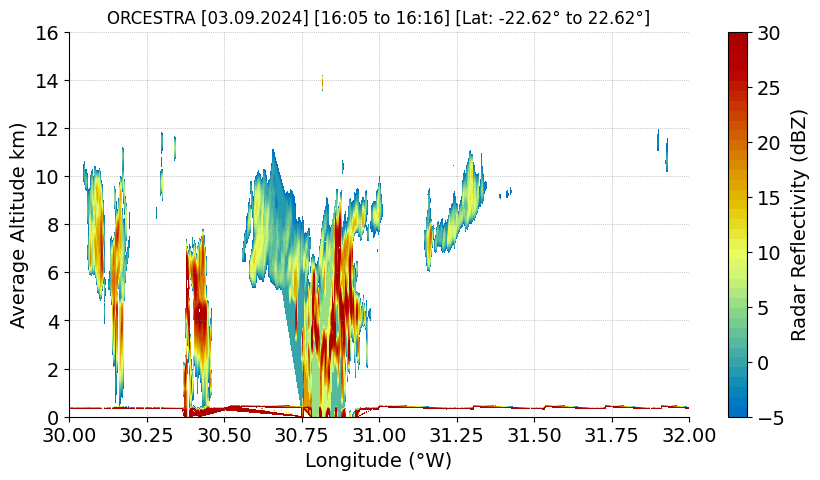

In [25]:

import pyart

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    binht_data = f['/ScienceData/Geo/binHeight']     # 2D (9782, 218), but read as 1D (9782)  
    lon_data = f['/ScienceData/Geo/longitude']       #  1D (9782) [-180., 180]                        
    lat_data = f['/ScienceData/Geo/latitude']        #  1D (9782) [-90., 90]
    radar_fact_data = f['/ScienceData/Data/radarReflectivityFactor']       # 2D (9782, 218)
    
    #slope_time = time_data.attrs['Slope'][0]
    #slope_clth = clth_data.attrs['Slope'][0]
    #slope_cltt = cltt_data.attrs['Slope'][0]
    #offset_clth = clth_data.attrs['Offset'][0]
    #offset_cltt = cltt_data.attrs['Offset'][0]
    #error_dn = clth_data.attrs['Error_DN'][0]
    
    #print("Shape of binht_data:", binht_data.shape)
    #print("Dim of binht_data:", lon_data.ndim)
    #print("Dim of binht_data:", lat_data.dtype)
    #print()
    #print("Shape of lon_data:", lon_data.shape)
    #print("Dim of lon_data:", lon_data.dtype)
    #print("Dim of lon_data:", lon_data.ndim)
    #print()
    
    print("Shape of radar_fact_data:", radar_fact_data.shape)
    print("Dim of radar_fact_data:", radar_fact_data.dtype)
    print("Dim of radar_fact_data:", radar_fact_data.ndim)

    ht_m_ec = binht_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    lon_ec = lon_data[:]
    lat_ec = lat_data[:]
    radar_refl_ec = radar_fact_data[:]
    
    # Attributes
    print("\nradar_fact_Attributes:")
    for key, val in lon_data.attrs.items():
        print(f"  {key}: {val}")
    #print("\nlon_Attributes:")
    #for key, val in lon_data.attrs.items():
    #    print(f"  {key}: {val}")

print(lon_ec.shape)
fill_val = 9.96921e+36;
lon_ec = np.where(lon_ec == fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec == fill_val, np.nan, lat_ec)

ht_m_ec = np.where(ht_m_ec == fill_val, np.nan, ht_m_ec)
ht_m_ec = np.where(ht_m_ec <= 0, np.nan, ht_m_ec)

radar_refl_ec = np.where(radar_refl_ec == fill_val, np.nan, radar_refl_ec)
radar_refl_ec = np.where(radar_refl_ec <= 0, np.nan, radar_refl_ec)

refl_dbz_ec = 10.*np.log(radar_refl_ec)

mean_ht_ec = 1.e-3 * np.nanmean(ht_m_ec, axis=0)
#mean_lon_ec = np.nanmean(lon_ec, axis=0)

print(lon_ec.shape)
print(mean_ht_ec.shape, np.nanmin(mean_ht_ec), np.nanmax(mean_ht_ec))
print(lon_ec.shape, np.nanmin(lon_ec), np.nanmax(lon_ec))


################################################################################
#mean_ht_ec = 1.e-3*np.mean(mean_ht_ec,axis=0)
#print(refl_fact_ec)

colors = ['white', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']

cmap = ListedColormap(colors)

#lat_range_mask = (lat_ec > 0) & (lat_ec < 10)

#print(np.min(lat_ec))
#print(np.max(lat_ec))
#refl_fact_ec[refl_fact_ec == 9.9692100e+36] = np.nan
#refl_fact_ec[refl_fact_ec > 40.] = 0.;#np.zeros
#refl_fact_ec[refl_fact_ec < -10.] = 0.;
#refl_fact_ec[refl_fact_ec < 1.e-2] = np.nan
#refl_fact_ec[(refl_fact_ec < 1.e-3) & (refl_fact_ec > -0.5)] = np.nan
#refl_fact_ec[mean_ht_ec > 12] = np.nan
################################################################################

lev_refl = np.linspace(-5., 30, 40)
fontsize=14
linewidth=2

plt.figure(figsize=(10, 5))
contour=plt.contourf(-1.*lon_ec, mean_ht_ec, refl_dbz_ec.T, vmin=-5, vmax=30, levels=lev_refl, cmap='HomeyerRainbow')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30, 32)
plt.ylim(0,16)
#plt.xticks([-32, -31.5, -31, -30.5, -30], fontsize=14)
#plt.xticks([-32, -31.75, -31.5, -31.25, -31, -30.75, -30.5, -30.25, -30], fontsize=12, rotation=25)
plt.xticks([32, 31.75, 31.5, 31.25, 31, 30.75, 30.5, 30.25, 30], fontsize=fontsize, rotation=0)
#plt.xticks([30, 30.25, 30.5, 30.75, 31, 31.25, 31.5, 31.75, 32], fontsize=fontsize, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=fontsize)
plt.ylabel("Average Altitude km)", fontsize=fontsize)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: -22.62° to 22.62°]", fontsize=fontsize-2)
cbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30], label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Radar Reflectivity (dBZ)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()


In [64]:
refl_dbz_ec.shape

(9782, 218)

(864, 218)
Number of True: 864
Number of False: 8918


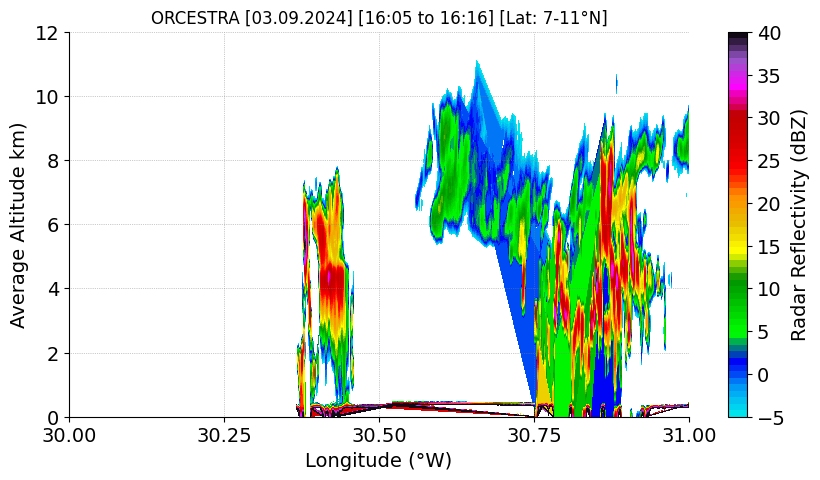

In [26]:

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

print(refl_dbz_ec_filt.shape)
print("Number of True:", mask.sum().item())
print("Number of False:", (~mask).sum().item())

lev = np.linspace(-5, 40, 60)
plt.figure(figsize=(10, 5))
plt.style.use('default')
contour=plt.contourf(-1.*lon_ec_filt, mean_ht_ec, refl_dbz_ec_filt.T, levels=lev, cmap='pyart_NWSRef')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30, 31)
plt.ylim(0,12)
#plt.xticks([-32, -31.5, -31, -30.5, -30], fontsize=14)
#plt.xticks([-32, -31.75, -31.5, -31.25, -31, -30.75, -30.5, -30.25, -30], fontsize=12, rotation=25)
plt.xticks([31, 30.75, 30.5, 30.25, 30], fontsize=fontsize, rotation=0)
#plt.xticks([30, 30.25, 30.5, 30.75, 31, 31.25, 31.5, 31.75, 32], fontsize=fontsize, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=fontsize)
plt.ylabel("Average Altitude km)", fontsize=fontsize)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: 7-11°N]", fontsize=fontsize-2)
cbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Radar Reflectivity (dBZ)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

In [11]:

print(refl_dbz_ec_filt.shape, lon_ec_filt.shape, lat_ec_filt.shape, mean_ht_ec.shape)

(864, 218) (864,) (864,) (218,)


In [12]:

lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip.clon > lon_min) & (ds_4sip.clon < lon_max) &
    (ds_4sip.clat > lat_min) & (ds_4sip.clat < lat_max)
)

#n_true = mask.sum().compute().item()
#print("Number of True:", n_true)

ds_icon = ds_4sip.where(mask)

#clon = np.rad2deg(ds_icon.clon.values)
#clat = np.rad2deg(ds_icon.clat.values)

clon = ds_icon.clon.values
clat = ds_icon.clat.values

#print(clat)

lat_mask = (clat > lat_min) & (clat < lat_max)
#print(lat_mask.sum().item())

ds_filt = ds_icon.sel(time='2024-09-03T16:00:00.000000000')
dbz_filt = ds_filt.dbz

alt_km_filt = ds_filt.z_mc.mean(dim=('ncells'))

dbz_latband = dbz_filt[:, lat_mask]
clon_latband = clon[lat_mask]

dbz_latband = xr.where(dbz_filt > -5., dbz_filt, np.nan)
#plt.contourf()
#ds_icon

-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


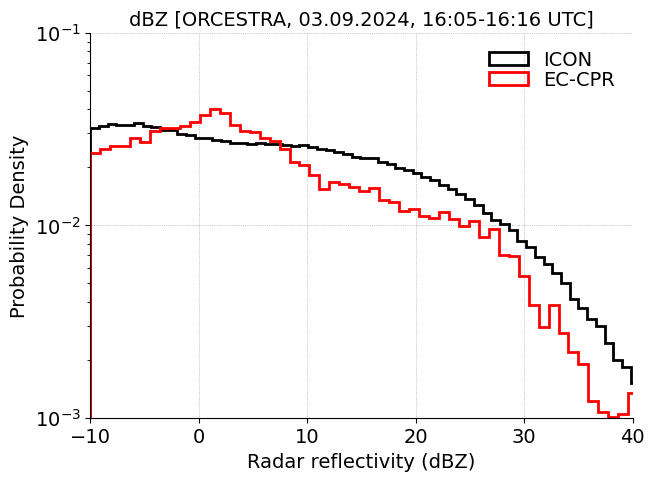

In [67]:

ds_filt = ds_icon.sel(time='2024-09-03T16:00:00.000000000')

refl_4sip1600 = ds_filt.dbz.values

refl_4sip1600 = refl_4sip1600.ravel()
refl_4sip1600 = refl_4sip1600[refl_4sip1600 > -10]

refl_ec1600 = refl_dbz_ec_filt
refl_ec1600 = refl_ec1600.ravel()
refl_ec1600 = refl_ec1600[refl_ec1600 > -10]
#cler_w_4sip1200[cler_w_4sip1200 <= 0] = np.nan

fnt = 14;
ln = 2;
plt.figure(figsize=(7,5))
plt.hist(refl_4sip1600, bins=100, density=True, histtype='step', edgecolor='black', linewidth=ln, label='ICON', alpha=1)
plt.hist(refl_ec1600, bins=100, density=True, histtype='step', edgecolor='red', linewidth=ln, label='EC-CPR', alpha=1)
plt.xlim(-10,40.0)
plt.yscale('log')
plt.ylim(1.e-3,1.e-1)
plt.xlabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Probability Density', fontsize=fnt)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.title('dBZ [ORCESTRA, 03.09.2024, 16:05-16:16 UTC]', fontsize=fnt)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

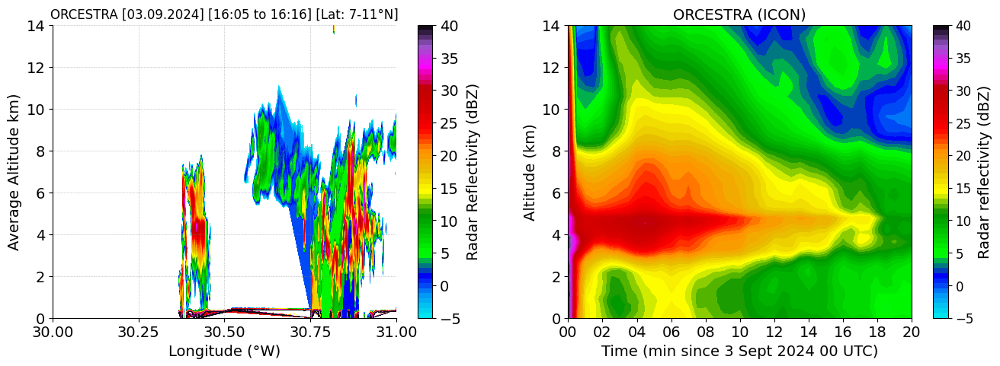

In [13]:

avg_ht = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
avg_refl_sip = ds_4sip.dbz.where(ds_4sip.dbz > -10).mean(dim=('ncells'))


lnwdth = 3
fontsize = 14
lev = np.linspace(-5, 40, 60)

plt.figure(figsize=(16, 5))
plt.subplot(1,2,1)
contour=plt.contourf(-1.*lon_ec_filt, mean_ht_ec, refl_dbz_ec_filt.T, levels=lev, cmap='pyart_NWSRef')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlim(30, 31)
plt.ylim(0,14)
#plt.xticks([-32, -31.5, -31, -30.5, -30], fontsize=14)
#plt.xticks([-32, -31.75, -31.5, -31.25, -31, -30.75, -30.5, -30.25, -30], fontsize=12, rotation=25)
plt.xticks([31, 30.75, 30.5, 30.25, 30], fontsize=fontsize, rotation=0)
#plt.xticks([30, 30.25, 30.5, 30.75, 31, 31.25, 31.5, 31.75, 32], fontsize=fontsize, rotation=0)

plt.yticks([0, 2, 4, 6, 8, 10, 12, 14], fontsize=fontsize)
plt.xlabel("Longitude (°W)", fontsize=fontsize)
plt.ylabel("Average Altitude km)", fontsize=fontsize)
plt.title("ORCESTRA [03.09.2024] [16:05 to 16:16] [Lat: 7-11°N]", fontsize=fontsize-2)
cbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar Reflectivity (dBZ)', orientation='vertical')
cbar.set_label('Radar Reflectivity (dBZ)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)
colorbar = plt.colorbar(contour, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)
plt.xlabel('Time (min since 3 Sept 2024 00 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 20, 0)# Format to show only hours
plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)
plt.ylim([0, 14])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('ORCESTRA (ICON)', fontsize=fontsize)
plt.show()


In [79]:

mean_ht_ec = mean_ht_ec[np.isfinite(mean_ht_ec)]
print(mean_ht_ec)

[20.22951    20.129602   20.029676   19.929756   19.829811   19.729883
 19.629965   19.530012   19.430088   19.330158   19.230204   19.130302
 19.030352   18.93045    18.830494   18.730581   18.63063    18.53071
 18.43078    18.330856   18.230907   18.130983   18.031055   17.931126
 17.83121    17.731277   17.631351   17.531425   17.431522   17.331581
 17.231667   17.131712   17.031805   16.931849   16.831915   16.732004
 16.632057   16.532122   16.43219    16.332262   16.232319   16.132404
 16.032461   15.93253    15.832607   15.732674   15.632751   15.532787
 15.432885   15.332939   15.233008   15.133061   15.033137   14.933208
 14.833266   14.733336   14.633402   14.533478   14.433548   14.333633
 14.233689   14.133769   14.033831   13.933905   13.833968   13.734033
 13.634103   13.534182   13.434245   13.334313   13.234379   13.134473
 13.034534   12.934615   12.834664   12.734746   12.6348     12.534876
 12.434942   12.335007   12.235092   12.135138   12.03522    11.935286
 11.835

In [117]:
ds_4sip

<xarray.Dataset> Size: 64GB
Dimensions:         (time: 41, height: 65, height_2: 66, plev: 1, plev_2: 1,
                     plev_3: 1, ncells: 73960, vertices: 3, bnds: 2)
Coordinates:
  * time            (time) datetime64[ns] 328B 2024-09-03 ... 2024-09-03T20:0...
  * height          (height) float64 520B 1.0 2.0 3.0 4.0 ... 63.0 64.0 65.0
  * height_2        (height_2) float64 528B 1.0 2.0 3.0 4.0 ... 64.0 65.0 66.0
  * plev            (plev) float64 8B 800.0
  * plev_2          (plev_2) float64 8B 400.0
  * plev_3          (plev_3) float64 8B 0.0
    clon            (ncells) float64 592kB dask.array<chunksize=(73960,), meta=np.ndarray>
    clat            (ncells) float64 592kB dask.array<chunksize=(73960,), meta=np.ndarray>
Dimensions without coordinates: ncells, vertices, bnds
Data variables: (12/105)
    clon_bnds       (time, ncells, vertices) float64 73MB dask.array<chunksize=(1, 73960, 3), meta=np.ndarray>
    clat_bnds       (time, ncells, vertices) float64 73MB dask.array<chunksize=(1, 73960, 3), meta=np.ndarray>
    height_bnds     (time, height, bnds) float64 43kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds       (time, plev, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds     (time, plev_2, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds     (time, plev_3, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    ...              ...
    inc_perl        (time, height, ncells) float32 788MB dask.array<chunksize=(1, 65, 73960), meta=np.ndarray>
    dz              (time, height, ncells) float32 788MB dask.array<chunksize=(1, 32, 73960), meta=np.ndarray>
    clwp_kgperm2    (time, ncells) float32 12MB dask.array<chunksize=(1, 73960), meta=np.ndarray>
    ciwp_kgperm2    (time, ncells) float32 12MB dask.array<chunksize=(1, 73960), meta=np.ndarray>
    rwp_kgperm2     (time, ncells) float32 12MB dask.array<chunksize=(1, 73960), meta=np.ndarray>
    cler_w          (time, height, ncells) float32 788MB dask.array<chunksize=(1, 65, 73960), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.4.0 (https://mpime...
    Conventions:          CF-1.6
    number_of_grid_used:  99
    uuidOfHGrid:          572c63b4-5951-d138-93bd-61b05c102860
    uuidOfVGrid:          567425a0-32bf-151c-3811-4389b7cd21e0
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    title:                ICON simulation
    source:               version: 2024.10; revision: 2a8abec3cefd1c9db62f378...
    history:              /home/b/b382718/icon_orcestra_4sip/icon-oct2024/bin...
    references:           see MPIM/DWD publications
    comment:              Deepak Waman (b382718) on l30683 (Linux 4.18.0-513....

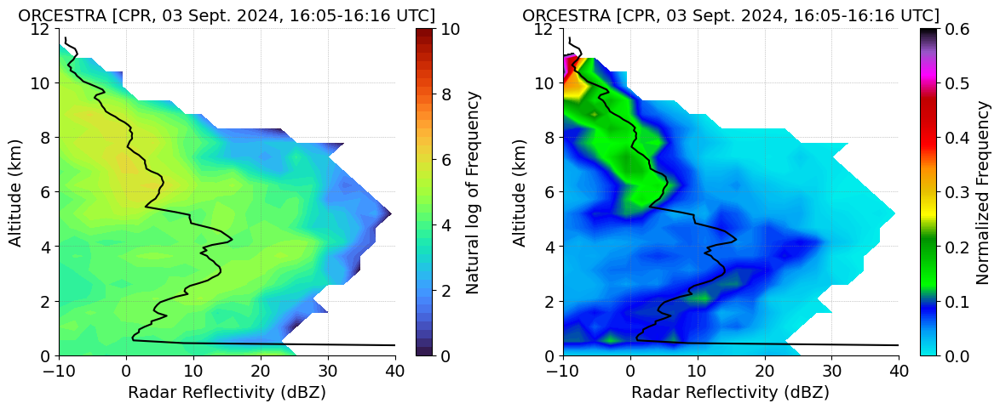

In [27]:

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

# Reflectivity values and height
refl_ec_filt1 = refl_dbz_ec_filt;
mean_alt_ec_filt1 = mean_ht_ec;

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan
mean_alt_ec_filt1 = mean_alt_ec_filt1

refl_ec_filt1 
#mean_alt_ec_filt1 = mean_alt_ec_filt1[np.isfinite(mean_alt_ec_filt1)]
mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan

#refl_ec_filt1 = refl_ec_filt1[:,:-2]              # because mean_alt_ec_filt1 takes dimensions 216 (original 218) after filtering
refl_ec_filt1 = refl_ec_filt1

#refl_ec_filt1[refl_ec_filt1 > 60.] = 60.

nbin = 40
refl_ec_bins = np.linspace(np.nanmin(refl_ec_filt1), np.nanmax(refl_ec_filt1), nbin)
height_bins = np.linspace(np.nanmin(mean_alt_ec_filt1), np.nanmax(mean_alt_ec_filt1), nbin)


cfad_refl_ec = np.zeros((len(refl_ec_bins) - 1, len(height_bins) - 1))

for i in range(len(refl_ec_filt1)):
    for j in range(len(mean_alt_ec_filt1)):
        if not np.isnan(refl_ec_filt1[i, j]):  
            refl_bin_idx = np.digitize(refl_ec_filt1[i, j], refl_ec_bins) - 1
            if refl_bin_idx == len(refl_ec_bins) - 1:  
                refl_bin_idx -= 1
            
            height_bin_idx = np.digitize(mean_alt_ec_filt1[j], height_bins) - 1
            if height_bin_idx == len(height_bins) - 1:  
                height_bin_idx -= 1
            
            cfad_refl_ec[refl_bin_idx, height_bin_idx] += 1


###======== Calculate median
#refl_ec_filt1_masked = np.where(refl_ec_filt1 < 40, refl_ec_filt1, np.nan)
#median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

refl_ec_filt1_masked = np.where(refl_ec_filt1, refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1, axis=0)

#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

cfad_refl_ec_norm[cfad_refl_ec_norm <= 0.] = np.nan

colors = ['grey', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod',
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)



#lev_refl = np.linspace(0., 20000, 400)
fnt = 14
lev1 = np.linspace(0., 10, 40)
lev2 = np.linspace(0., 0.6, 400)

plt.figure(figsize=(14, 5))

plt.subplot(1,2,1)

contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], np.log(cfad_refl_ec.T), levels=lev1, cmap='turbo')
plt.plot(median_refl_ec,mean_alt_ec_filt1, 'k-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 12)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)

contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], (cfad_refl_ec_norm.T), levels=lev2, cmap='pyart_NWSRef')#pyart_HomeyerRainbow')
plt.plot(median_refl_ec,mean_alt_ec_filt1, 'k-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 12)
cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# Show the plot
plt.show()

(218,) (864, 218)


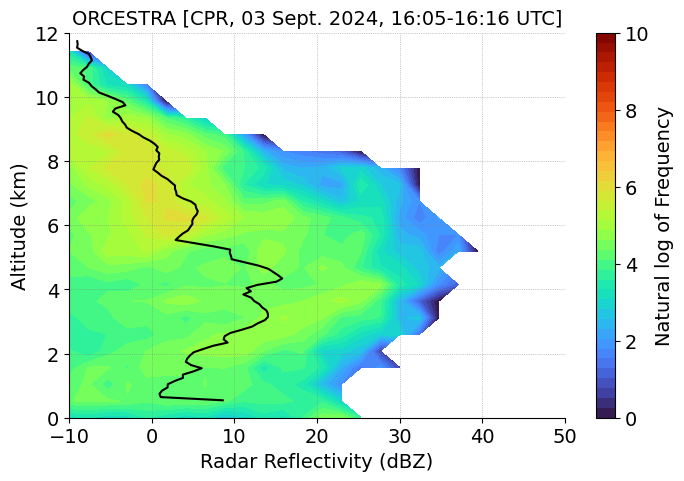

In [28]:

import numpy as np

# Reflectivity values and height
refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

#col_mask = mean_alt_ec_filt1 < 0.3
#refl_ec_filt1[:, col_mask] = 15.
#col_mask = mean_alt_ec_filt1 < 0.3
#refl_ec_filt1[:, col_mask] = 14.
#col_mask = mean_alt_ec_filt1 < 0.2
#refl_ec_filt1[:, col_mask] = 12.

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan

print(mean_alt_ec_filt1.shape, refl_ec_filt1.shape)
finite_alt_mask = np.isfinite(mean_alt_ec_filt1)

#mean_alt_ec_filt1 = mean_alt_ec_filt1[finite_alt_mask]
refl_ec_filt1 = refl_ec_filt1[:, 1:len(mean_alt_ec_filt1)] #finite_alt_mask]  # Apply the same mask to columns

# Now, refl_ec_filt1.shape[1] == mean_alt_ec_filt1.shape[0]

nbin = 40
refl_ec_bins = np.linspace(np.nanmin(refl_ec_filt1), np.nanmax(refl_ec_filt1), nbin)
height_bins = np.linspace(np.nanmin(mean_alt_ec_filt1), np.nanmax(mean_alt_ec_filt1), nbin)

cfad_refl_ec = np.zeros((len(refl_ec_bins) - 1, len(height_bins) - 1))

for i in range(refl_ec_filt1.shape[0]):
    for j in range(refl_ec_filt1.shape[1]):
        if not np.isnan(refl_ec_filt1[i, j]):  
            refl_bin_idx = np.digitize(refl_ec_filt1[i, j], refl_ec_bins) - 1
            if refl_bin_idx >= len(refl_ec_bins) - 1:  
                refl_bin_idx = len(refl_ec_bins) - 2  # Clamp to valid range
            
            height_bin_idx = np.digitize(mean_alt_ec_filt1[j], height_bins) - 1
            if height_bin_idx >= len(height_bins) - 1:  
                height_bin_idx = len(height_bins) - 2  # Clamp to valid range
            
            cfad_refl_ec[refl_bin_idx, height_bin_idx] += 1

#=========== Calculate median for values < 40
refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)
#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

colors = ['grey', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod',
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)



#lev_refl = np.linspace(0., 20000, 400)
fnt = 14
lev = np.linspace(0., 10, 40)
plt.figure(figsize=(8, 5))
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], np.log(cfad_refl_ec.T), levels=lev, cmap='turbo')
plt.plot(median_refl_ec,mean_alt_ec_filt1[:-1], 'k-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 50)
plt.ylim(0, 12)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# Show the plot
plt.show()

(218,) (864, 218)


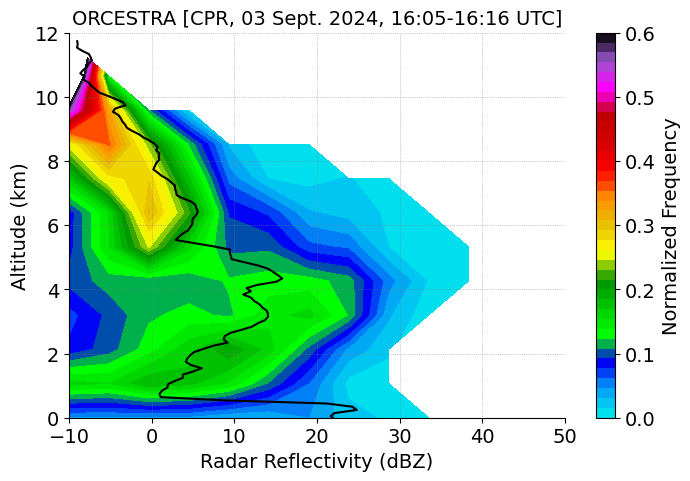

In [29]:

import numpy as np

# Reflectivity values and height
refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

#col_mask = mean_alt_ec_filt1 < 0.3
#refl_ec_filt1[:, col_mask] = 15.
#col_mask = mean_alt_ec_filt1 < 0.3
#refl_ec_filt1[:, col_mask] = 14.
#col_mask = mean_alt_ec_filt1 < 0.2
#refl_ec_filt1[:, col_mask] = 12.

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan

print(mean_alt_ec_filt1.shape, refl_ec_filt1.shape)
finite_alt_mask = np.isfinite(mean_alt_ec_filt1)

#mean_alt_ec_filt1 = mean_alt_ec_filt1[finite_alt_mask]
refl_ec_filt1 = refl_ec_filt1[:, 1:len(mean_alt_ec_filt1)] #finite_alt_mask]  # Apply the same mask to columns

# Now, refl_ec_filt1.shape[1] == mean_alt_ec_filt1.shape[0]

nbin = 20
refl_ec_bins = np.linspace(np.nanmin(refl_ec_filt1), np.nanmax(refl_ec_filt1), nbin)
height_bins = np.linspace(np.nanmin(mean_alt_ec_filt1), np.nanmax(mean_alt_ec_filt1), nbin)

cfad_refl_ec = np.zeros((len(refl_ec_bins) - 1, len(height_bins) - 1))

for i in range(refl_ec_filt1.shape[0]):
    for j in range(refl_ec_filt1.shape[1]):
        if not np.isnan(refl_ec_filt1[i, j]):  
            refl_bin_idx = np.digitize(refl_ec_filt1[i, j], refl_ec_bins) - 1
            if refl_bin_idx >= len(refl_ec_bins) - 1:  
                refl_bin_idx = len(refl_ec_bins) - 2  # Clamp to valid range
            
            height_bin_idx = np.digitize(mean_alt_ec_filt1[j], height_bins) - 1
            if height_bin_idx >= len(height_bins) - 1:  
                height_bin_idx = len(height_bins) - 2  # Clamp to valid range
            
            cfad_refl_ec[refl_bin_idx, height_bin_idx] += 1

#=========== Calculate median for values < 40
refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

colors = ['grey', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod',
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)


cfad_refl_ec_norm[cfad_refl_ec_norm <= 0.] = np.nan
#lev_refl = np.linspace(0., 20000, 400)
fnt = 14
lev = np.linspace(0., 0.6, 40)

plt.figure(figsize=(8, 5))
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], (cfad_refl_ec_norm.T), levels=lev, cmap='pyart_NWSRef')
plt.plot(median_refl_ec,mean_alt_ec_filt1[:-1], 'k-')
#plt.plot(mean_refl_ec,mean_alt_ec_filt1[:-1], 'k--')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 50)
plt.ylim(0, 12)
cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# Show the plot
plt.show()

In [61]:
ds_4sip_hfreq.time[515:528]

<xarray.DataArray 'time' (time: 13)> Size: 104B
array(['2024-09-03T16:04:00.000000000', '2024-09-03T16:05:00.000000000',
       '2024-09-03T16:06:00.000000000', '2024-09-03T16:07:00.000000000',
       '2024-09-03T16:08:00.000000000', '2024-09-03T16:09:00.000000000',
       '2024-09-03T16:10:00.000000000', '2024-09-03T16:11:00.000000000',
       '2024-09-03T16:12:00.000000000', '2024-09-03T16:13:00.000000000',
       '2024-09-03T16:14:00.000000000', '2024-09-03T16:15:00.000000000',
       '2024-09-03T16:16:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 104B 2024-09-03T16:04:00 ... 2024-09-03T16...
Attributes:
    standard_name:  time
    axis:           T

In [30]:

lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip_hfreq.clon > lon_min) & (ds_4sip_hfreq.clon < lon_max) &
    (ds_4sip_hfreq.clat > lat_min) & (ds_4sip_hfreq.clat < lat_max)
)


#ds_icon = ds_4sip_hfreq.where(mask)

#ds_4sip_filt = ds_icon.sel(time=slice('2024-09-03T16:08:00.000000000','2024-09-03T16:16:00.000000000'))

#ds_4sip_filt = ds_4sip_hfreq.sel(time=slice('2024-09-03T16:08:00.000000000','2024-09-03T16:16:00.000000000')).where(mask)

ds_4sip_filt = ds_4sip_hfreq.sel(time=slice('2024-09-03T16:04:00','2024-09-03T16:16:00')).load()
ds_4sip_filt = ds_4sip_filt.where(mask)

filt_refl_4sip = xr.where(ds_4sip_filt.dbz > -10., ds_4sip_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_4sip_filt.z_mc

refl_4sip_flat = filt_refl_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()


-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


In [18]:
print(mean_alt_ec_filt1.shape, refl_ec_filt1.shape)
#print(ds_4sip_filt)

(218,) (864, 217)


In [31]:
################## EarthCARE ############
nbin=25;

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan


# Flatten refl to 1D
refl_flat = refl_ec_filt1.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

# Define bins (for example, with nbin=100 or whatever you want)
dbz_ec_bins = np.linspace(np.nanmin(refl_flat), np.nanmax(refl_flat), nbin)
alt_ec_bins = np.linspace(np.nanmin(alt_flat), np.nanmax(alt_flat), nbin)

# 2D histogram
cfad_refl_ec, xedges_ec, yedges_ec = np.histogram2d(refl_flat, alt_flat, bins=[dbz_ec_bins, alt_ec_bins]) # count over all ht and dbz bins 

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

############## EarthCARE CFAD End #######

In [33]:
################## EarthCARE ############
nbin=25;

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan

# refl_ec_filt1.shape == (864, 217)
# mean_alt_ec_filt1.shape == (217,)

# Flatten refl to 1D
refl_flat = refl_ec_filt1.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

# Define bins (for example, with nbin=100 or whatever you want)
dbz_ec_bins = np.linspace(np.nanmin(refl_flat), np.nanmax(refl_flat), nbin)
alt_ec_bins = np.linspace(np.nanmin(alt_flat), np.nanmax(alt_flat), nbin)

# 2D histogram
cfad_refl_ec, xedges_ec, yedges_ec = np.histogram2d(refl_flat, alt_flat, bins=[dbz_ec_bins, alt_ec_bins]) # count over all ht and dbz bins 

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

############## EarthCARE CFAD End #######

################## ICON #################

# Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(refl_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (refl_4sip_flat > -10) & (alt_4sip_flat >= 0)
refl_4sip_flat = refl_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]


dbz_4sip_bins = np.linspace(np.nanmin(refl_4sip_flat), np.nanmax(refl_4sip_flat), nbin)   
alt_4sip_bins = np.linspace(np.nanmin(alt_4sip_flat), np.nanmax(alt_4sip_flat), nbin)     

# 6. 2D Histogram (CFAD)
cfad_4sip, xedges_4sip, yedges_4sip = np.histogram2d(refl_4sip_flat, alt_4sip_flat, bins=[dbz_4sip_bins, alt_4sip_bins])

cfad_4sip_norm = cfad_4sip / np.sum(cfad_4sip, axis=0, keepdims=True) # normalized by height


med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
mean_refl_4sip = filt_refl_4sip.mean(dim=('time','ncells'))
mean_alt_4sip = alt_4sip_km.mean(dim=('time','ncells'))

median_refl_4sip = med_refl_4sip.compute()
mean_alt_4sip = mean_alt_4sip.compute()
median_refl_4sip[mean_alt_4sip > 15.] = np.nan

################## ICON CFAD End #################



/home/b/b382718/own_env/lib/python3.9/site-packages/numpy/lib/_nanfunctions_impl.py:1233: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,
Task exception was never retrieved
future: <Task finished name='Task-1298308' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382718/own_env/lib/python3.9/site-packages/distributed/client.py:2396> exception=AllExit()>
Traceback (most recent call last):
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed/client.py", line 2405, in wait
    raise AllExit()
distributed.client.AllExit


In [ ]:
refl_ec_filt1

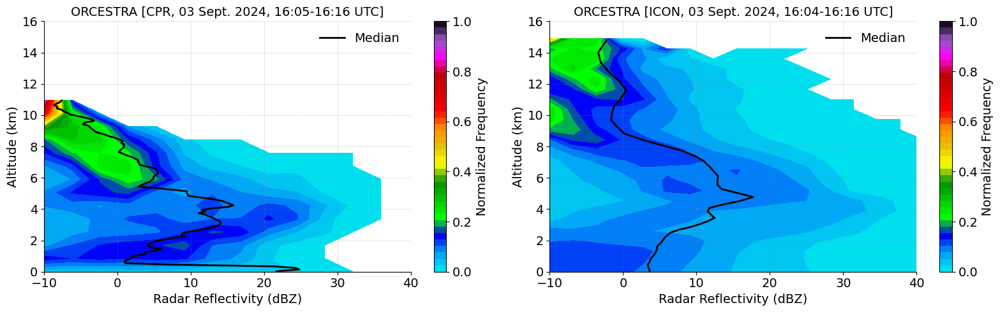

In [34]:


mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec1 = median_refl_ec
median_refl_ec1[mean_alt_ec_filt1 > 11] = np.nan


height_bin_centers = 0.5 * (alt_ec_bins[:-1] + alt_ec_bins[1:])
cfad_refl_ec_norm[:, height_bin_centers > 13.] = np.nan

cfad_refl_ec_norm[cfad_refl_ec_norm <= 0.] = np.nan

cfad_4sip_norm[cfad_4sip_norm <= 0.] = np.nan


fnt = 14
lev1 = np.linspace(0., 1, 40)
lev2 = np.linspace(0., 1, 40)
plt.figure(figsize=(16, 5))

plt.subplot(1,2,1)
contour = plt.contourf(dbz_ec_bins[:-1], alt_ec_bins[:-1], (cfad_refl_ec_norm.T), levels=lev1, cmap='pyart_NWSRef')
plt.plot(median_refl_ec1, mean_alt_ec_filt1, 'k-', linewidth=2, label='Median')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
#contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
contour = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], (cfad_4sip_norm.T), levels=lev2, cmap='pyart_NWSRef')
plt.plot(median_refl_4sip, mean_alt_4sip, color='k', linewidth=2, label='Median')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 16:04-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
#cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [38]:
lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip_hfreq.clon > lon_min) & (ds_4sip_hfreq.clon < lon_max) &
    (ds_4sip_hfreq.clat > lat_min) & (ds_4sip_hfreq.clat < lat_max)
)

#n_true = mask.sum().compute().item()
#print("Number of True:", n_true)

ds_icon = ds_4sip_hfreq.where(mask)
#
ds_icon = ds_icon.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:16:00.000000000'))
print(ds_icon.time)
#ds_icon = ds_filt;

#clon = np.rad2deg(ds_icon.clon.values)
#clat = np.rad2deg(ds_icon.clat.values)

#clon = ds_icon.clon.values
#clat = ds_icon.clat.values


ds_4sip_filt = ds_icon

refl_4sip = ds_4sip_filt['dbz'];
refl_4sip_filt = xr.where(ds_4sip_filt.dbz > -10., ds_4sip_filt.dbz, np.nan);

refl_4sip_filt_min = refl_4sip_filt.min().values
refl_4sip_filt_max = refl_4sip_filt.max().values

-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624
<xarray.DataArray 'time' (time: 13)> Size: 104B
array(['2024-09-03T16:04:00.000000000', '2024-09-03T16:05:00.000000000',
       '2024-09-03T16:06:00.000000000', '2024-09-03T16:07:00.000000000',
       '2024-09-03T16:08:00.000000000', '2024-09-03T16:09:00.000000000',
       '2024-09-03T16:10:00.000000000', '2024-09-03T16:11:00.000000000',
       '2024-09-03T16:12:00.000000000', '2024-09-03T16:13:00.000000000',
       '2024-09-03T16:14:00.000000000', '2024-09-03T16:15:00.000000000',
       '2024-09-03T16:16:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 104B 2024-09-03T16:04:00 ... 2024-09-03T16...
Attributes:
    standard_name:  time
    axis:           T


In [22]:
refl_4sip_filt_max

array(66.47241, dtype=float32)

In [44]:

avg_alt_4sip = 1.e-3*ds_4sip_filt.z_mc.sel(time='2024-09-03T16:04:00.000000000').mean(dim=('ncells'))
#CFAD
nbin = 40
refl_4sip_bins = np.linspace(refl_4sip_filt_min, refl_4sip_filt_max, nbin);
alt_4sip_bins = np.linspace(np.nanmin(avg_alt_4sip), np.nanmax(avg_alt_4sip), nbin)

cfad_refl_4sip = np.zeros((len(refl_4sip_bins) - 1, len(avg_alt_4sip)));
refl_4sip_values = refl_4sip_filt.values;

#for i in range(len(refl_4sip_bins) - 1):
#    mask = (refl_4sip_values >= refl_4sip_bins[i]) & (refl_4sip_values < refl_4sip_bins[i + 1])    
#    cfad_refl_4sip[i, :] = np.sum(mask, axis=1) #/ len(ds_4sip_filt.time)

for i in range(len(refl_4sip_bins) - 1):
    mask = (refl_4sip_values >= refl_4sip_bins[i]) & \
           (refl_4sip_values < refl_4sip_bins[i+1])
    
    # Sum over time (axis 0) and ncells (axis 2)
    cfad_refl_4sip[i, :] = np.sum(mask, axis=(0, 2))

# ---- Normalization step (column-wise) ----
# Avoid division by zero by using np.where
column_sums = np.sum(cfad_refl_4sip, axis=0)  # shape: [n_vertical_levels]

# Normalize each column to get relative frequencies
cfad_refl_4sip_normalized = np.where(column_sums > 0, cfad_refl_4sip / column_sums, np.nan)


###======== Calculate median
median_refl_4sip = np.nanmedian(refl_4sip_values, axis=1)


mean_refl_4sip = np.nanmean(refl_4sip_values, axis=0)
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_4sip_norm = cfad_refl_4sip / np.sum(cfad_refl_4sip, axis=0, keepdims=True) # normalized by height


In [45]:
print(f"mask shape: {mask.shape}")
print(f"cfad_refl_4sip shape before assignment: {cfad_refl_4sip.shape}")


mask shape: (13, 65, 73960)
cfad_refl_4sip shape before assignment: (39, 65)


In [52]:

height_bin_centers = 0.5 * (height_bins[:-1] + height_bins[1:])
high_alt_ind = np.where(height_bin_centers > 12)[0]

cfad_refl_ec[:, high_alt_ind] = np.nan


In [54]:
print(cfad_refl_ec.shape)
print(refl_ec_bins.shape)

(24, 24)
(20,)


TypeError: Length of x (19) must match number of columns in z (24)

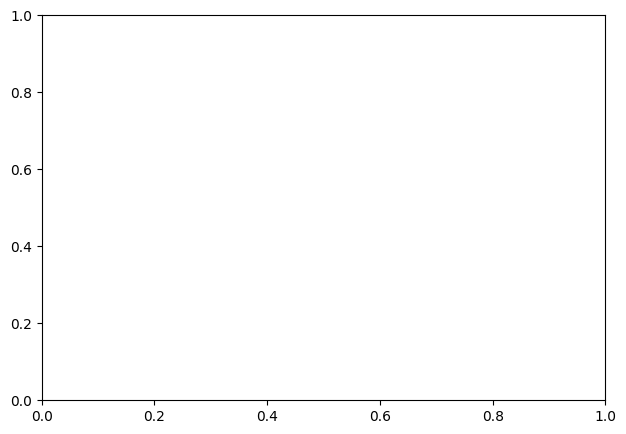

In [51]:

mean_refl_4sip = np.nanmean(refl_4sip_values, axis=0)
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_4sip_norm = cfad_refl_4sip / np.sum(cfad_refl_4sip, axis=0, keepdims=True) # normalized by height


mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec[mean_alt_ec_filt1 > 13.] = np.nan

height_bin_centers = 0.5 * (height_bins[:-1] + height_bins[1:])
high_alt_ind = np.where(height_bin_centers > 12)[0]
cfad_refl_ec[:, high_alt_ind] = np.nan

fnt = 14
lev = np.linspace(0., 10, 40)
plt.figure(figsize=(16, 5))

plt.subplot(1,2,1)
contour = plt.contourf(refl_ec_bins[:-1], alt_ec_bins[:-1], np.log(cfad_refl_ec.T), levels=lev, cmap='turbo')
plt.plot(median_refl_ec,mean_alt_ec_filt1, 'k-', linewidth=2, label='Median')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
#contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, (cfad_refl_4sip_normalized.T), levels=np.linspace(0., 0.4, 40), cmap='turbo')
plt.plot(median_refl_4sip, avg_alt_4sip, color='k', linewidth=2, label='Median')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 16:04-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
#cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

TypeError: Length of x (19) must match number of columns in z (24)

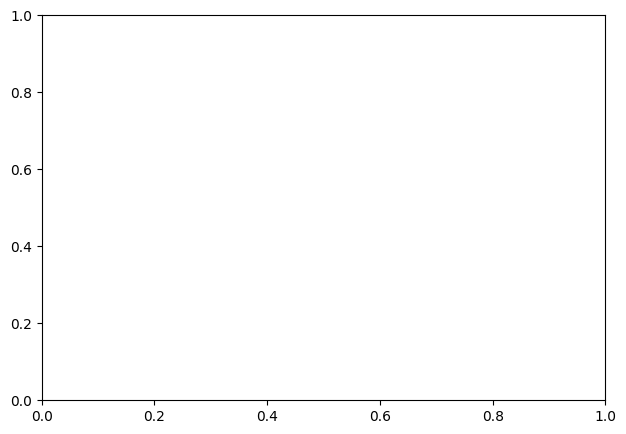

In [50]:

mean_refl_4sip = np.nanmean(refl_4sip_values, axis=0)
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

#cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec) # normalized by both refl and height
cfad_refl_4sip_norm = cfad_refl_4sip / np.sum(cfad_refl_4sip, axis=0, keepdims=True) # normalized by height


mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec[mean_alt_ec_filt1 > 13.] = np.nan

height_bin_centers = 0.5 * (height_bins[:-1] + height_bins[1:])
high_alt_ind = np.where(height_bin_centers > 12)[0]
cfad_refl_ec[:, high_alt_ind] = np.nan

fnt = 14
lev = np.linspace(0., 0.6, 40)
plt.figure(figsize=(16, 5))

plt.subplot(1,2,1)
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], (cfad_refl_ec_norm.T), levels=lev, cmap='turbo')
plt.plot(median_refl_ec, mean_alt_ec_filt1, 'k-', linewidth=2, label='Median')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
#contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, (cfad_refl_4sip_norm.T), levels=np.linspace(0., 0.4, 40), cmap='turbo')
plt.plot(median_refl_4sip, avg_alt_4sip, color='k', linewidth=2, label='Median')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 16:04-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
#cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
ds_icon

In [70]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

# === 1. Extract and preprocess data ===
# Replace "refl" and "z_mc" with actual variable names if different
refl = ds_icon['dbz']  # shape: (time, height, ncells)
altitude = ds_icon['z_mc'] * 1e-3  # Convert from meters to km

# Mask reflectivity values below a threshold (e.g., -10 dBZ)
refl = xr.where(refl > -10., refl, np.nan)

# === 2. Flatten data across time and cells ===
# Shape becomes: (time * ncells, height)
refl_flat = refl.transpose('time', 'height', 'ncells').values.reshape(-1, refl.shape[1])
alt_flat = altitude.transpose('time', 'height', 'ncells').values.reshape(-1, altitude.shape[1])

# === 3. Define histogram bins ===
refl_bins = np.linspace(-10, 50, 61)     # Reflectivity bins (e.g., from -10 to 50 dBZ in 1 dBZ steps)
alt_bins = np.linspace(0, 20, 81)        # Altitude bins in km (e.g., 0 to 20 km in 0.25 km steps)

# === 4. Build the 2D histogram (CFAD) ===
# Stack all height levels into a 1D array
refl_all = refl_flat.flatten()
alt_all = alt_flat.flatten()

# Remove NaNs
mask = ~np.isnan(refl_all) & ~np.isnan(alt_all)
refl_valid = refl_all[mask]
alt_valid = alt_all[mask]

# Create 2D histogram
cfad, refl_edges, alt_edges = np.histogram2d(
    refl_valid,
    alt_valid,
    bins=[refl_bins, alt_bins]
)

# === 5. Normalize to get frequency (per-altitude bin) ===
cfad_norm = cfad / cfad.sum(axis=0, keepdims=True)  # Normalize each altitude column

# === 6. Plotting the CFAD ===
plt.figure(figsize=(8, 6))
refl_centers = 0.5 * (refl_edges[:-1] + refl_edges[1:])
alt_centers = 0.5 * (alt_edges[:-1] + alt_edges[1:])

# Transpose so that x=refl, y=alt
plt.pcolormesh(refl_centers, alt_centers, cfad_norm.T, shading='auto', cmap='viridis')
plt.colorbar(label='Normalized Frequency')
plt.xlabel('Radar Reflectivity (dBZ)')
plt.ylabel('Altitude (km)')
plt.title('CFAD of Radar Reflectivity (ICON Composite)')
plt.grid(True)
plt.tight_layout()
plt.show()


ValueError: Dimensions {'time'} do not exist. Expected one or more of ('height', 'ncells')

## Normalized radar reflectivity CFAD

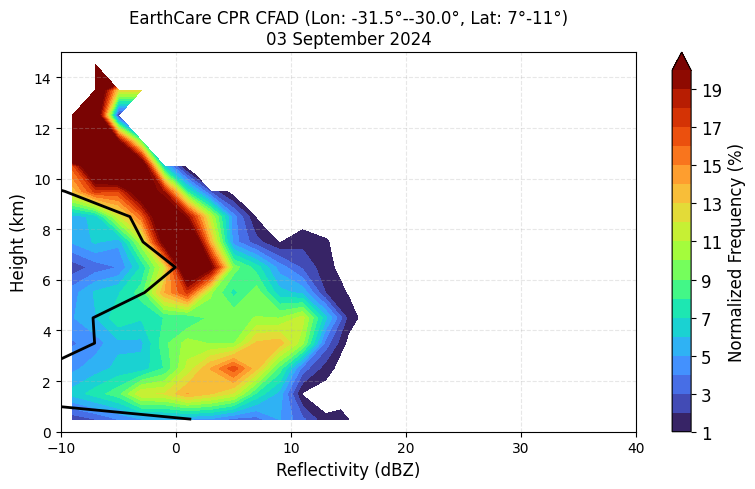

CFAD Statistics:
Total filtered profiles: 864
Total valid points: 114,587
Height range: 0.00 - 20.27 km
Reflectivity range: -68.56 - 35.45 dBZ
Max normalized frequency: 54.37%


In [95]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

# Load EarthCare CPR data
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'

with h5py.File(file, 'r') as f:
    binht_data = f['/ScienceData/Geo/binHeight']     # 2D (9782, 218)
    lon_data = f['/ScienceData/Geo/longitude']       # 1D (9782)
    lat_data = f['/ScienceData/Geo/latitude']        # 1D (9782)
    radar_fact_data = f['/ScienceData/Data/radarReflectivityFactor']  # 2D (9782, 218)
    
    # Read data into memory
    ht_m_ec = binht_data[:]
    lon_ec = lon_data[:]
    lat_ec = lat_data[:]
    radar_refl_ec = radar_fact_data[:]

# Filter fill values and invalid data
fill_val = 9.96921e+36
lon_ec = np.where(lon_ec == fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec == fill_val, np.nan, lat_ec)
ht_m_ec = np.where(ht_m_ec == fill_val, np.nan, ht_m_ec)
ht_m_ec = np.where(ht_m_ec <= 0, np.nan, ht_m_ec)
radar_refl_ec = np.where(radar_refl_ec == fill_val, np.nan, radar_refl_ec)
radar_refl_ec = np.where(radar_refl_ec <= 0, np.nan, radar_refl_ec)

# Convert to dBZ
refl_dbz_ec = 10. * np.log10(radar_refl_ec)

# Calculate mean height in km for each vertical bin
mean_ht_ec = 1.e-3 * np.nanmean(ht_m_ec, axis=0)

# Apply geographic filter
#lon_min_deg, lon_max_deg = -31.5, -30.0
#lat_min_deg, lat_max_deg = 7, 11
lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11
mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & 
        (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

# Filter data
refl_dbz_ec_filt = refl_dbz_ec[mask]  # Shape: (864, 218)
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]
ht_m_ec_filt = ht_m_ec[mask]  # Also filter height data

# Convert filtered height to km
ht_km_ec_filt = 1.e-3 * ht_m_ec_filt  # Shape: (864, 218)

# =====================================================
# Create CFAD (Contoured Frequency by Altitude Diagram)
# =====================================================

# Define bins
dbz_bins = np.arange(-10, 50, 2)   # 2 dBZ bins (typical for CFAD)
height_bins = np.arange(0, 20, 1)  # 1 km bins 

# Flatten arrays for histogram calculation
refl_obs_flat = refl_dbz_ec_filt.flatten()
height_obs_flat = ht_km_ec_filt.flatten()

# Remove invalid data (NaN, masked values, and inf)
valid_mask_obs = (~np.isnan(refl_obs_flat) & ~np.isnan(height_obs_flat) & 
                 ~np.isinf(refl_obs_flat) & ~np.isinf(height_obs_flat))
refl_obs_valid = refl_obs_flat[valid_mask_obs]
height_obs_valid = height_obs_flat[valid_mask_obs]

# Create 2D histogram
hist_obs_2d, height_obs_edges, dbz_obs_edges = np.histogram2d(
    height_obs_valid, refl_obs_valid,
    bins=[height_bins, dbz_bins]
)

# Normalize by altitude (each height level sums to 1)
# This is the key feature of CFAD diagrams
hist_obs_normalized = np.zeros_like(hist_obs_2d)
for i in range(hist_obs_2d.shape[0]):
    row_obs_sum = hist_obs_2d[i, :].sum()
    if row_obs_sum > 0:
        hist_obs_normalized[i, :] = hist_obs_2d[i, :] / row_obs_sum

# Convert to percentage
freq_percent_obs = hist_obs_normalized * 100

# Mask zeros for better visualization
freq_percent_obs_masked = np.ma.masked_where(freq_percent_obs == 0, freq_percent_obs)

# Calculate median reflectivity at each height level
median_dbz_obs = []
median_heights_obs = []
for i in range(len(height_bins)-1):
    h_min_obs = height_bins[i]
    h_max_obs = height_bins[i+1]
    mask_obs = (height_obs_valid >= h_min_obs) & (height_obs_valid < h_max_obs)
    
    if mask_ec.sum() > 0:
        median_val_obs = np.median(refl_obs_valid[mask_obs])
        median_dbz_obs.append(median_val_obs)
        median_heights_obs.append((h_min_obs + h_max_obs) / 2.)
        
# =====================================================
# Plot CFAD
# =====================================================

fnt = 12
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 5))

# Create meshgrid for plotting - use bin centers instead of edges
height_obs_centers = (height_obs_edges[:-1] + height_obs_edges[1:]) / 2
dbz_obs_centers = (dbz_obs_edges[:-1] + dbz_obs_edges[1:]) / 2
H_obs, D_obs = np.meshgrid(height_obs_centers, dbz_obs_centers)

# Filled contours
lev = np.linspace(1, 20, 20)

contourf = ax.contourf(D_obs, H_obs, freq_percent_obs_masked.T, 
                       levels=lev, 
                       cmap='turbo', 
                       extend='max')

ax.plot(median_dbz_obs, median_heights_obs, 'k-', linewidth=ln, zorder=11, label='Median')
# Colorbar
cbar = plt.colorbar(contourf, ax=ax, label='Normalized Frequency (%)')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency (%)', size=fnt)

# Labels and title
ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)
ax.set_ylabel('Height (km)', fontsize=fnt)
ax.set_title(f'EarthCare CPR CFAD (Lon: {lon_min_deg}°-{lon_max_deg}°, Lat: {lat_min_deg}°-{lat_max_deg}°)\n03 September 2024', 
             fontsize=fnt)

# Set reasonable axis limits
ax.set_xlim([-10, 40])
ax.set_ylim([0, 15])

# Grid
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

# =====================================================
# Print statistics
# =====================================================

print("CFAD Statistics:")
print(f"Total filtered profiles: {refl_dbz_ec_filt.shape[0]}")
print(f"Total valid points: {len(refl_ec_valid):,}")
print(f"Height range: {height_ec_valid.min():.2f} - {height_ec_valid.max():.2f} km")
print(f"Reflectivity range: {refl_ec_valid.min():.2f} - {refl_ec_valid.max():.2f} dBZ")
print(f"Max normalized frequency: {freq_percent_ec_masked.max():.2f}%")

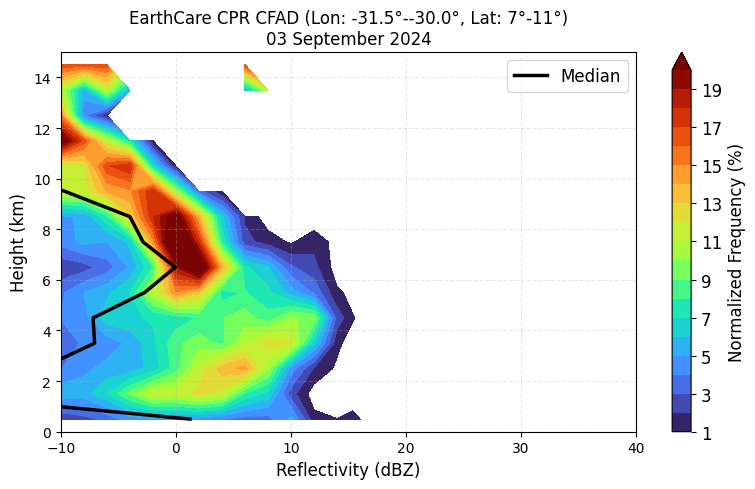

CFAD Statistics:
Total filtered profiles: 864
Total valid points: 114,587
Height range: 0.00 - 20.27 km
Reflectivity range: -68.56 - 35.45 dBZ
Max normalized frequency: 54.37%

Median profile points: 19
Median dBZ range: -39.38 - 1.21 dBZ


In [105]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

# Load EarthCare CPR data
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/radar/ECA_JXCA_CPR_NOM_1B_20240903T160523Z_20250207T021451Z_01520E.h5'

with h5py.File(file, 'r') as f:
    binht_data = f['/ScienceData/Geo/binHeight']     # 2D (9782, 218)
    lon_data = f['/ScienceData/Geo/longitude']       # 1D (9782)
    lat_data = f['/ScienceData/Geo/latitude']        # 1D (9782)
    radar_fact_data = f['/ScienceData/Data/radarReflectivityFactor']  # 2D (9782, 218)
    
    # Read data into memory
    ht_m_ec = binht_data[:]
    lon_ec = lon_data[:]
    lat_ec = lat_data[:]
    radar_refl_ec = radar_fact_data[:]

# Filter fill values and invalid data
fill_val = 9.96921e+36
lon_ec = np.where(lon_ec == fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec == fill_val, np.nan, lat_ec)
ht_m_ec = np.where(ht_m_ec == fill_val, np.nan, ht_m_ec)
ht_m_ec = np.where(ht_m_ec <= 0, np.nan, ht_m_ec)
radar_refl_ec = np.where(radar_refl_ec == fill_val, np.nan, radar_refl_ec)
radar_refl_ec = np.where(radar_refl_ec <= 0, np.nan, radar_refl_ec)

# Convert to dBZ
refl_dbz_ec = 10. * np.log10(radar_refl_ec)

# Calculate mean height in km for each vertical bin
mean_ht_ec = 1.e-3 * np.nanmean(ht_m_ec, axis=0)

# Apply geographic filter
lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11
mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & 
        (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

# Filter data
refl_dbz_ec_filt = refl_dbz_ec[mask]  # Shape: (864, 218)
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]
ht_m_ec_filt = ht_m_ec[mask]  # Also filter height data

# Convert filtered height to km
ht_km_ec_filt = 1.e-3 * ht_m_ec_filt  # Shape: (864, 218)

# =====================================================
# Create CFAD (Contoured Frequency by Altitude Diagram)
# =====================================================

# Define bins
dbz_bins = np.arange(-15, 50, 2)   # 2 dBZ bins (typical for CFAD)
height_bins = np.arange(0, 20, 1)  # 1 km bins 

# Flatten arrays for histogram calculation
refl_ec_flat = refl_dbz_ec_filt.flatten()
height_ec_flat = ht_km_ec_filt.flatten()

# Remove invalid data (NaN, masked values, and inf)
valid_mask_ec = (~np.isnan(refl_ec_flat) & ~np.isnan(height_ec_flat) & 
                 ~np.isinf(refl_ec_flat) & ~np.isinf(height_ec_flat))
refl_ec_valid = refl_ec_flat[valid_mask_ec]
height_ec_valid = height_ec_flat[valid_mask_ec]

# Create 2D histogram
hist_ec_2d, height_ec_edges, dbz_ec_edges = np.histogram2d(
    height_ec_valid, refl_ec_valid,
    bins=[height_bins, dbz_bins]
)

# Normalize by altitude (each height level sums to 1)
# This is the key feature of CFAD diagrams
hist_ec_normalized = np.zeros_like(hist_ec_2d)
for i in range(hist_ec_2d.shape[0]):
    row_ec_sum = hist_ec_2d[i, :].sum()
    if row_ec_sum > 0:
        hist_ec_normalized[i, :] = hist_ec_2d[i, :] / row_ec_sum

# Convert to percentage
freq_percent_ec = hist_ec_normalized * 100

# Mask zeros for better visualization
freq_percent_ec_masked = np.ma.masked_where(freq_percent_ec == 0, freq_percent_ec)

# Calculate median reflectivity at each height level
median_dbz_ec = []
median_heights_ec = []
for i in range(len(height_bins)-1):
    h_min_ec = height_bins[i]
    h_max_ec = height_bins[i+1]
    mask_ec = (height_ec_valid >= h_min_ec) & (height_ec_valid < h_max_ec)
    
    if mask_ec.sum() > 0:
        median_val_ec = np.median(refl_ec_valid[mask_ec])
        median_dbz_ec.append(median_val_ec)
        median_heights_ec.append((h_min_ec + h_max_ec) / 2.)
        
# =====================================================
# Plot CFAD
# =====================================================

fnt = 12
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 5))

# Create meshgrid for plotting - use bin centers instead of edges
height_ec_centers = (height_ec_edges[:-1] + height_ec_edges[1:]) / 2
dbz_ec_centers = (dbz_ec_edges[:-1] + dbz_ec_edges[1:]) / 2
H_ec, D_ec = np.meshgrid(height_ec_centers, dbz_ec_centers)

# Filled contours
lev = np.linspace(1, 20, 20)

contourf = ax.contourf(D_ec, H_ec, freq_percent_ec_masked.T, 
                       levels=lev, 
                       cmap='turbo', 
                       extend='max')

# Plot median line
if len(median_dbz_ec) > 0:
    ax.plot(median_dbz_ec, median_heights_ec, 'k-', linewidth=2.5, label='Median')
    ax.legend(fontsize=fnt, loc='upper right')

# Colorbar
cbar = plt.colorbar(contourf, ax=ax, label='Normalized Frequency (%)')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency (%)', size=fnt)

# Labels and title
ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)
ax.set_ylabel('Height (km)', fontsize=fnt)
ax.set_title(f'EarthCare CPR CFAD (Lon: {lon_min_deg}°-{lon_max_deg}°, Lat: {lat_min_deg}°-{lat_max_deg}°)\n03 September 2024', 
             fontsize=fnt)

# Set reasonable axis limits
ax.set_xlim([-10, 40])
ax.set_ylim([0, 15])

# Grid
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

# =====================================================
# Print statistics
# =====================================================

print("CFAD Statistics:")
print(f"Total filtered profiles: {refl_dbz_ec_filt.shape[0]}")
print(f"Total valid points: {len(refl_ec_valid):,}")
print(f"Height range: {height_ec_valid.min():.2f} - {height_ec_valid.max():.2f} km")
print(f"Reflectivity range: {refl_ec_valid.min():.2f} - {refl_ec_valid.max():.2f} dBZ")
print(f"Max normalized frequency: {freq_percent_ec_masked.max():.2f}%")
print(f"\nMedian profile points: {len(median_dbz_ec)}")
if len(median_dbz_ec) > 0:
    print(f"Median dBZ range: {min(median_dbz_ec):.2f} - {max(median_dbz_ec):.2f} dBZ")

In [98]:
lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan


# Flatten refl to 1D
refl_flat = refl_ec_filt1.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

In [56]:
lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip_hfreq.clon > lon_min) & (ds_4sip_hfreq.clon < lon_max) &
    (ds_4sip_hfreq.clat > lat_min) & (ds_4sip_hfreq.clat < lat_max)
)



stime='2024-09-03T16:04:00.000000000'
etime='2024-09-03T16:16:00.000000000'

ds_4sip_filt = ds_4sip_hfreq.sel(time=slice(stime,etime)).load()
ds_4sip_filt = ds_4sip_filt.where(mask)

filt_refl_4sip = xr.where(ds_4sip_filt.dbz > -10., ds_4sip_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_4sip_filt.z_mc

refl_4sip_flat = filt_refl_4sip.values.flatten()
height_4sip_flat = alt_4sip_km.values.flatten()

-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


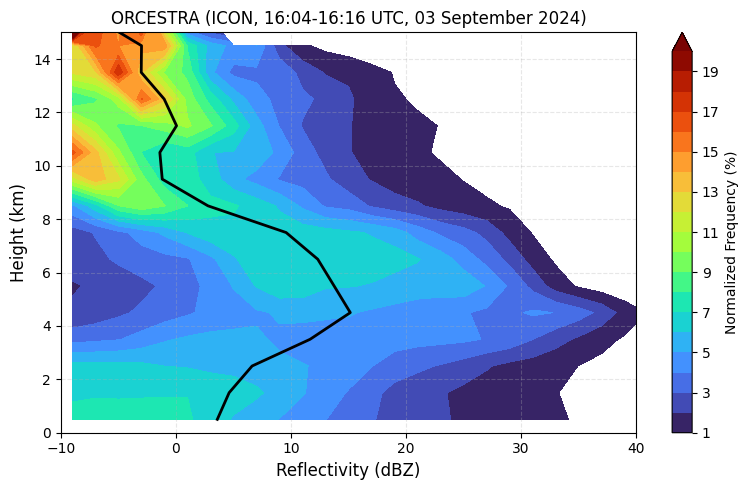

In [70]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr



# Remove invalid data (NaN values)
valid_4sip_mask = ~np.isnan(refl_4sip_flat) & ~np.isnan(height_4sip_flat)  
refl_4sip_valid = refl_4sip_flat[valid_4sip_mask]
height_4sip_valid = height_4sip_flat[valid_4sip_mask]

# =====================================================
# Create CFAD for ICON data
# =====================================================

# Define bins (same as radar CFAD for comparison)
dbz_bins = np.arange(-10, 50, 2)  # 2 dBZ bins
height_bins = np.arange(0, 20, 1.0)  # 400 m bins (0.4 km)

# Create 2D histogram
hist_4sip_2d, height_4sip_edges, dbz_4sip_edges = np.histogram2d(
    height_4sip_valid, refl_4sip_valid,
    bins=[height_bins, dbz_bins]
)

# Normalize by altitude (each height level sums to 1)
hist_4sip_normalized = np.zeros_like(hist_4sip_2d)
for i in range(hist_4sip_2d.shape[0]):
    row_sum_4sip = hist_4sip_2d[i, :].sum()
    if row_sum_4sip > 0:
        hist_4sip_normalized[i, :] = hist_4sip_2d[i, :] / row_sum_4sip

# Convert to percentage
freq_percent_4sip = hist_4sip_normalized * 100

# Mask zeros for better visualization
freq_percent_masked_4sip = np.ma.masked_where(freq_percent_4sip == 0, freq_percent_4sip)

# =====================================================
# Calculate median and mode
# =====================================================

# Calculate median reflectivity at each height bin
median_dbz_4sip = []
median_heights_4sip = []
for i in range(len(height_bins)-1):
    h_min_4sip = height_bins[i]
    h_max_4sip = height_bins[i+1]
    mask_4sip = (height_4sip_valid >= h_min_4sip) & (height_4sip_valid < h_max_4sip)
    
    if mask_4sip.sum() > 0:
        median_val_4sip = np.median(refl_4sip_valid[mask_4sip])
        median_dbz_4sip.append(median_val_4sip)
        median_heights_4sip.append((h_min_4sip + h_max_4sip) / 2.)

# Find mode (most frequent reflectivity) at each height
mode_dbz_4sip = []
mode_heights_4sip = []
for i in range(len(height_bins)-1):
    if hist_4sip_normalized[i, :].sum() > 0:
        max_idx_4sip = np.argmax(hist_4sip_normalized[i, :])
        mode_dbz_4sip.append((dbz_bins[max_idx_4sip] + dbz_bins[max_idx_4sip+1]) / 2)
        mode_heights_4sip.append((height_bins[i] + height_bins[i+1]) / 2)

# =====================================================
# Plot CFAD
# =====================================================
fnt=12;
ln=2;

lev=np.linspace(1,20,20)

fig, ax = plt.subplots(figsize=(8, 5))

# Create meshgrid for plotting - use bin centers
height_4sip_centers = (height_4sip_edges[:-1] + height_4sip_edges[1:]) / 2
dbz_4sip_centers = (dbz_4sip_edges[:-1] + dbz_4sip_edges[1:]) / 2
H_4sip, D_4sip = np.meshgrid(height_4sip_centers, dbz_4sip_centers)

# Filled contours
levels = np.arange(0, freq_percent_masked_4sip.max() + 1, 1)  # 1% intervals
contourf = ax.contourf(D_4sip, H_4sip, freq_percent_masked_4sip.T, 
                       levels=lev, 
                       cmap='turbo', 
                       extend='max')


ax.plot(median_dbz_4sip, median_heights_4sip, 'k-', linewidth=ln, zorder=11, label='Median')

# Add contour lines for clarity
#contour_lines = ax.contour(D, H, freq_percent_masked.T, 
#                           levels=[1, 2, 5, 10, 15, 20], 
#                           colors='black', 
#                           linewidths=0.5, 
#                           alpha=0.5)
#ax.clabel(contour_lines, inline=True, fontsize=fnt, fmt='%d%%')

# Plot mode and median lines
#ax.plot(mode_dbz, mode_heights, 'k-', linewidth=2.5, label='Mode', zorder=10)
#ax.plot(median_dbz, median_heights, 'w-', linewidth=2.5, zorder=11)
#ax.plot(median_dbz, median_heights, 'r--', linewidth=2, label='Median', zorder=12)

# Colorbar
cbar = plt.colorbar(contourf, ax=ax, label='Normalized Frequency (%)')

# Labels and title
ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)#, fontweight='bold')
ax.set_ylabel('Height (km)', fontsize=fnt)#, fontweight='bold')
ax.set_title('ORCESTRA (ICON, 16:04-16:16 UTC, 03 September 2024)', fontsize=fnt)#, fontweight='bold')

# Set reasonable axis limits
ax.set_xlim([-10, 40])
ax.set_ylim([0, 15])

# Grid and legend
ax.grid(True, alpha=0.3, linestyle='--')
#ax.legend(loc='upper right', framealpha=0.9)

plt.tight_layout()
plt.show()


# =====================================================
# Print statistics
# =====================================================

#print("CFAD Statistics (ICON 4SIP):")
#print(f"Total valid points: {len(refl_valid):,}")
#print(f"Height range: {height_valid.min():.2f} - {height_valid.max():.2f} km")
#print(f"Reflectivity range: {refl_valid.min():.2f} - {refl_valid.max():.2f} dBZ")
#print(f"Max normalized frequency: {freq_percent_masked.max():.2f}%")
#print(f"Time steps: {refl_icon.shape[0]}")
#print(f"Height levels: {refl_icon.shape[1]}")
#print(f"Number of cells: {refl_icon.shape[2]}")

In [109]:
H_obs

array([[ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5],
       [ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        1

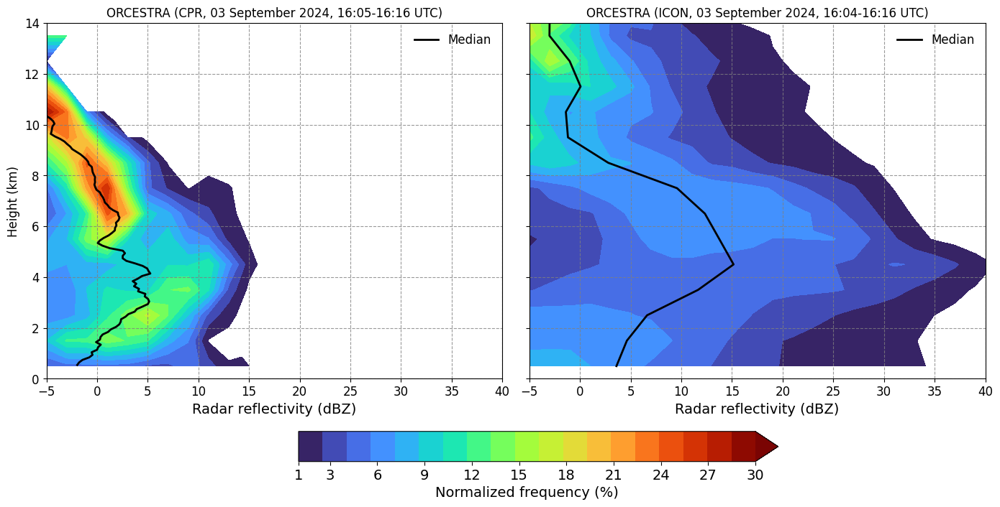

In [112]:
import numpy as np
import matplotlib.pyplot as plt

mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec1 = median_refl_ec
median_refl_ec1[mean_alt_ec_filt1 > 11] = np.nan
median_refl_ec1[mean_alt_ec_filt1 < 0.5] = np.nan

# Create data (make sure D_obs, H_obs, freq_percent_obs_masked, etc. are defined)
lev = np.linspace(1, 30, 20)

fnt = 12
ln=2;

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# First subplot (DCMEX Observations)
cnt1 = ax1.contourf(D_obs, H_obs, freq_percent_obs_masked.T, 
                        levels=lev, 
                        cmap='turbo', 
                        extend='max')

# Colorbar for first subplot
#cbar1 = plt.colorbar(contourf, ax=ax1, label='Normalized Frequency (%)')
#cbar1.ax.tick_params(labelsize=fnt)
#cbar1.set_label(label='Normalized Frequency (%)', size=fnt)

#ax1.plot(median_dbz_obs, median_heights_obs, 'k-', linewidth=ln, zorder=11, label='Median')
ax1.plot(median_refl_ec1, mean_alt_ec_filt1, 'k-', linewidth=ln, zorder=11, label='Median')

# Labels and title for first subplot
ax1.set_xlabel('Radar reflectivity (dBZ)', fontsize=fnt+2)
ax1.set_ylabel('Height (km)', fontsize=fnt)   # ASL
ax1.set_title('ORCESTRA (CPR, 03 September 2024, 16:05-16:16 UTC)', fontsize=fnt)

# Set reasonable axis limits for first subplot
ax1.set_xlim([-5, 40])
ax1.set_ylim([0, 14])
ax1.set_xticks([-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
ax1.set_yticks([0, 2, 4, 6, 8, 10, 12, 14])

ax1.tick_params(axis='x', labelsize=fnt)
ax1.tick_params(axis='y', labelsize=fnt)

# Grid for first subplot
ax1.grid(True, linestyle='--', color='grey', alpha=0.8)
ax1.legend(frameon=False, loc='best', fontsize=fnt)

# Second subplot (ICON Simulation)
cnt2 = ax2.contourf(D_4sip, H_4sip, freq_percent_masked_4sip.T, 
                        levels=lev, 
                        cmap='turbo', 
                        extend='max')


ax2.plot(median_dbz_4sip, median_heights_4sip, 'k-', linewidth=ln, zorder=11, label='Median')

# Colorbar for second subplot
#cbar2 = plt.colorbar(contourf, ax=ax2, label='Normalized Frequency (%)')

# Labels and title for second subplot
ax2.set_xlabel('Radar reflectivity (dBZ)', fontsize=fnt+2)
#ax2.set_ylabel('Height (km)', fontsize=fnt)
ax2.set_title('ORCESTRA (ICON, 03 September 2024, 16:04-16:16 UTC)', fontsize=fnt)

# Set reasonable axis limits for second subplot
ax2.set_xlim([-5, 40])
ax2.set_ylim([0, 14])
ax2.set_xticks([-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
ax2.set_yticks([0, 2, 4, 6, 8, 10, 12, 14])

ax2.set_yticklabels([])

ax2.tick_params(axis='x', labelsize=fnt)

# Grid for second subplot
ax2.grid(True, linestyle='--', color='grey', alpha=0.8)
ax2.legend(frameon=False, loc='best', fontsize=fnt)

fig = plt.gcf()  # Get the current figure
#cbar_ax1 = fig.add_axes([0.25, 0.25, 0.5, 0.04])  # [left, bottom, width, height]
cbar_ax1 = fig.add_axes([0.3, -0.08, 0.5, 0.07])
cbar = fig.colorbar(cnt2, cax=cbar_ax1, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20], orientation='horizontal')
cbar = fig.colorbar(cnt2, cax=cbar_ax1, ticks=[1, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30], orientation='horizontal')
cbar.set_label('Normalized frequency (%)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

# Adjust layout for better spacing between subplots
plt.tight_layout()

# Show plot
plt.show()


## Radar with high frequency ICON output

In [73]:
lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip_hfreq.clon > lon_min) & (ds_4sip_hfreq.clon < lon_max) &
    (ds_4sip_hfreq.clat > lat_min) & (ds_4sip_hfreq.clat < lat_max)
)

#n_true = mask.sum().compute().item()
#print("Number of True:", n_true)

ds_icon_hf = ds_4sip_hfreq.where(mask)

#clon = np.rad2deg(ds_icon_hf.clon.values)
#clat = np.rad2deg(ds_icon_hf.clat.values)

clon = ds_icon_hf.clon.values
clat = ds_icon_hf.clat.values

#print(clat)

lat_mask = (clat > lat_min) & (clat < lat_max)
#print(lat_mask.sum().item())

ds_filt_hf = ds_icon_hf.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:16:00.000000000'))
dbz_filt_hf = ds_filt_hf.dbz.mean(dim=('time'))

alt_km_filt = ds_filt_hf.z_mc.mean(dim=('time','ncells'))

dbz_latband_hf = dbz_filt_hf[:, lat_mask]
clon_latband_hf = clon[lat_mask]

dbz_latband_hf = xr.where(dbz_filt_hf > -10., dbz_filt_hf, np.nan)
#plt.contourf()
#ds_icon

-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


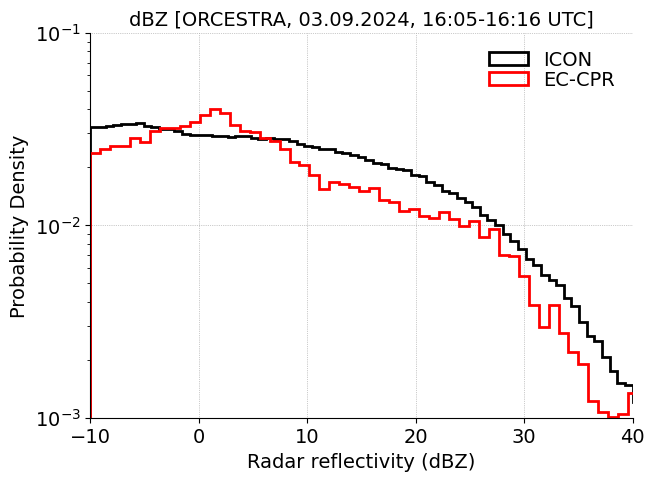

In [77]:

ds_filt_hf = ds_icon_hf.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:16:00.000000000'))

refl_4sip1600_hf = ds_filt_hf.dbz.mean(dim=('time')).values

refl_4sip1600_hf = refl_4sip1600_hf.ravel()
refl_4sip1600_hf = refl_4sip1600_hf[refl_4sip1600_hf > -10]

refl_ec1600 = refl_dbz_ec_filt
refl_ec1600 = refl_ec1600.ravel()
refl_ec1600 = refl_ec1600[refl_ec1600 > -10]
#cler_w_4sip1200[cler_w_4sip1200 <= 0] = np.nan

fnt = 14;
ln = 2;
plt.figure(figsize=(7,5))
plt.hist(refl_4sip1600_hf, bins=100, density=True, histtype='step', edgecolor='black', linewidth=ln, label='ICON', alpha=1)
plt.hist(refl_ec1600, bins=100, density=True, histtype='step', edgecolor='red', linewidth=ln, label='EC-CPR', alpha=1)
plt.xlim(-10,40.0)
plt.yscale('log')
plt.ylim(1.e-3,1.e-1)
plt.xlabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Probability Density', fontsize=fnt)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.title('dBZ [ORCESTRA, 03.09.2024, 16:05-16:16 UTC]', fontsize=fnt)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

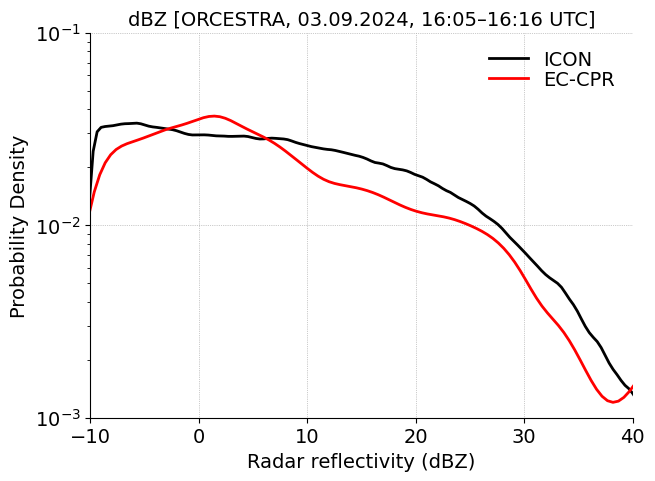

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#ds_filt_hf = ds_icon_hf.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:16:00.000000000'))

#refl_4sip1600_hf = ds_filt_hf.dbz.mean(dim=('time')).values

#refl_4sip1600_hf = refl_4sip1600_hf.ravel()
#refl_4sip1600_hf = refl_4sip1600_hf[refl_4sip1600_hf > -10]

refl_ec1600 = refl_dbz_ec_filt
refl_ec1600 = refl_ec1600.ravel()
refl_ec1600 = refl_ec1600[refl_ec1600 > -10]

fnt = 14
ln = 2
plt.figure(figsize=(7, 5))

# KDE plots
sns.kdeplot(refl_4sip1600_hf, bw_adjust=0.5, label='ICON', color='black', linewidth=ln)
sns.kdeplot(refl_ec1600, bw_adjust=0.5, label='EC-CPR', color='red', linewidth=ln)

plt.xlim(-10, 40.0)
plt.yscale('log')
plt.ylim(1.e-3, 1.e-1)
plt.xlabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Probability Density', fontsize=fnt)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.title('dBZ [ORCESTRA, 03.09.2024, 16:05–16:16 UTC]', fontsize=fnt)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()


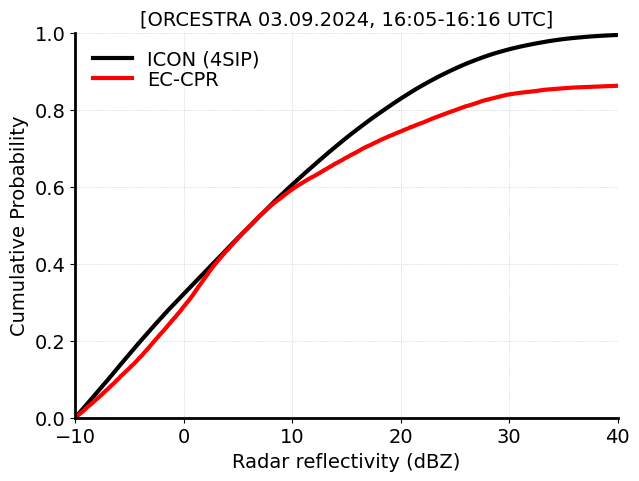

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


#clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
#clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

#clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
#clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

#clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
#clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

fnt = 14;
ln = 3;
# CDF Plot
plt.figure(figsize=(7, 5))
#plt.subplot(1,2,1)
for data, label, color in [
    (refl_4sip1600_hf, 'ICON (4SIP)', 'k'),
    (refl_ec1600, 'EC-CPR', 'r')
]:
    sorted_data = np.sort(data[~np.isnan(data)])
    cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
    plt.plot(sorted_data, cdf, label=label, color=color, linewidth=ln)

plt.xlim(-10, 40.0) 
plt.ylim(0, 1.0); 
plt.xticks([-10, 0, 10, 20, 30, 40], fontsize=fnt)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=fnt)
plt.xlabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Cumulative Probability', fontsize=fnt)
plt.title('[ORCESTRA 03.09.2024, 16:05-16:16 UTC]',fontsize=fnt)
#plt.title('CDF Comparison of CLWP Distributions')
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.show()


# Precipitation amount

Shape of radar_fact_data: (3600, 1800)

radar_fact_Attributes:
  DimensionNames: b'nlon,nlat'
  Units: b'mm/hr'
  units: b'mm/hr'
  _FillValue: -9999.900390625
  CodeMissingValue: b'-9999.9'
(3600, 1800)


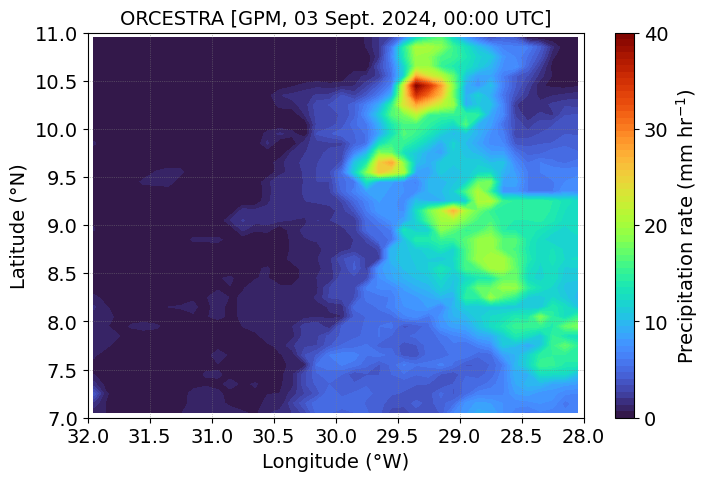

In [105]:
import pyart

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/precip_amount/GPMMRG_MAP_2409030000_H_L3S_MCH_04J.h5'
with h5py.File(file, 'r') as f:
    precip_rate_data = f['/Grid/hourlyPrecipRate']     # 2D (3600, 1800) 
    precip_rateGC_data = f['/Grid/hourlyPrecipRateGC']     # 2D (3600, 1800) 
    lon_data = f['/Grid/Longitude']       #  2D (3600, 1800) [-180., 180]                        
    lat_data = f['/Grid/Latitude']        #  2D (3600, 1800) [-90., 90]
    
    #print("Shape of binht_data:", binht_data.shape)
    #print("Dim of binht_data:", lon_data.ndim)
    #print("Dim of binht_data:", lat_data.dtype)
    #print()
    
    print("Shape of radar_fact_data:", precip_rate_data.shape)

    precip_rate_ec = precip_rate_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    precip_rateGC_ec = precip_rateGC_data[:]
    lon_ec = lon_data[:]
    lat_ec = lat_data[:]
    #radar_refl_ec = radar_fact_data[:]
    
    # Attributes
    print("\nradar_fact_Attributes:")
    for key, val in precip_rate_data.attrs.items():
        print(f"  {key}: {val}")


#print(lon_ec.shape)
fill_val = -9999.9;

lon_ec = np.where(lon_ec <= fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec <= fill_val, np.nan, lat_ec)
precip_rate_ec = np.where(precip_rate_ec <= fill_val, np.nan, precip_rate_ec)

mean_lon_ec = np.nanmean(lon_ec, axis=1)
mean_lat_ec = np.nanmean(lat_ec, axis=0)

#print(np.nanmin(precip_rate_ec), np.nanmax(precip_rate_ec))
#print(np.min(mean_lon_ec), np.max(mean_lon_ec))
#print(np.min(mean_lat_ec), np.max(mean_lat_ec))

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_min, lon_max = -32., -28.;
lat_min, lat_max = 7., 11.;


lon2d, lat2d = np.meshgrid(mean_lon_ec, mean_lat_ec, indexing='ij')
prec_mask = ((lon2d >= lon_min) & (lon2d <= lon_max) & 
             (lat2d >= lat_min) & (lat2d <= lat_max))

orcestra_lon_ec = np.where(prec_mask, lon_ec, np.nan)
orcestra_lat_ec = np.where(prec_mask, lat_ec, np.nan)

mean_orcestra_lon_ec = np.nanmean(orcestra_lon_ec, axis=1)
mean_orcestra_lat_ec = np.nanmean(orcestra_lat_ec, axis=0)

print(precip_rate_ec.shape)
orcestra_precip_rate_ec = np.where(prec_mask, precip_rate_ec, np.nan)
#print(orcestra_precip_rate_ec)

lev = np.linspace(0,40,60)
plt.figure(figsize=(8,5))
cnt=plt.contourf(-1*mean_orcestra_lon_ec, mean_orcestra_lat_ec, orcestra_precip_rate_ec.T, levels=lev, cmap='turbo');
plt.xlim(32, 28)
plt.ylim(7, 11)

#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [GPM, 03 Sept. 2024, 00:00 UTC]", fontsize=fnt)

cbar = plt.colorbar(cnt, ticks=[0, 10, 20, 30, 40], label='Precipitation rate (mm hr$^{-1}$)', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Precipitation rate (mm hr$^{-1}$)', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
plt.show()

In [11]:

files = sorted(glob.glob('/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/precip_amount/GPMMRG_MAP_240903*.h5'))

# Initialize arrays to hold all data
precip_rate_ec_all = []
precip_rateGC_ec_all = []

for i, file in enumerate(files):
    with h5py.File(file, 'r') as f:
        # Read data for this hour
        precip_rate_data = f['/Grid/hourlyPrecipRate'][:]
        precip_rateGC_data = f['/Grid/hourlyPrecipRateGC'][:]
        
        lon_data = f['/Grid/Longitude']       #  2D (3600, 1800) [-180., 180]                        
        lat_data = f['/Grid/Latitude']        #  2D (3600, 1800) [-90., 90]
        

        precip_rate_ec = precip_rate_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
        precip_rateGC_ec = precip_rateGC_data[:]
        lon_ec = lon_data[:]
        lat_ec = lat_data[:]
        
        # Append to list (will create a list of 2D arrays)
        precip_rate_ec_all.append(precip_rate_ec)
        precip_rateGC_ec_all.append(precip_rateGC_ec)

# Convert lists to 3D NumPy arrays (shape: 3600 x 1800 x 24)
precip_rate_ec_3d = np.stack(precip_rate_ec_all, axis=2)
precip_rateGC_ec_3d = np.stack(precip_rateGC_ec_all, axis=2)

print(precip_rate_ec_3d.shape)  # Should output (3600, 1800, 24)


fill_val = -9999.9;

lon_ec = np.where(lon_ec <= fill_val, np.nan, lon_ec)
lat_ec = np.where(lat_ec <= fill_val, np.nan, lat_ec)
precip_rate_ec_3d = np.where(precip_rate_ec_3d <= fill_val, np.nan, precip_rate_ec_3d)

mean_lon_ec = np.nanmean(lon_ec, axis=1)
mean_lat_ec = np.nanmean(lat_ec, axis=0)

#print(np.nanmin(precip_rate_ec), np.nanmax(precip_rate_ec))
#print(np.min(mean_lon_ec), np.max(mean_lon_ec))
#print(np.min(mean_lat_ec), np.max(mean_lat_ec))

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_min, lon_max = -32., -28.;
lat_min, lat_max = 7., 11.;


lon2d, lat2d = np.meshgrid(mean_lon_ec, mean_lat_ec, indexing='ij')
prec_mask = ((lon2d >= lon_min) & (lon2d <= lon_max) & 
             (lat2d >= lat_min) & (lat2d <= lat_max))

prec_mask_3d = prec_mask[:, :, np.newaxis]

orcestra_precip_rate_ec_3d = np.where(prec_mask_3d, precip_rate_ec_3d, np.nan)

orcestra_lon_ec = np.where(prec_mask, lon_ec, np.nan)
orcestra_lat_ec = np.where(prec_mask, lat_ec, np.nan)

mean_orcestra_lon_ec = np.nanmean(orcestra_lon_ec, axis=1)
mean_orcestra_lat_ec = np.nanmean(orcestra_lat_ec, axis=0)

print(orcestra_precip_rate_ec_3d.shape)




(3600, 1800, 25)
(3600, 1800, 25)


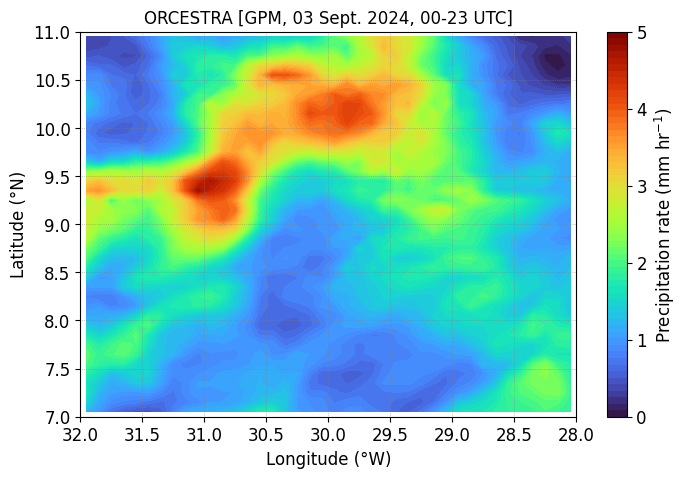

In [11]:

orcestra_mean_prec_rate_24hr = np.nanmean(orcestra_precip_rate_ec_3d, axis=2)

fnt=12
plt.style.use('default')
lev = np.linspace(0,5,60)
plt.figure(figsize=(8,5))
cnt=plt.contourf(-1*mean_orcestra_lon_ec, mean_orcestra_lat_ec, orcestra_mean_prec_rate_24hr.T, levels=lev, cmap='turbo');
plt.xlim(32, 28)
plt.ylim(7, 11)

#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [GPM, 03 Sept. 2024, 00-23 UTC]", fontsize=fnt)

cbar = plt.colorbar(cnt, ticks=[0, 1, 2, 3, 4, 5], label='Precipitation rate (mm hr$^{-1}$)', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Precipitation rate (mm hr$^{-1}$)', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
plt.show()

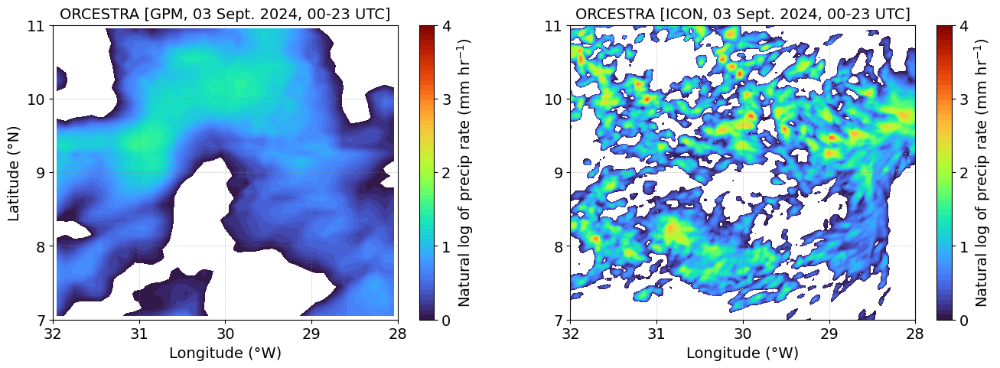

In [108]:

#ds_4sip['precip_rate'] = 0.5*ds_4sip.tot_prec.diff('time')

ds_4sip['precip_rate'] = (1./0.5)*ds_4sip.tot_prec.diff('time') # output is half-hourly

fnt = 14;
lev = np.linspace(0,4,60)


plt.figure(figsize=(16,5))

plt.subplot(1,2,1)
cnt=plt.contourf(-1*mean_orcestra_lon_ec, mean_orcestra_lat_ec, np.log(orcestra_mean_prec_rate_24hr.T), levels=lev, cmap='turbo');

plt.xlim(32, 28)
plt.ylim(7, 11)

plt.xticks([32, 31, 30, 29, 28], fontsize=fnt)
plt.yticks([7, 8, 9, 10, 11], fontsize=fnt)


plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [GPM, 03 Sept. 2024, 00-23 UTC]", fontsize=fnt)

#ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], 
cbar = plt.colorbar(cnt, ticks=[0, 1, 2, 3, 4], orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of precip rate (mm hr$^{-1}$)', size=fnt)

#plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
#plt.gca().spines['bottom'].set_linewidth(2)
#plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
cnt=plt.tricontourf(-1*np.rad2deg(ds_4sip.clon), np.rad2deg(ds_4sip.clat), np.log(ds_4sip.precip_rate.mean('time').T), levels=lev, cmap='turbo');
plt.xlim(32, 28)
plt.ylim(7, 11)

plt.xticks([32, 31, 30, 29, 28], fontsize=fnt)
plt.yticks([7, 8, 9, 10, 11], fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
#plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 00-23 UTC]", fontsize=fnt)

cbar = plt.colorbar(cnt, ticks=[0, 1, 2, 3, 4], orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of precip rate (mm hr$^{-1}$)', size=fnt)

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
#plt.gca().spines['bottom'].set_linewidth(2)
#plt.gca().spines['left'].set_linewidth(2)
plt.show()

In [227]:
ds_4sip.time

<xarray.DataArray 'time' (time: 41)> Size: 328B
array(['2024-09-03T00:00:00.000000000', '2024-09-03T00:30:00.000000000',
       '2024-09-03T01:00:00.000000000', '2024-09-03T01:30:00.000000000',
       '2024-09-03T02:00:00.000000000', '2024-09-03T02:30:00.000000000',
       '2024-09-03T03:00:00.000000000', '2024-09-03T03:30:00.000000000',
       '2024-09-03T04:00:00.000000000', '2024-09-03T04:30:00.000000000',
       '2024-09-03T05:00:00.000000000', '2024-09-03T05:30:00.000000000',
       '2024-09-03T06:00:00.000000000', '2024-09-03T06:30:00.000000000',
       '2024-09-03T07:00:00.000000000', '2024-09-03T07:30:00.000000000',
       '2024-09-03T08:00:00.000000000', '2024-09-03T08:30:00.000000000',
       '2024-09-03T09:00:00.000000000', '2024-09-03T09:30:00.000000000',
       '2024-09-03T10:00:00.000000000', '2024-09-03T10:30:00.000000000',
       '2024-09-03T11:00:00.000000000', '2024-09-03T11:30:00.000000000',
       '2024-09-03T12:00:00.000000000', '2024-09-03T12:30:00.000000000',
       '2024-09-03T13:00:00.000000000', '2024-09-03T13:30:00.000000000',
       '2024-09-03T14:00:00.000000000', '2024-09-03T14:30:00.000000000',
       '2024-09-03T15:00:00.000000000', '2024-09-03T15:30:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T16:30:00.000000000',
       '2024-09-03T17:00:00.000000000', '2024-09-03T17:30:00.000000000',
       '2024-09-03T18:00:00.000000000', '2024-09-03T18:30:00.000000000',
       '2024-09-03T19:00:00.000000000', '2024-09-03T19:30:00.000000000',
       '2024-09-03T20:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 328B 2024-09-03 ... 2024-09-03T20:00:00

In [20]:
from datetime import timedelta

start_str = '2024-09-03T00:00:00.000000000'
end_str   = '2024-09-03T23:00:00.000000000'

# Parse to datetime objects (ignore nanoseconds for datetime)
start_time = datetime.strptime(start_str[:19], '%Y-%m-%dT%H:%M:%S')
end_time   = datetime.strptime(end_str[:19], '%Y-%m-%dT%H:%M:%S')

# Calculate number of hours 
nhr = int((end_time - start_time).total_seconds() // 3600) + 1

# Generate list of datetime objects for each hour
time_list = [start_time + timedelta(hours=h) for h in range(nhr)]

# Format as ISO strings with nanoseconds
orcestra_time = [dt.strftime('%Y-%m-%dT%H:%M:%S.') + '000000000' for dt in time_list]

orcestra_time = [datetime.strptime(t[:19], "%Y-%m-%dT%H:%M:%S") for t in orcestra_time]
#orcestra_time

In [21]:

del_prec_4sip = ds_4sip.tot_prec.diff('time')

precip_rate_4sip = del_prec_4sip/0.5


# GPM accumulated precipitation
precip_rate_gpm = ds_gpm_orc.precip_rate.mean(dim=('lon', 'lat'))
acc_precip_gpm = precip_rate_gpm.cumsum(dim='time')

#plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'k--', linewidth=lnwdth, label='GPM-Obs')


In [22]:

mean_ht_4sip = ds_4sip.z_mc.mean(dim=('time','ncells'))
mean_inc_perl_4sip = ds_4sip.inc_perl.mean(dim=('time','ncells'))

mean_inc_perl_4sip = mean_inc_perl_4sip.values
mean_ht_4sip = mean_ht_4sip.values

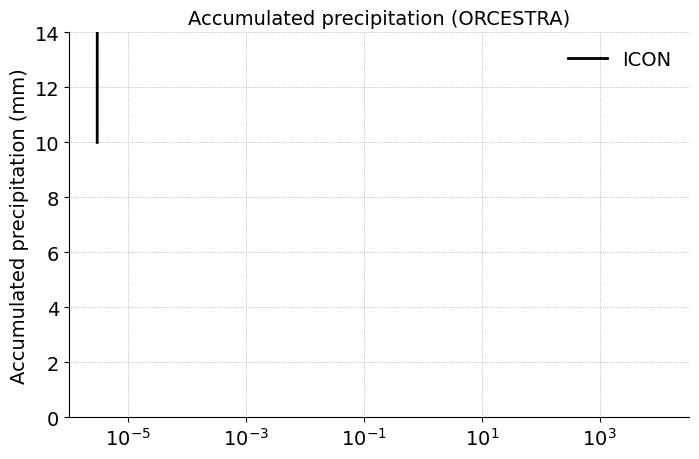

In [26]:


mean_ht_4sip = ds_4sip.z_mc.mean(dim=('time','ncells'))
mean_inc_perl_4sip = ds_4sip.inc_perl.mean(dim=('time','ncells'))
tot_acc_prec_2Sept15utc = ds_4sip_2Sept15utc.tot_prec.mean(dim=('ncells'))
tot_acc_prec_2Sept18utc = ds_4sip_2Sept18utc.tot_prec.mean(dim=('ncells'))
tot_acc_prec_2Sept00utc = ds_4sip_2Sept00utc.tot_prec.mean(dim=('ncells'))

std_inc_perl_4sip = ds_4sip.inc_perl.std(dim=('time','ncells'))
sem_inc_perl_4sip = std_inc_perl_4sip/np.sqrt(ds_4sip.dims['ncells']*ds_4sip.dims['time']) # std err of mean

neg_sem_inc_perl_4sip = mean_inc_perl_4sip - sem_inc_perl_4sip
pos_sem_inc_perl_4sip = mean_inc_perl_4sip + sem_inc_perl_4sip

fnt=14;
ln=2;

plt.figure(figsize=(8, 5))

#plt.subplot(1,2,1)
plt.plot(mean_inc_perl_4sip, mean_ht_4sip, 'k-', linewidth=ln, label='ICON')

#plt.fill_between(mean_inc_perl_4sip, neg_sem_inc_perl_4sip, pos_sem_inc_perl_4sip, color='k', alpha=0.9)
#plt.errorbar(mean_inc_perl_4sip, neg_sem_inc_perl_4sip, yerr=sem_inc_perl_4sip,
#             fmt='none', ecolor='k', alpha=0.5, capsize=2)


#plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.xscale('log')
plt.ylim(0,14)

plt.ylabel("Accumulated precipitation (mm)", fontsize=fnt)
plt.title("Accumulated precipitation (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
#plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
#start_date = datetime(2024, 9, 3, 0, 0) 
#end_date = datetime(2024, 9, 4, 0, 0)
#plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

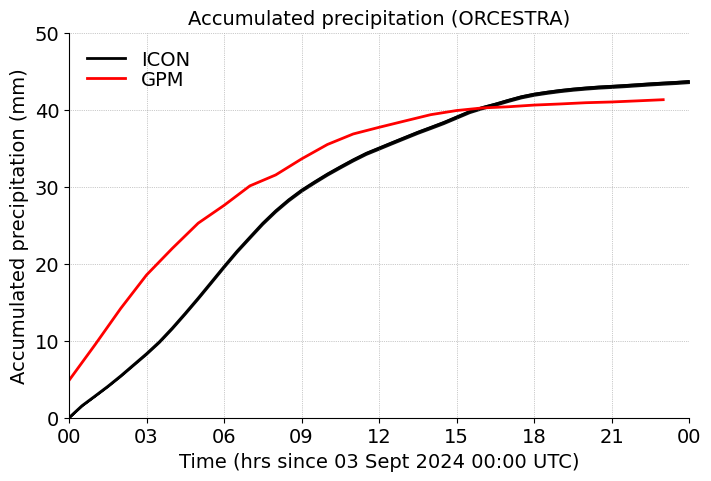

In [58]:

orcestra_prec_rate_ec_ts = np.nanmean(orcestra_precip_rate_ec_3d, axis=(0,1))
orcestra_hrs_ec = np.arange(orcestra_precip_rate_ec_3d.shape[2])

ds_4sip['precip_rate'] = (1./0.5)*ds_4sip.tot_prec.diff('time') # output is half-hourly

ds_4sip_2Sept15utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept15utc.tot_prec.diff('time')
ds_4sip_2Sept18utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept18utc.tot_prec.diff('time')
ds_4sip_2Sept00utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept00utc.tot_prec.diff('time')

tot_acc_prec_4sip = ds_4sip.tot_prec.mean(dim=('ncells'))
tot_acc_prec_2Sept15utc = ds_4sip_2Sept15utc.tot_prec.mean(dim=('ncells'))
tot_acc_prec_2Sept18utc = ds_4sip_2Sept18utc.tot_prec.mean(dim=('ncells'))
tot_acc_prec_2Sept00utc = ds_4sip_2Sept00utc.tot_prec.mean(dim=('ncells'))

std_acc_prec_4sip = ds_4sip.tot_prec.std(dim='ncells')
sem_acc_prec_4sip = ds_4sip.tot_prec.std(dim='ncells')/np.sqrt(ds_4sip.dims['ncells']) # std err of mean

neg_sem_accm_prec_4sip = tot_acc_prec_4sip - sem_acc_prec_4sip
pos_sem_accm_prec_4sip = tot_acc_prec_4sip + sem_acc_prec_4sip

fnt=14;
ln=2;

plt.figure(figsize=(8, 5))

#plt.subplot(1,2,1)
plt.plot(ds_4sip.time, tot_acc_prec_4sip, 'k-', linewidth=ln, label='ICON')

plt.fill_between(ds_4sip.time, neg_sem_accm_prec_4sip, pos_sem_accm_prec_4sip, color='k', alpha=0.9)
#plt.errorbar(ds_4sip.time, tot_acc_prec_4sip, yerr=sem_acc_prec_4sip,
#             fmt='none', ecolor='k', alpha=0.5, capsize=2)


plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylim(0,50)
plt.ylabel("Accumulated precipitation (mm)", fontsize=fnt)
plt.title("Accumulated precipitation (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

In [53]:
tot_acc_prec_4sip.values - sem_acc_prec_4sip.values

array([ 0.        ,  1.54002537,  2.7765497 ,  4.0326086 ,  5.37690101,
        6.80794666,  8.23600678,  9.78037193, 11.55711099, 13.46070039,
       15.42441879, 17.45701619, 19.50078598, 21.47919438, 23.30301275,
       25.11192715, 26.71854726, 28.13805452, 29.38517917, 30.45618052,
       31.4828019 , 32.42175782, 33.33118154, 34.16970298, 34.85778877,
       35.55035018, 36.23170253, 36.90938964, 37.53429581, 38.17025569,
       38.87869814, 39.58940913, 40.1141556 , 40.5555517 , 41.04696911,
       41.5040386 , 41.84476111, 42.09616328, 42.31793529, 42.49886934,
       42.64432903, 42.76970514, 42.8610561 , 42.95992223, 43.07059218,
       43.18325548, 43.28162602, 43.37328485, 43.48720297])

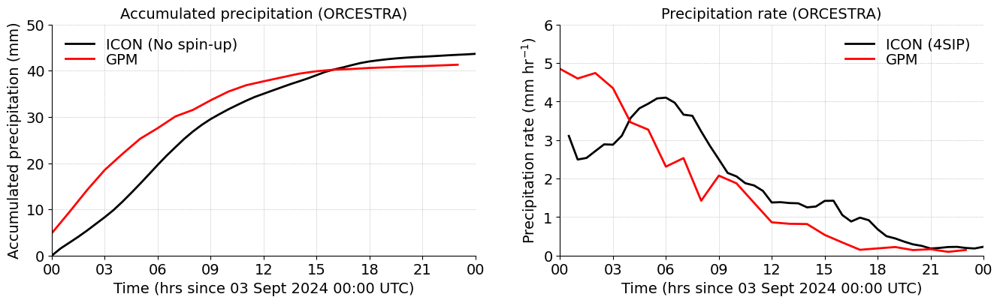

In [32]:

orcestra_prec_rate_ec_ts = np.nanmean(orcestra_precip_rate_ec_3d, axis=(0,1))
orcestra_hrs_ec = np.arange(orcestra_precip_rate_ec_3d.shape[2])

ds_4sip['precip_rate'] = (1./0.5)*ds_4sip.tot_prec.diff('time') # output is half-hourly

ds_4sip_2Sept15utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept15utc.tot_prec.diff('time')
ds_4sip_2Sept18utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept18utc.tot_prec.diff('time')
ds_4sip_2Sept00utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept00utc.tot_prec.diff('time')

fnt=14;
ln=2;

plt.figure(figsize=(16, 4))

plt.subplot(1,2,1)
plt.plot(ds_4sip.time, ds_4sip.tot_prec.mean(dim=('ncells')), 'k-', linewidth=ln, label='ICON (No spin-up)')
plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylim(0,50)
plt.ylabel("Accumulated precipitation (mm)", fontsize=fnt)
plt.title("Accumulated precipitation (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
plt.plot(ds_4sip.time, ds_4sip.precip_rate.mean(dim=('ncells')), 'k-', linewidth=ln, label='ICON (4SIP)')
plt.plot(orcestra_time, orcestra_prec_rate_ec_ts[:-1], 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylim(0,6)
plt.ylabel("Precipitation rate (mm hr$^{-1}$)", fontsize=fnt)
plt.title("Precipitation rate (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

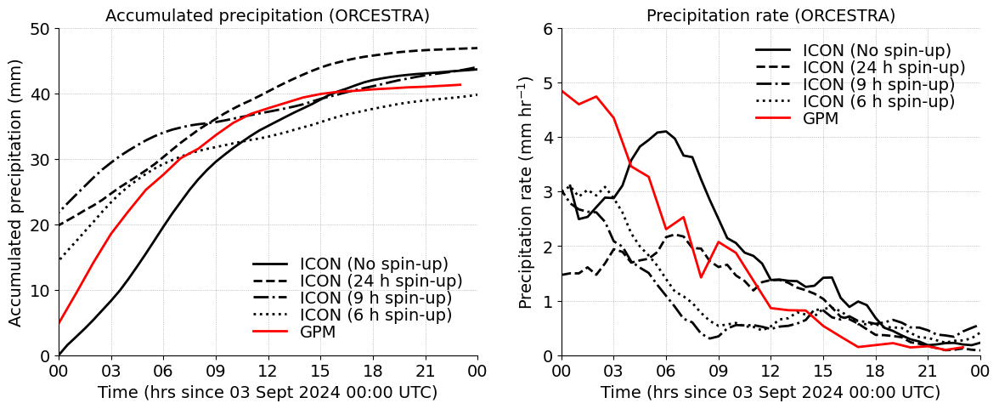

In [30]:

orcestra_prec_rate_ec_ts = np.nanmean(orcestra_precip_rate_ec_3d, axis=(0,1))
orcestra_hrs_ec = np.arange(orcestra_precip_rate_ec_3d.shape[2])

ds_4sip['precip_rate'] = (1./0.5)*ds_4sip.tot_prec.diff('time') # output is half-hourly

ds_4sip_2Sept15utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept15utc.tot_prec.diff('time')
ds_4sip_2Sept18utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept18utc.tot_prec.diff('time')
ds_4sip_2Sept00utc['precip_rate'] = (1./0.5)*ds_4sip_2Sept00utc.tot_prec.diff('time')

fnt=14;
ln=2;

plt.figure(figsize=(14, 5))

plt.subplot(1,2,1)
plt.plot(ds_4sip.time, ds_4sip.tot_prec.mean(dim=('ncells')), 'k-', linewidth=ln, label='ICON (No spin-up)')
plt.plot(ds_4sip_2Sept00utc.time, ds_4sip_2Sept00utc.tot_prec.mean(dim=('ncells')), 'k--', linewidth=ln, label='ICON (24 h spin-up)')
plt.plot(ds_4sip_2Sept15utc.time, ds_4sip_2Sept15utc.tot_prec.mean(dim=('ncells')), 'k-.', linewidth=ln, label='ICON (9 h spin-up)')
plt.plot(ds_4sip_2Sept18utc.time, ds_4sip_2Sept18utc.tot_prec.mean(dim=('ncells')), 'k:', linewidth=ln, label='ICON (6 h spin-up)')
plt.plot(ds_gpm_orc.time, acc_precip_gpm, 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylim(0,50)
plt.ylabel("Accumulated precipitation (mm)", fontsize=fnt)
plt.title("Accumulated precipitation (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
plt.plot(ds_4sip.time, ds_4sip.precip_rate.mean(dim=('ncells')), 'k-', linewidth=ln, label='ICON (No spin-up)')
plt.plot(ds_4sip_2Sept00utc.time, ds_4sip_2Sept00utc.precip_rate.mean(dim=('ncells')), 'k--', linewidth=ln, label='ICON (24 h spin-up)')
plt.plot(ds_4sip_2Sept15utc.time, ds_4sip_2Sept15utc.precip_rate.mean(dim=('ncells')), 'k-.', linewidth=ln, label='ICON (9 h spin-up)')
plt.plot(ds_4sip_2Sept18utc.time, ds_4sip_2Sept18utc.precip_rate.mean(dim=('ncells')), 'k:', linewidth=ln, label='ICON (6 h spin-up)')
plt.plot(orcestra_time, orcestra_prec_rate_ec_ts[:-1], 'r-', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylim(0,6)
plt.ylabel("Precipitation rate (mm hr$^{-1}$)", fontsize=fnt)
plt.title("Precipitation rate (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept 2024 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 4, 0, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

## ICON coarse resolution

In [196]:

ds_4sip_6km

<xarray.Dataset> Size: 204MB
Dimensions:      (time: 49, ncells: 73876, vertices: 3)
Coordinates:
  * time         (time) datetime64[ns] 392B 2024-09-03 ... 2024-09-04
    clon         (ncells) float64 591kB dask.array<chunksize=(73876,), meta=np.ndarray>
    clat         (ncells) float64 591kB dask.array<chunksize=(73876,), meta=np.ndarray>
Dimensions without coordinates: ncells, vertices
Data variables:
    clon_bnds    (time, ncells, vertices) float64 87MB dask.array<chunksize=(1, 73876, 3), meta=np.ndarray>
    clat_bnds    (time, ncells, vertices) float64 87MB dask.array<chunksize=(1, 73876, 3), meta=np.ndarray>
    tot_prec     (time, ncells) float32 14MB dask.array<chunksize=(1, 73876), meta=np.ndarray>
    precip_rate  (time, ncells) float32 14MB dask.array<chunksize=(1, 73876), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.4.0 (https://mpime...
    Conventions:          CF-1.6
    number_of_grid_used:  99
    uuidOfHGrid:          59465688-232f-07a4-44cd-7323788a27c0
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    title:                ICON simulation
    source:               version: 2024.10; revision: e61999fd87ffc1fb6c2fc0e...
    history:              /home/b/b382718/tdf_sip_lfr/icon-oct2024/bin/icon a...
    references:           see MPIM/DWD publications
    comment:              Deepak Waman (b382718) on l10072 (Linux 4.18.0-513....

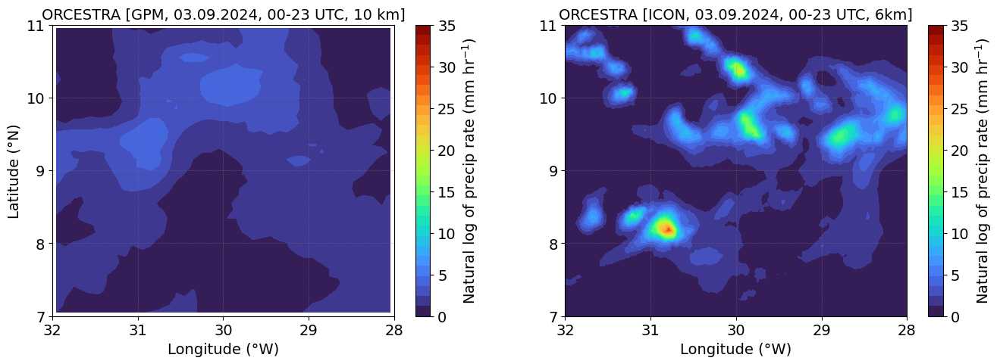

In [209]:

#ds_4sip['precip_rate'] = 0.5*ds_4sip.tot_prec.diff('time')

ds_4sip_6km['precip_rate'] = (1./0.5)*ds_4sip_6km.tot_prec.diff('time') # output is half-hourly

turbo = plt.get_cmap('turbo', 256)

# Convert to list and set the first color to white
# Get the 'turbo' colormap
base_cmap = plt.get_cmap('turbo')

# Convert it to a list of colors
colors = base_cmap(np.linspace(0, 1, 256))

# Replace the first color with white
colors[0] = [1, 1, 1, 1]  # RGBA for white

# Create a new ListedColormap
new_cmap = mcolors.ListedColormap(colors)

fnt = 14;
lev = np.linspace(0,35,30)


plt.figure(figsize=(16,5))

plt.subplot(1,2,1)
cnt=plt.contourf(-1*mean_orcestra_lon_ec, mean_orcestra_lat_ec, (orcestra_mean_prec_rate_24hr.T), levels=lev, cmap=new_cmap);

plt.xlim(32, 28)
plt.ylim(7, 11)

plt.xticks([32, 31, 30, 29, 28], fontsize=fnt)
plt.yticks([7, 8, 9, 10, 11], fontsize=fnt)


plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [GPM, 03.09.2024, 00-23 UTC, 10 km]", fontsize=fnt)

#ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], 
cbar = plt.colorbar(cnt, ticks=[0, 5, 10, 15, 20, 25, 30, 35], orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of precip rate (mm hr$^{-1}$)', size=fnt)

plt.subplot(1,2,2)
cnt=plt.tricontourf(-1*np.rad2deg(ds_4sip_6km.clon), np.rad2deg(ds_4sip_6km.clat), (ds_4sip_6km.precip_rate.mean('time').T), levels=lev, cmap='turbo');
plt.xlim(32, 28)
plt.ylim(7, 11)

plt.xticks([32, 31, 30, 29, 28], fontsize=fnt)
plt.yticks([7, 8, 9, 10, 11], fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Longitude (°W)", fontsize=fnt)
#plt.ylabel("Latitude (°N)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03.09.2024, 00-23 UTC, 6km]", fontsize=fnt)

cbar = plt.colorbar(cnt, ticks=[0, 5, 10, 15, 20, 25, 30, 35], orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of precip rate (mm hr$^{-1}$)', size=fnt)

#plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['right'].set_visible(False)
plt.show()

In [210]:
import cmocean

ModuleNotFoundError: No module named 'cmocean'

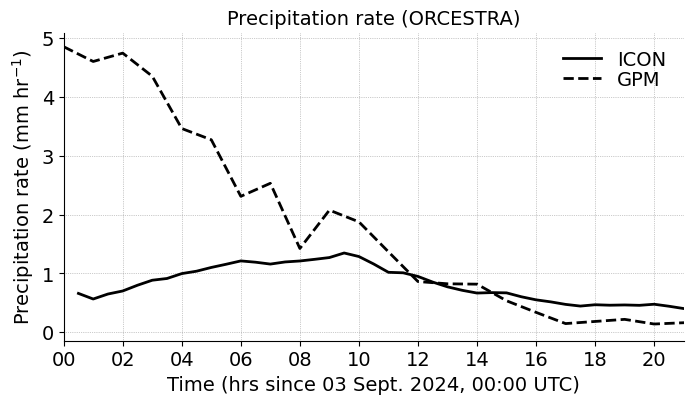

In [200]:

orcestra_prec_rate_ec_ts = np.nanmean(orcestra_precip_rate_ec_3d, axis=(0,1))
orcestra_hrs_ec = np.arange(orcestra_precip_rate_ec_3d.shape[2])

ds_4sip_6km['precip_rate'] = (1./0.5)*ds_4sip_6km.tot_prec.diff('time') # output is half-hourly

fnt=14;
ln=2;

plt.figure(figsize=(8, 4))
plt.plot(ds_4sip_6km.time, ds_4sip_6km.precip_rate.mean(dim=('ncells')), 'k-', linewidth=ln, label='ICON')
plt.plot(orcestra_time, orcestra_prec_rate_ec_ts[:-1], 'k--', linewidth=ln, label='GPM')

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.ylabel("Precipitation rate (mm hr$^{-1}$)", fontsize=fnt)
plt.title("Precipitation rate (ORCESTRA)", fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel('Time (hrs since 03 Sept. 2024, 00:00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2024, 9, 3, 0, 0) 
end_date = datetime(2024, 9, 3, 21, 0)
plt.xlim(start_date, end_date)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

In [136]:

def get_cloud_top(z_mc, mask):
    # z_mc: (height,)
    # mask: (height,)
    # Returns the highest z_mc where mask is True, or NaN if none
    if mask.any():
        return z_mc[mask].min()
    else:
        return np.nan


## Get cloud top height and temperature from simulation

thres = 1.e-6;
cld_mask = ((ds_4sip.qc + ds_4sip.tqi) > thres)

cth = xr.apply_ufunc(
    get_cloud_top,
    ds_4sip['z_mc'],
    cld_mask,
    input_core_dims=[['height'], ['height']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[ds_4sip['z_mc'].dtype],
)

#print(cth.min().values, cth.max().values)


In [282]:

lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip.clon > lon_min) & (ds_4sip.clon < lon_max) &
    (ds_4sip.clat > lat_min) & (ds_4sip.clat < lat_max)
)

#n_true = mask.sum().compute().item()
#print("Number of True:", n_true)

ds_icon = ds_4sip.where(mask)

#clon = np.rad2deg(ds_icon.clon.values)
#clat = np.rad2deg(ds_icon.clat.values)

clon = ds_icon.clon.values
clat = ds_icon.clat.values

#print(clat)

lat_mask = (clat > lat_min) & (clat < lat_max)
#print(lat_mask.sum().item())

ds_filt = ds_icon.sel(time='2024-09-03T16:00:00.000000000')
dbz_filt = ds_filt.dbz

alt_km_filt = ds_filt.z_mc.mean(dim=('ncells'))

dbz_latband = dbz_filt[:, lat_mask]
clon_latband = clon[lat_mask]

dbz_latband = xr.where(dbz_filt > -5., dbz_filt, np.nan)
#plt.contourf()

-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/eff_rad_ctt/GC1SG1_20240903D01D_T0815_L2SG_CLPRK_3000.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_0345[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec0345 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc0345 = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc0345)
time_ec_orc = tim_0345[indices_j]

# Longitude & Latitude
lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




In [114]:
print(tim_0345[1:10])
print(time_ec_orc.shape)
print(tim_0345.shape)
print(lwp_ec_orc.shape)
print(np.nanmin(lwp_0345), np.nanmax(lwp_0345))
print(np.nanmin(lwp_ec_orc), np.nanmax(lwp_ec_orc))

[9.99488719e+08 9.99488720e+08 9.99488722e+08 9.99488723e+08
 9.99488725e+08 9.99488726e+08 9.99488728e+08 9.99488729e+08
 9.99488731e+08]
(2182,)
(1976,)
(1976, 243)
0.0 1319.0
0.0 944.0


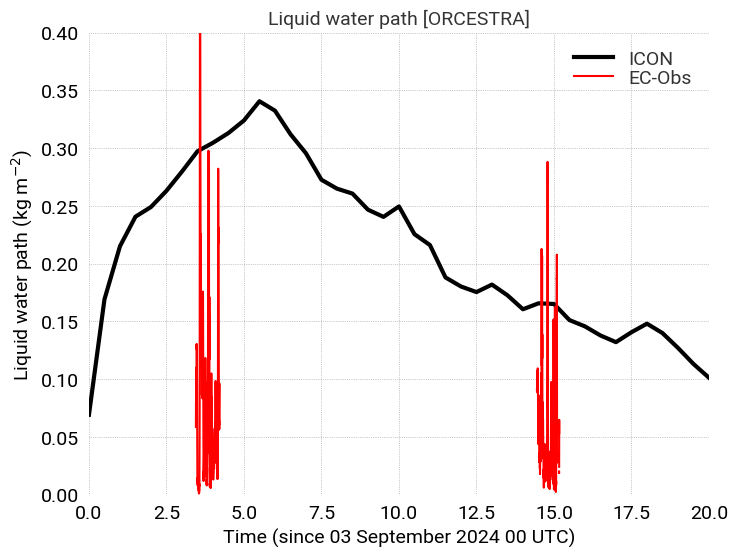

In [225]:

ds_4sip['dz'] = ds_4sip.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip['lwp_kgperm2'] = (ds_4sip.qc*ds_4sip.rho*(-1.*ds_4sip.dz)).sum(dim='height')

avg_lwp_kgperm2 = ds_4sip.lwp_kgperm2.mean('ncells')

time_hr_icon = np.linspace(0,20,41)
time_hr_obs = np.linspace(14.28,15.17,9)

plt.figure(figsize=(8, 6))

lnwdth=3
fontsize=14
plt.plot(time_hr_icon, avg_lwp_kgperm2, 'k-', linewidth=lnwdth, label='ICON')
plt.plot(time_hr_0345, 1.e-3*avg_lwp_0345, 'r-', label='EC-Obs')
plt.plot(time_hr_1427, 1.e-3*avg_lwp_1427, 'r-')#, label='EC-Obs')

plt.xlabel('Time (since 03 September 2024 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')

plt.xlim(0,20)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
#start_date = datetime(2024, 9, 3, 0, 0) 
#end_date = datetime(2024, 9, 3, 20, 0)

#plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0, 0.4)
plt.yticks(fontsize=fontsize)
plt.ylabel('Liquid water path (kg m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Liquid water path [ORCESTRA]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.show()

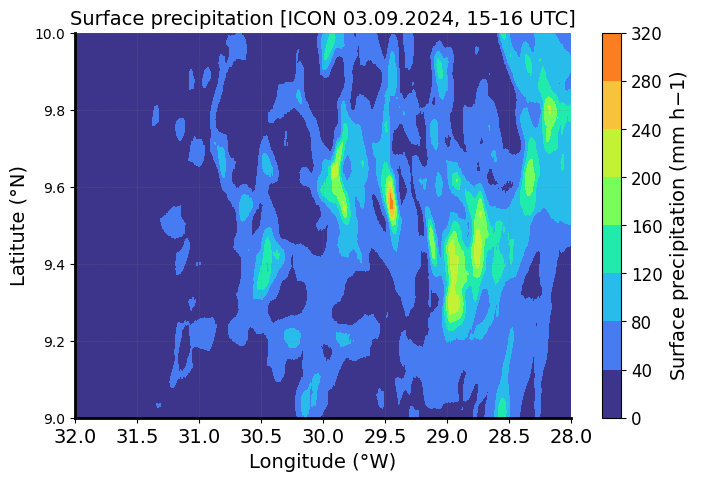

In [127]:

cmap = plt.get_cmap('turbo')
cmap.set_bad(color='white')

ds_4sip['avg_prec_rate'] = ds_4sip.precip_rate.mean(dim='time')
min_val = ds_4sip.avg_prec_rate.where(ds_4sip.avg_prec_rate > 0.2).min().compute().item()
max_val = ds_4sip.avg_prec_rate.max().values

lev = np.linspace(min_val, max_val, 30)
lnwdth = 3;
fontsize = 14;

plt.figure(figsize=(8, 5))

contour=plt.tricontourf(clon_deg, clat_deg, ds_4sip.rain_gsp.mean('time').T, vmin=0, vmax=400, cmap='turbo')#, levels=lev)
#plt.tricontourf(clon_deg, clat_deg, np.nanmean(precip_masked, axis=0).T, cmap=cmap, levels=100)
colorbar = plt.colorbar()#contour, ticks=[0, 1, 2, 3, 4, 5, 6], label='Surface precipitation (mm h${-1}$)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Surface precipitation (mm h${-1}$)', size=fontsize)
plt.xlim([32, 28]); 
plt.ylim([9, 10]); 
plt.xticks([32, 31.5, 31, 30.5, 30, 29.5, 29, 28.5, 28], fontsize=fontsize)
#plt.yticks([7, 8, 9, 10, 11], fontsize=fontsize)
plt.xlabel('Longitude (°W)',fontsize=fontsize)
plt.ylabel('Latitute (°N)',fontsize=fontsize)
plt.title('Surface precipitation [ICON 03.09.2024, 15-16 UTC]',fontsize=fontsize)  

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

(9.0, 10.0)

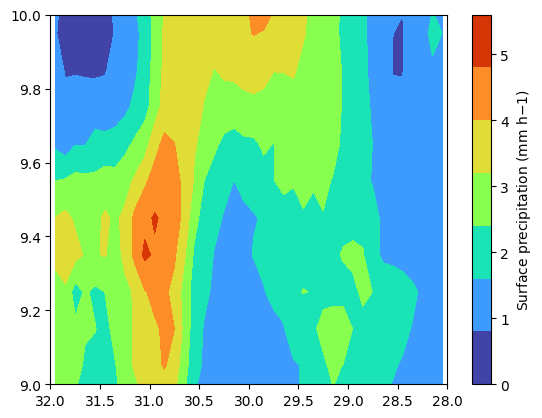

In [123]:

contour=plt.contourf(-1*ds_gpm_orc.lon, ds_gpm_orc.lat, ds_gpm_orc.precip_rate.mean('time').T, vmin=0, vmax=6, cmap='turbo')#, levels=lev)
plt.colorbar(contour, ticks=[0, 1, 2, 3, 4, 5, 6], label='Surface precipitation (mm h${-1}$)')
plt.xlim(32,28)
plt.ylim(7,11)

In [20]:
import xesmf as xe

In [26]:

source_grid = {
    'lon': ds_4sip['clon'].values,
    'lat': ds_4sip['clat'].values,
}

In [ ]:


grid_r3b7 = xr.open_mfdataset('/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/control/orcestra_2mom_sip/domain4_DOM04.nc')

lon_coarse = np.degrees(grid_r3b7.clon.values)
lat_coarse = np.degrees(grid_r3b7.clat.values)

target_grid = xr.Dataset({
    'lon': (['cell'], lon_coarse),
    'lat': (['cell'], lat_coarse)
})

regridder = xe.Regridder(
    ds_in=source_grid,
    ds_out=target_grid,
    method='conservative_normed',  # works better for unstructured
    unmapped_to_nan=True,
    reuse_weights=False
)

# Regrid precipitation 
tot_prec_regridded = regridder(ds_4sip['tot_prec'])


In [3]:

def calc_dewpoint(tempc, rh):
    dewpoint = tempc - ((100. - rh)/5.)
    return dewpoint


def calc_tdew(t, rh):        # Magnus-Tetens approximation
    a = 17.27; b = 237.7;
    alpha = (a*t/(b+t)) + np.log(rh/100)
    td = b*alpha/(a-alpha)
    return td
    
def calc_vir_temp(tc, q):
    #virt_tempk_wk = t/(1. - (ev/p)*(1-0.622))
    temp = tc + (1-0.622*q)
    return temp
    
def calculate_lcl(pressure, temperature, dewpoint):
    l = np.argmin(np.abs(temperature - dewpoint))
    return pressure[l], temperature[l]

def calc_lcl(t, td):
    lcl = td + 125.*(t-td)
    return lcl
    
def e_sat_hpa(tc):
    e_sat_pa = 6.112*np.exp((17.67*tc)/(tc+243.5))
    return e_sat_pa

def calc_parcel_temp(pres, ht, q_sat, tk_lcl):
    grav = 9.8  # acceleration due to gravity [m/s^2]
    eps = 0.622  # ratio of the gas constants for water vapor and dry air
    Rd = 287.  # specific gas constant for dry air [J/(kg*K)]
    cp = 1005.  # specific heat capacity at constant pressure for dry air [J/(kg*K)]
    lv = 2.5e6  # latent heat of vaporization [J/kg]
    Rv = 461.  # specific gas constant for water vapor [J/(kg*K)]

    tk_parcel = np.zeros(len(ht))  
    del_t_par = np.zeros(len(ht))  

    tk_parcel[0] = tk_lcl + 273.15 
    
    for i in range(1, len(ht)):
        dht = ht[i] - ht[i - 1]  
        qs = q_sat[i]  
        term_a = 1. + lv * qs / (Rd * tk_parcel[i - 1])
        term_b = (lv ** 2.) * eps * qs
        term_c = Rd * (tk_parcel[i - 1]) ** 2.
        
        del_t_par[i] = grav * term_a / (cp + (term_b / term_c))

        tk_parcel[i] = tk_parcel[i - 1] - del_t_par[i] * dht
        
    tempc = tk_parcel - 273.15
    return tempc

import numpy as np



def calc_cape(pres, t_env, t_par, tv_env, tv_par):
    """
    Calculate Convective Available Potential Energy (CAPE).
    
    Parameters:
        pres (array): Pressure levels (hPa or Pa).
        t_env (array): Environmental temperature (°C).
        t_par (array): Parcel temperature (°C).
        tv_env (array): Environmental virtual temperature (°C).
        tv_par (array): Parcel virtual temperature (°C).
    
    Returns:
        cape (float): CAPE value (J/kg).
    """
    Rd = 287.0  # gas constant for dry air (J/kg/K)
    
    # Convert temperatures to Kelvin
    tk_env = t_env + 273.15
    tk_v_env = tv_env + 273.15
    tk_par = t_par + 273.15
    tk_v_par = tv_par + 273.15
    
    cape = 0.0
    
    # Loop through pressure levels
    for i in range(1, len(pres)):
        # Check if parcel is warmer than the environment
        if tk_v_par[i] > tk_v_env[i]:
            # Calculate logarithmic pressure difference
            dlnp = np.log(pres[i-1] / pres[i])
            cape = cape + Rd * (tk_v_par[i] - tk_v_env[i]) * dlnp
    return cape
        

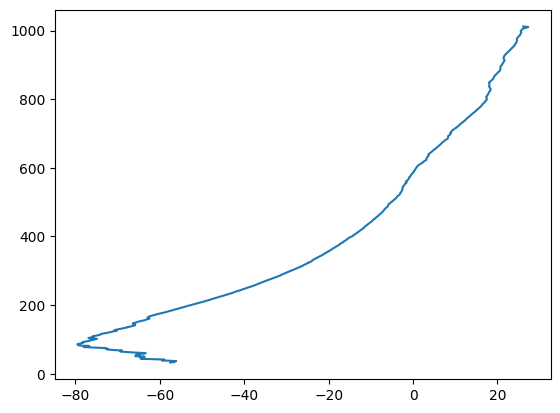

In [5]:
file_path = '/work/bk1415/b382718/output/orcestra/observations/wyoming_sonde/sonde_orcestra_20240903_1200UTC'
column_names = ['pres', 'height', 'temp', 'Tdew', 'relhum', 'qv', 'w_dir', 'w_wind', 'theta', 'theta_e', 'theta_v']


# Specify invalid values (strings or other markers for missing data)
invalid_values = ['-----------------------------------------------------------------------------', '9999.0', '999.0']

# Read the data and replace invalid values with NaN
ds_sonde = pd.read_csv(file_path, sep='\s+', skiprows=6, names=column_names, na_values=invalid_values)

# drop rows with NaN values if needed
ds_sonde.dropna(inplace=True)


temp_sonde = ds_sonde.temp.values
pres_sonde = ds_sonde.pres.values
tdew_sonde = ds_sonde.Tdew.values
rh_sonde = ds_sonde.relhum.values
qv_sonde = ds_sonde.qv.values
w_sonde = ds_sonde.w_wind.values
ht_sonde = ds_sonde.height.values

plt.style.use('default')
plt.plot(temp_sonde, pres_sonde)

In [12]:
ds_4sip.time[24]

<xarray.DataArray 'time' ()>
array('2024-09-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2024-09-03T12:00:00
Attributes:
    standard_name:  time
    axis:           T

Tenv    ::  [ 25.472301   25.102497   24.697054   24.264956   23.847887   23.441639
  23.044283   22.65701    22.262733   21.851585   21.42618    20.985214
  20.5164     20.013956   19.469633   18.894772   18.294472   17.667616
  17.003273   16.33308    15.616732   14.869071   14.097094   13.298925
  12.463171   11.583893   10.66444     9.718272    8.737001    7.729309
   6.6857643   5.6324406   4.5390754   3.3691444   2.157193    0.9753825
  -0.1675019  -1.4445887  -2.7727835  -4.1448     -5.607413   -7.155437
  -8.803791  -10.689388  -12.701304  -14.897587  -17.16448   -19.48239
 -21.997797  -24.785824  -27.889805  -31.305443  -34.981346  -38.979004
 -43.344913  -48.040936  -53.05474   -58.342712  -63.43048   -67.92141
 -72.30739   -76.134026  -78.61002   -70.58618   -63.699135 ]
Tparcel ::  [ 2.34416389e+01  2.33515918e+01  2.32197732e+01  2.30573637e+01
  2.28685845e+01  2.26558342e+01  2.24206675e+01  2.21641810e+01
  2.18870746e+01  2.15897641e+01  2.12725122e+01  2.09354437e+01


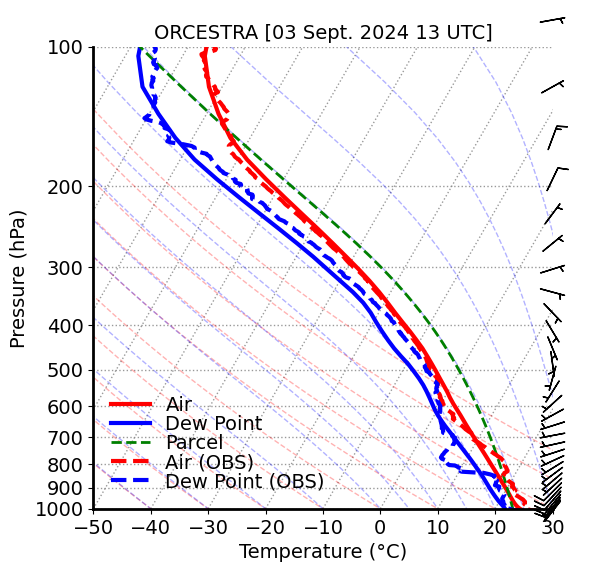

In [11]:

ds_skewt = ds_4sip.sel(time=ds_4sip.time[24])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

   
temp_dew = calc_dewpoint(tempc, rel_hum)
#temp_dew = calc_tdew(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

#----- Calculate parcel properties
e_sat = e_sat_hpa(avg_tempc)
q_sat = 0.622*e_sat/(avg_pres-e_sat)

lcl_pressure, lcl_temp = calculate_lcl(avg_pres, avg_tempc, avg_dewtempc)
#lcl_temp = calc_lcl(avg_tempc[0], avg_dewtempc)
parcel_temp = calc_parcel_temp(avg_pres, avg_ht, 1.5*q_sat, lcl_temp)
Tv_env = calc_vir_temp(avg_tempc, avg_qv)
Tv_parcel = calc_vir_temp(parcel_temp, 1.5*q_sat)
parcel_cape = calc_cape(avg_pres, avg_tempc, parcel_temp, Tv_env, Tv_parcel)
print('Tenv    :: ', avg_tempc)
print('Tparcel :: ', parcel_temp)
print('LCL :: ', lcl_temp)
print('CAPE :: ',parcel_cape)
#------

# Create the Skew-T plot
fontsize=14;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(8, 6))
skew = SkewT(fig)

# Plot temperature and dew point on the Skew-T
skew.plot(avg_pres, avg_tempc, 'r-', label='Air', linewidth=lnwdth)
#skew.plot(avg_pres, calc_dewpoint(avg_tempc, avg_rh), 'b-.', label='Dew Point', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point', linewidth=lnwdth)
skew.plot(avg_pres, parcel_temp, 'g--', label='Parcel', linewidth=lnwdth-1)

skew.plot(pres_sonde* units.hPa, temp_sonde* units.degC, 'r--', label='Air (OBS)', linewidth=lnwdth)
skew.plot(pres_sonde* units.hPa, tdew_sonde* units.degC, 'b--', label='Dew Point (OBS)', linewidth=lnwdth)

# Add wind barbs 
if 'u' in ds_skewt and 'v' in ds_skewt:
    u_wind = avg_u  # Zonal wind component
    v_wind = avg_v  # Meridional wind component
    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-50, 30)
ax.set_ylim(1000., 100)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
plt.title('ORCESTRA [03 Sept. 2024 13 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

<xarray.DataArray 'time' ()> Size: 8B
array('2024-09-03T01:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2024-09-03T01:00:00
Attributes:
    standard_name:  time
    axis:           T
LCL  ::  21.415512
CAPE ::  1095.2802059779829 joule / kilogram
CIN ::  0 joule / kilogram


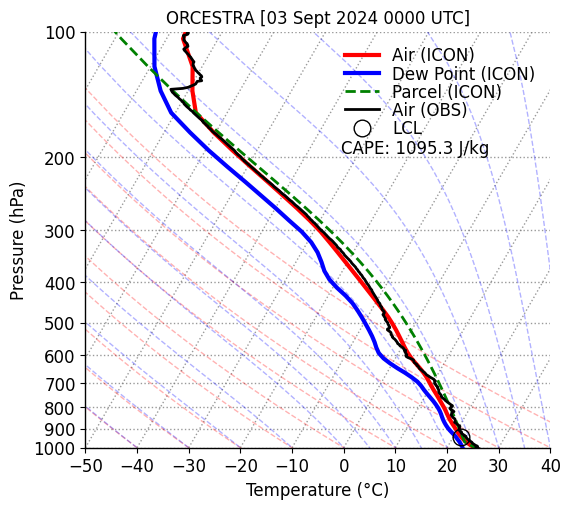

In [13]:
from metpy.calc import dewpoint_from_relative_humidity
from metpy.units import units
from metpy.calc import parcel_profile
from metpy.calc import cape_cin



### Obs
file_path = '/work/bk1415/b382718/output/orcestra/observations/wyoming_sonde/sonde_orcestra_20240903_0000UTC'
column_names = ['pres', 'height', 'temp', 'Tdew', 'relhum', 'qv', 'w_dir', 'w_wind', 'theta', 'theta_e', 'theta_v']


# Specify invalid values (strings or other markers for missing data)
invalid_values = ['-----------------------------------------------------------------------------', '9999.0', '999.0']

# Read the data and replace invalid values with NaN
ds_sonde = pd.read_csv(file_path, sep='\s+', skiprows=6, names=column_names, na_values=invalid_values)

ds_sonde.dropna(inplace=True)

temp_sonde = ds_sonde.temp.values
pres_sonde = ds_sonde.pres.values
tdew_sonde = ds_sonde.Tdew.values
rh_sonde = ds_sonde.relhum.values
qv_sonde = ds_sonde.qv.values
w_sonde = ds_sonde.w_wind.values
ht_sonde = ds_sonde.height.values
### end obs

### ICON
ds_skewt = ds_4sip.sel(time=ds_4sip.time[2])

print(ds_4sip.time[2])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

   
temp_dew = calc_dewpoint(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

e_sat = e_sat_hpa(avg_tempc)
q_sat = 0.622*e_sat/(avg_pres-e_sat)

lcl_pressure, lcl_temp = calculate_lcl(avg_pres, avg_tempc, avg_dewtempc)
#lcl_temp = calc_lcl(avg_tempc[0], avg_dewtempc)
print('LCL  :: ', lcl_temp)

### Parcel properties from ICON
temperature_K = (avg_tempc + 273.15) * units.K
relative_humidity = avg_rh / 100.0  # Convert to fraction

dewpoint = dewpoint_from_relative_humidity(temperature_K, relative_humidity)
avg_dewtempc = dewpoint.magnitude #- 273.15

pressure = avg_pres * units.hPa
temperature = avg_tempc * units.degC
dewpoint = avg_dewtempc * units.degC

parcel_tempk = parcel_profile(pressure, temperature[0], dewpoint[0])  # First level
parcel_tempc = parcel_tempk.magnitude-273.15

parcel_tempc = parcel_tempc * units.degC
cape, cin = cape_cin(pressure, temperature, dewpoint, parcel_tempc)

print('CAPE :: ', cape)
print('CIN :: ', cin)
### End parcel properties
### End ICON

# Create the Skew-T plot
fontsize=12;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(6, 8))
skew = SkewT(fig)

# Plot temperature and dew point on the Skew-T
skew.plot(avg_pres, avg_tempc, 'r-', label='Air (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, parcel_tempc, 'g--', label='Parcel (ICON)', linewidth=lnwdth-1)
skew.plot(pres_sonde* units.hPa, temp_sonde* units.degC, 'k-', label='Air (OBS)', linewidth=lnwdth-1)

skew.plot(lcl_pressure, lcl_temp, 'ko', markerfacecolor='none', markersize=12, label='LCL')

# Add wind barbs 
#if 'u' in ds_skewt and 'v' in ds_skewt:
#    u_wind = avg_u  # Zonal wind component
#    v_wind = avg_v  # Meridional wind component
#    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-50, 40)
ax.set_ylim(1000., 100)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)

#ax.text(0.02, 0.95, f'CAPE: {cape.m:.1f} J/kg\nCIN: {cin.m:.1f} J/kg', transform=ax.transAxes, fontsize=fontsize, verticalalignment='top')
ax.text(0.55, 0.74, f'CAPE: {cape.m:.1f} J/kg', transform=ax.transAxes, fontsize=fontsize, verticalalignment='top')

plt.title('ORCESTRA [03 Sept 2024 0000 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='upper right')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()


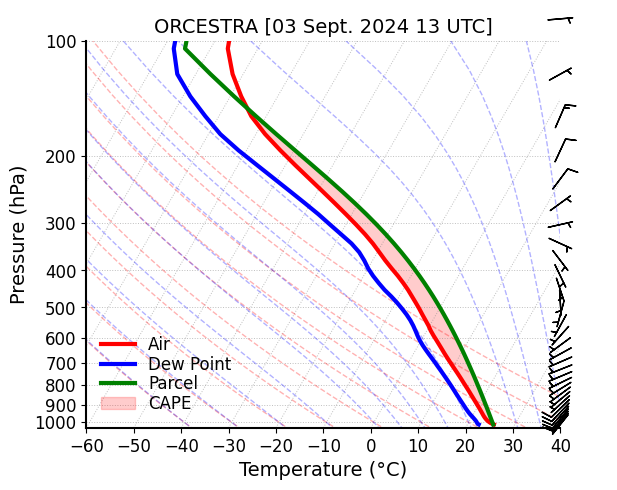

In [87]:
ds_skewt = ds_4sip.sel(time=ds_4sip.time[26])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

   
temp_dew = calc_dewpoint(tempc, rel_hum)
#temp_dew = calc_tdew(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

# Create the Skew-T plot
fontsize=14;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(8, 5))
skew = SkewT(fig)

skew.plot(avg_pres, avg_tempc, 'r-', label='Air', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point', linewidth=lnwdth)

skew.plot_dry_adiabats(linewidth=1, alpha=alpha, linestyle='--')
skew.plot_moist_adiabats(linewidth=1, alpha=alpha, linestyle='--')

moist_adiabats = skew.moist_adiabats

# Now, we'll plot parcel path (that follows moist adiabatic line between LFC and LNB)
# We basically skip calculation of parcel temperature and CAPE and make use of the SKEWT plot itself

adiabat_profiles = []
for path in moist_adiabats.get_paths():
    temp_pres = path.vertices
    # We now interpolate temp_pres on available pressure levels
    adiabat_temp = np.interp(avg_pres, 
                           temp_pres[:,1][::-1],  # Pressure values
                           temp_pres[:,0][::-1])  # Temperature values
    adiabat_profiles.append(adiabat_temp)

# Find intersections between environmental temp and moist adiabats (these intersection points are LFC and LNB)
crossing_points = []
for i in range(len(avg_pres)-1):
    for j, adiabat in enumerate(adiabat_profiles):
        if ((avg_tempc[i] > adiabat[i] and avg_tempc[i+1] <= adiabat[i+1]) or 
            (avg_tempc[i] < adiabat[i] and avg_tempc[i+1] >= adiabat[i+1])):
            crossing_points.append((i, j))

# Process crossing points to find LFC and LNB
if len(crossing_points) >= 2:
    # Sort by pressure (descending)
    crossing_points.sort(key=lambda x: avg_pres[x[0]], reverse=True)
    
    lfc_idx, lfc_adiabat_idx = crossing_points[0]
    lnb_idx, lnb_adiabat_idx = crossing_points[-1]
    
    # Create parcel temperature line
    parcel_temp = np.full_like(avg_tempc, np.nan)
    parcel_temp[lfc_idx:lnb_idx+1] = adiabat_profiles[lfc_adiabat_idx][lfc_idx:lnb_idx+1]
    
    # Plot parcel path
    skew.plot(avg_pres, parcel_temp, 'g-', linewidth=lnwdth, label='Parcel')
    
    # Shade CAPE area
    skew.ax.fill_betweenx(avg_pres[lfc_idx:lnb_idx+1],
                        avg_tempc[lfc_idx:lnb_idx+1],
                        parcel_temp[lfc_idx:lnb_idx+1],
                        where=parcel_temp[lfc_idx:lnb_idx+1] > avg_tempc[lfc_idx:lnb_idx+1],
                        color='red', alpha=0.2, label='CAPE')

    # Mark LFC and LNB
    skew.plot(avg_pres[lfc_idx], avg_tempc[lfc_idx], 'k', markersize=10, markeredgewidth=2)#, label='LFC')
    skew.plot(avg_pres[lnb_idx], avg_tempc[lnb_idx], 'k', markersize=10, markeredgewidth=2)#, label='LNB')
    
    # Add text labels
    #plt.text(avg_tempc[lfc_idx]-2, avg_pres[lfc_idx]-10, 'LFC', 
    #        fontsize=fontsize-2, ha='right', va='top')
    #plt.text(avg_tempc[lnb_idx]+2, avg_pres[lnb_idx]+10, 'LNB', 
    #        fontsize=fontsize-2, ha='left', va='bottom')

# Add wind barbs if available
if 'u' in ds_skewt and 'v' in ds_skewt:
    u_wind = avg_u  # Zonal wind component
    v_wind = avg_v  # Meridional wind component
    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Configure plot appearance
ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-60, 40)
ax.set_ylim(avg_pres[0]+20, 100)
ax.tick_params(axis='both', labelsize=fontsize-2)

plt.title('ORCESTRA [03 Sept. 2024 13 UTC]', fontsize=fontsize)#, pad=20)

plt.legend(frameon=False, handlelength=2, labelspacing=0.1, fontsize=fontsize-2, loc='lower left')#, bbox_to_anchor=(0.7, 0.95))

plt.grid(True, linestyle=':', linewidth=0.7, color='grey', alpha=0.5)

# Clean up borders
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


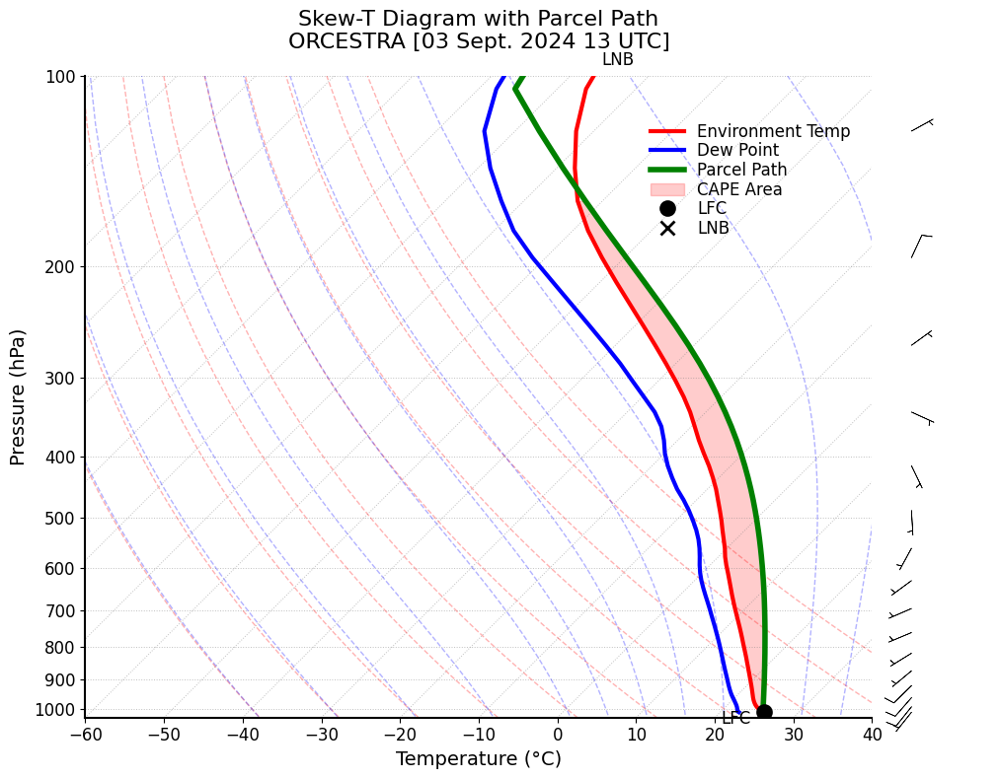

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT

# Assuming you've already calculated these arrays from your dataset:
# avg_pres, avg_tempc, avg_dewtempc, etc.

# Create the Skew-T plot
fontsize = 14
lnwdth = 3
alpha = 0.3

fig = plt.figure(figsize=(10, 8))
skew = SkewT(fig, rotation=45)

# Plot environmental temperature and dew point
skew.plot(avg_pres, avg_tempc, 'r-', label='Environment Temp', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point', linewidth=lnwdth)

# Add adiabats (must plot them first to access later)
skew.plot_dry_adiabats(linewidth=1, alpha=alpha, linestyle='--')
skew.plot_moist_adiabats(linewidth=1, alpha=alpha, linestyle='--')

# Get moist adiabats from the plot
moist_adiabats = skew.moist_adiabats

# Extract temperature values from adiabat paths
adiabat_profiles = []
for path in moist_adiabats.get_paths():
    temp_pres = path.vertices
    # Interpolate to our pressure levels (pressure is y-axis)
    adiabat_temp = np.interp(avg_pres, 
                           temp_pres[:,1][::-1],  # Pressure values
                           temp_pres[:,0][::-1])  # Temperature values
    adiabat_profiles.append(adiabat_temp)

# Find intersections between environmental temp and moist adiabats
crossing_points = []
for i in range(len(avg_pres)-1):
    for j, adiabat in enumerate(adiabat_profiles):
        if ((avg_tempc[i] > adiabat[i] and avg_tempc[i+1] <= adiabat[i+1]) or 
            (avg_tempc[i] < adiabat[i] and avg_tempc[i+1] >= adiabat[i+1])):
            crossing_points.append((i, j))

# Process crossing points to find LFC and LNB
if len(crossing_points) >= 2:
    # Sort by pressure (descending)
    crossing_points.sort(key=lambda x: avg_pres[x[0]], reverse=True)
    
    lfc_idx, lfc_adiabat_idx = crossing_points[0]
    lnb_idx, lnb_adiabat_idx = crossing_points[-1]
    
    # Create parcel temperature line
    parcel_temp = np.full_like(avg_tempc, np.nan)
    parcel_temp[lfc_idx:lnb_idx+1] = adiabat_profiles[lfc_adiabat_idx][lfc_idx:lnb_idx+1]
    
    # Plot parcel path
    skew.plot(avg_pres, parcel_temp, 'g-', linewidth=lnwdth+1, label='Parcel Path')
    
    # Shade CAPE area
    skew.ax.fill_betweenx(avg_pres[lfc_idx:lnb_idx+1],
                        avg_tempc[lfc_idx:lnb_idx+1],
                        parcel_temp[lfc_idx:lnb_idx+1],
                        where=parcel_temp[lfc_idx:lnb_idx+1] > avg_tempc[lfc_idx:lnb_idx+1],
                        color='red', alpha=0.2, label='CAPE Area')
    
    # Mark LFC and LNB
    skew.plot(avg_pres[lfc_idx], avg_tempc[lfc_idx], 'ko', 
             markersize=10, markeredgewidth=2, label='LFC')
    skew.plot(avg_pres[lnb_idx], avg_tempc[lnb_idx], 'kx', 
             markersize=10, markeredgewidth=2, label='LNB')
    
    # Add text labels
    plt.text(avg_tempc[lfc_idx]-2, avg_pres[lfc_idx]-10, 'LFC', 
            fontsize=fontsize-2, ha='right', va='top')
    plt.text(avg_tempc[lnb_idx]+2, avg_pres[lnb_idx]+10, 'LNB', 
            fontsize=fontsize-2, ha='left', va='bottom')

# Add wind barbs if available
if 'avg_u' in locals() and 'avg_v' in locals():
    n = max(1, len(avg_pres)//15)  # Plot every nth level
    skew.plot_barbs(avg_pres[::n], avg_u[::n], avg_v[::n], 
                   xloc=1.05, length=6, linewidth=0.5)

# Configure plot appearance
ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-60, 40)
ax.set_ylim(avg_pres[0]+20, 100)
ax.tick_params(axis='both', labelsize=fontsize-2)

plt.title('Skew-T Diagram with Parcel Path\nORCESTRA [03 Sept. 2024 13 UTC]', 
         fontsize=fontsize+2, pad=20)

plt.legend(frameon=False, handlelength=2, labelspacing=0.1, 
          fontsize=fontsize-2, loc='upper left', bbox_to_anchor=(0.7, 0.95))

plt.grid(True, linestyle=':', linewidth=0.7, color='grey', alpha=0.5)

# Clean up borders
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()
